---
# **TFM Predicción de productos financieros**
---

* **Titulación:** Máster Universitario en Big Data y Ciencia de datos
* **Universidad:** Universidad Internacional de Valencia
* **Directora del TFM:** Ana Lorena Jiménez Preciado
* **Alumno:** Roberto Asensio Durán
* **Curso académico:** 2023 - 2024
* **Fecha:** Abril 2024


## **Resumen**


Este cuaderno, parte integral del Trabajo de Fin de Máster en Big Data y Ciencia de Datos, en este trabajo se va a realizar un estudio de los productos financieros y mercados más importantes en la actualidad para obtener un sistema recomendador de inversión. El objetivo fundamental de este trabajo es proporcionar herramientas exitosas para la toma de decisiones en el ámbito financiero, contribuyendo así al avance del conocimiento en el campo de la ciencia de datos aplicada a la gestión de activos financieros. En primer lugar, se requiere aplicar de técnicas de extracción de datos evaluando los diferentes recursos disponibles. Seguidamente se aplicarán diferentes técnicas estadísticas visualización y de aprendizaje automático para resolver un problema propio de minería de datos después se aplicarán técnicas avanzadas de análisis de datos y desarrollaran modelos predictivos. Se aplica un proceso completo de KDD para obtener un sistema de predicción evaluando diferentes técnicas y obtener los mejores resultados para la inversión en productos financieros como acciones en bolsa.

---
# **Análisis Exploratorio de Datos**
---

El Análisis Exploratorio de Datos (EDA), una fase esencial en cualquier proyecto de análisis de datos o modelado estadístico, se define como un proceso crítico en la investigación y el análisis de datos. Esta metodología, conocida por sus siglas en inglés como Exploratory Data Analysis (EDA), desempeña un papel fundamental al resumir las características principales de un conjunto de datos, comprender su estructura, identificar patrones, detectar anomalías y generar hipótesis.

La finalidad principal del EDA radica en proporcionar una visión inicial y profunda de los datos antes de embarcarse en análisis más avanzados o modelado estadístico, contribuyendo así a una comprensión completa y fundamentada del conjunto de datos en cuestión.

## **Inicialización**

En esta sección, se presentará la configuración de la Unidad de Procesamiento Gráfico (GPU, por sus siglas en inglés) que se utilizará para llevar a cabo el desarrollo y la ejecución del código fuente. Además, se procederá a la configuración del entorno. Posteriormente, se abordará el proceso de carga de datos, donde se incorporarán los conjuntos de datos relevantes para el análisis.

### **Información de la GPU.**

A continuación, se detalla la información relevante acerca de la GPU asignada para llevar a cabo el trabajo. Se proporcionará una descripción de las especificaciones técnicas de la GPU.





In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Apr  6 08:54:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### **Configuración del Entorno.**

A continuación, procederemos con la instalación de los paquetes necesarios y la importación de las librerías requeridas para la ejecución del proyecto.

In [ ]:
# Instalación de paquetes.
!pip -q install yfinance
!pip -q install pmdarima
!pip -q install prophet
!pip -q install kneed

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 16.6 MB/s eta 0:00:00


In [ ]:
# Importación de Librerias

# Manipulación y tratamiento de datos.
import pandas as pd
import numpy as np

# Modelación Arima
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

# Modelo Auto-Arima
import pmdarima as pm
from pmdarima import auto_arima
import tensorflow as tf
from statsmodels.tsa.stattools import acf

# RandomForest
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Prophet
from prophet import Prophet

# XGBoost
from xgboost import XGBRegressor

# LSTM
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn import metrics

# SVM
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.model_selection import learning_curve

# Librerías gráficas para visualización de datos.
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
sns.set_style("white")
plt.rcParams['lines.color'] = 'dodgerblue'  # Configurar el color predeterminado en azul
plt.style.use('ggplot')
import kneed # Método del codo

# Librerías comunes
from datetime import datetime
import yfinance as yf

# División conjunto de datos
from sklearn.model_selection import train_test_split

# Métrica de Evaluación
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
from sklearn import metrics
from statsmodels.stats.diagnostic import acorr_ljungbox

# Eliminar advertencias
import warnings
warnings.filterwarnings("ignore")

### **Carga de datos.**

En esta sección, se procederá a cargar los datos de los activos financieros correspondiente a las siete empresas del IBEX 35, subyacentes del sector financiero, en las que se centrará el estudio, junto con el índice bursátil de referencia IBEX 35 en el período de tiempo especificado.

In [ ]:
# Cargar datos de Yahoo Finance
tickers = [ 'BBVA.MC', # BBVA
            'SAB.MC',  # Banco Sabadell
            'SAN.MC',  # Banco Santander
            'BKT.MC',  # Bankinter
            'CABK.MC', # Caixa Bank
            'MAP.MC',  # MAPFRE
            'UNI.MC'   # UNICAJA
            ,'^IBEX'   # IBEX35
            ]
numero_de_tickers = len(tickers)
start_date = '2005-01-01'
end_date = '2023-12-31'

data = pd.DataFrame()
# Se selecciona unicamiente el precio de cierre para cada activo financiero
data = yf.download(tickers, start=start_date, end=end_date, progress=False)['Adj Close']

# Copia de datos para conservar los datos originales en futuras comparaciones
data_original = data.copy()
data

Ticker,BBVA.MC,BKT.MC,CABK.MC,MAP.MC,SAB.MC,SAN.MC,UNI.MC,^IBEX
Date,,,,,,,,
2005-01-03,4.939929,0.696828,NaN,0.748647,1.351752,2.794742,NaN,9124.090820
2005-01-04,4.913592,0.693805,NaN,0.752734,1.359565,2.794742,NaN,9119.991211
2005-01-05,4.887259,0.693271,NaN,0.741835,1.351752,2.755250,NaN,9024.391602
2005-01-06,4.887259,0.693271,NaN,0.728891,1.351752,2.755250,NaN,NaN
2005-01-07,4.936166,0.703516,NaN,0.737747,1.336125,2.743101,NaN,9041.090820
...,...,...,...,...,...,...,...,...
2023-12-21,8.232000,5.695436,3.435966,1.947000,1.098566,3.793000,0.9000,10104.299805
2023-12-22,8.238000,5.695436,3.423094,1.953000,1.101000,3.808000,0.8950,10111.900391
2023-12-27,8.242000,5.711385,3.431369,1.952000,1.102000,3.810000,0.9045,10121.799805


### **Primer análisis exploratorio.**

A continuación, realizamos un primer análisis exploratorio comprobando el tamaño del conjunto de datos y visualizando las diferentes características con su tipo.

In [ ]:
# Mostramos la información de los datos
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4861 entries, 2005-01-03 to 2023-12-29
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BBVA.MC  4860 non-null   float64
 1   BKT.MC   4860 non-null   float64
 2   CABK.MC  4146 non-null   float64
 3   MAP.MC   4860 non-null   float64
 4   SAB.MC   4860 non-null   float64
 5   SAN.MC   4860 non-null   float64
 6   UNI.MC   1664 non-null   float64
 7   ^IBEX    4852 non-null   float64
dtypes: float64(8)
memory usage: 341.8 KB


In [ ]:
# Mostramos la información de los datos con su formato correspondiente
print(data.shape)
print(data.dtypes)

(4861, 8)
Ticker
BBVA.MC    float64
BKT.MC     float64
CABK.MC    float64
MAP.MC     float64
SAB.MC     float64
SAN.MC     float64
UNI.MC     float64
^IBEX      float64
dtype: object


El conjunto de datos está compuesto por un amplio número de registros, conteniendo 8 variables que se distribuyen entre los tipos float64. Además, se dispone de un índice de tipo Datetime para facilitar el análisis temporal de los datos. A continuación, se presenta una visualización detallada del conjunto de datos


A continuación, visualizamos la cabecera del conjunto de datos.

In [ ]:
# Visualización de la cabecera
data.head()

Ticker,BBVA.MC,BKT.MC,CABK.MC,MAP.MC,SAB.MC,SAN.MC,UNI.MC,^IBEX
Date,,,,,,,,
2005-01-03,4.939929,0.696828,NaN,0.748647,1.351752,2.794742,NaN,9124.090820
2005-01-04,4.913592,0.693805,NaN,0.752734,1.359565,2.794742,NaN,9119.991211
2005-01-05,4.887259,0.693271,NaN,0.741835,1.351752,2.755250,NaN,9024.391602
2005-01-06,4.887259,0.693271,NaN,0.728891,1.351752,2.755250,NaN,NaN
2005-01-07,4.936166,0.703516,NaN,0.737747,1.336125,2.743101,NaN,9041.090820


Posteriormente, visualizamos la cola del conjunto de datos.

In [ ]:
# Visualización de la cola
data.tail()

Ticker,BBVA.MC,BKT.MC,CABK.MC,MAP.MC,SAB.MC,SAN.MC,UNI.MC,^IBEX
Date,,,,,,,,
2023-12-21,8.232,5.695436,3.435966,1.947,1.098566,3.7930,0.9000,10104.299805
2023-12-22,8.238,5.695436,3.423094,1.953,1.101000,3.8080,0.8950,10111.900391
2023-12-27,8.242,5.711385,3.431369,1.952,1.102000,3.8100,0.9045,10121.799805
2023-12-28,8.192,5.701545,3.412060,1.945,1.095500,3.7875,0.8915,10086.200195
2023-12-29,8.226,5.703513,3.425852,1.943,1.113000,3.7795,0.8900,10102.099609


Hemos podido comprobar como para las fechas iniciales algunos índices como CAIXABANK, UNICAJA, y el IBEX35 disponen de nulos. Seguimos explorando e investigando la causa del problema. A continuación, mostramos las diferentes columnas de nuestro dataSet.

In [ ]:
# Visualizar colimnas
data.columns

Index(['BBVA.MC', 'BKT.MC', 'CABK.MC', 'MAP.MC', 'SAB.MC', 'SAN.MC', 'UNI.MC',
       '^IBEX'],
      dtype='object', name='Ticker')

Por último describimos las características de nuestro dataSet. Aquí podremos apreciar los valores máximos, mínimos, media, desviación estandar y cuartiles de las variables del conjunto de datos.

In [ ]:
data.describe()

Ticker,BBVA.MC,BKT.MC,CABK.MC,MAP.MC,SAB.MC,SAN.MC,UNI.MC,^IBEX
count,4860.000000,4860.000000,4146.000000,4860.000000,4860.000000,4860.000000,1664.000000,4852.000000
mean,4.848777,2.398610,2.160561,1.377060,1.279675,3.509173,0.886080,9878.753856
std,1.305618,1.576154,0.626287,0.332039,0.583802,0.802987,0.223260,1853.573655
min,1.829429,0.364365,0.874844,0.535294,0.228581,1.326195,0.385006,5956.293945
25%,3.897736,0.893257,1.638480,1.119520,0.863806,2.924380,0.743703,8665.225342
50%,4.727465,2.427841,2.078433,1.339717,1.208028,3.457715,0.881354,9508.600098
75%,5.631510,3.670134,2.700695,1.675115,1.587622,4.200918,1.022000,10678.614014
max,8.696000,6.242889,3.858911,2.079051,3.069530,5.115027,1.436632,15945.683594


Podemos observar que para Unicaja hay significativamente menos valores en comparación con los demás índices. Además, al analizar las variables, nos enfocamos especialmente en la desviación estándar de cada una. Podemos observar una desviación estandar alta para los datos de Bankinter, "BKT.MC", lo que sugiere que hay cierta variabilidad en los precios de cierre. No obstante, en general los índices muestran homogeneidad en sus datos. Es crucial continuar examinando estos valores, ya que podrían ser considerados como outliers.

### **Visualización**

Seguidamente, mediante la selección de los datos actuales, se presenta el siguiente gráfico que proporciona una representación visual de la evolución relativa de los datos en comparación con sus valores iniciales para el periodo seleccionado a lo largo del tiempo. Esta visualización nos permite identificar tendencias, fluctuaciones y cambios significativos en los datos. Por ejemplo, podemos observar cómo la pandemia de la COVID-19 afectó los datos, especialmente durante el año 2020, mostrando claramente su impacto. Esta herramienta nos brinda una primera aproximación para comprender la dinámica de los datos y explorar posibles patrones o anomalías en su evolución a lo largo del tiempo.

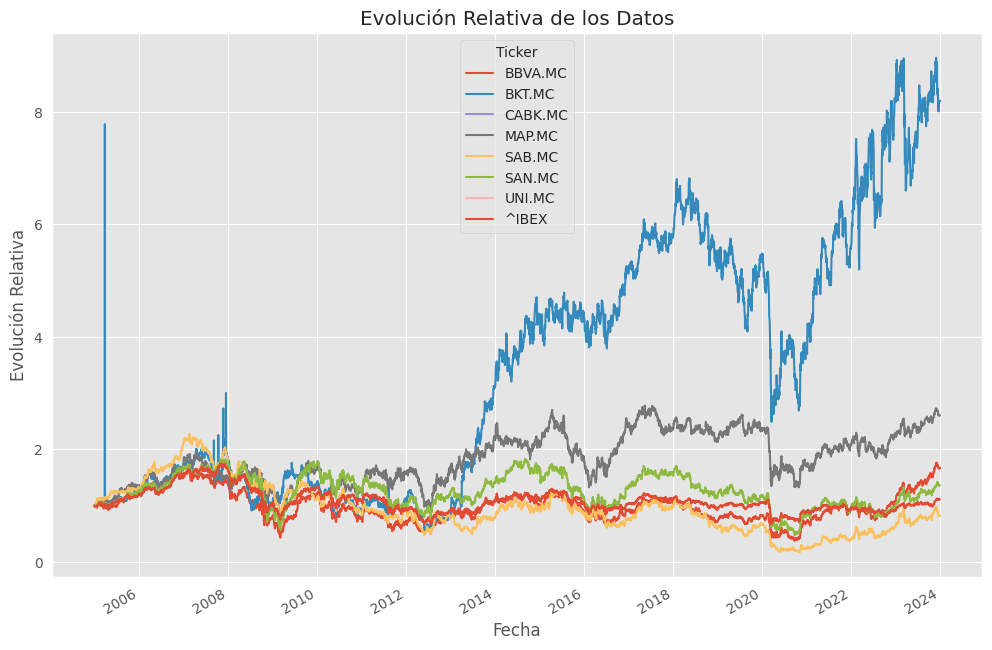

In [ ]:
# Calcula la evolución relativa de los datos con respecto al valor inicial
relative_data = data / data.iloc[0]
# Realiza el gráfico
relative_data.plot(figsize=(12, 8))
# Título
plt.title('Evolución Relativa de los Datos')
# Etiquetas a los ejes x e y
plt.xlabel('Fecha')
plt.ylabel('Evolución Relativa')
plt.show()

La gráfica proporciona una representación visual de la evolución relativa de los datos en comparación con sus valores iniciales a lo largo del tiempo. Esta visualización nos permite identificar tendencias, fluctuaciones y cambios significativos en los datos. Por ejemplo, podemos observar cómo la pandemia de la COVID-19 afectó los datos, especialmente durante el año 2020, mostrando claramente su impacto en la serie temporal. Esta herramienta nos brinda una primera aproximación para comprender la dinámica de los datos y explorar posibles patrones o anomalías en su evolución a lo largo del tiempo.

## **Preprocesamiento**

### **Missing values**

A continuación, verificamos si el conjunto de datos contiene valores faltantes. Podemos confirmar mediante la siguiente sentencia que no se encuentran valores perdidos en el conjunto de datos.

In [ ]:
# A continuación comprobamos que no existe ningún valor en el dataSet que disponga de valores perdidos.
pd.isnull(data).any()

Ticker
BBVA.MC    True
BKT.MC     True
CABK.MC    True
MAP.MC     True
SAB.MC     True
SAN.MC     True
UNI.MC     True
^IBEX      True
dtype: bool

In [ ]:
data.isnull().sum()

Ticker
BBVA.MC       1
BKT.MC        1
CABK.MC     715
MAP.MC        1
SAB.MC        1
SAN.MC        1
UNI.MC     3197
^IBEX         9
dtype: int64

Se ha observado la presencia de valores faltantes en el conjunto de datos analizado. A continuación, procedemos a verificar el número de registros de cada una de las características seleccionadas, así como el número total de registros disponibles para cada una de ellas. Este análisis nos permitirá comprender mejor la distribución de datos en el conjunto de datos y evaluar la magnitud del problema de valores faltantes en cada una de las características seleccionadas.

In [ ]:
# Comprobamos el número de registros con valores no nulos, valores nulos y el total de registros para cada columna.
columns_with_miss_val = []

for col in data.columns:
    total_values = len(data)
    number_not_missing = data[col].notnull().sum()
    number_missing = data[col].isnull().sum()
    print('{}: Nº registros con valor -> {:<5} / Nº de missing values -> {:<5}: Total de registros {}'.format(
        col, number_not_missing, number_missing, total_values))


BBVA.MC: Nº registros con valor -> 4860  / Nº de missing values -> 1    : Total de registros 4861
BKT.MC: Nº registros con valor -> 4860  / Nº de missing values -> 1    : Total de registros 4861
CABK.MC: Nº registros con valor -> 4146  / Nº de missing values -> 715  : Total de registros 4861
MAP.MC: Nº registros con valor -> 4860  / Nº de missing values -> 1    : Total de registros 4861
SAB.MC: Nº registros con valor -> 4860  / Nº de missing values -> 1    : Total de registros 4861
SAN.MC: Nº registros con valor -> 4860  / Nº de missing values -> 1    : Total de registros 4861
UNI.MC: Nº registros con valor -> 1664  / Nº de missing values -> 3197 : Total de registros 4861
^IBEX: Nº registros con valor -> 4852  / Nº de missing values -> 9    : Total de registros 4861


Como podemos comprobar la mayoría de los activos muestran un alto número de registros con valores no nulos en comparación con los valores faltantes. Esto sugiere que la mayor parte de los datos está completa y disponible, lo que indica una consistencia adecuada en la cantidad de datos recopilados. No obstante las columnas "CABK.MC", CaixaBank, y "UNI.MC", Unicaja, destacan por tener un número significativo de valores faltantes en relación con el total de registros. Este hecho podría generar posibles problemas de integridad de datos o inconsistencias.

Después de evaluar diferentes opciones para manejar los valores faltantes en los datos, como la imputación mediante la media, la mediana y el relleno hacia atrás (backfill), en un primer lugar se decidió emplear una técnica combinada de ffill (relleno hacia adelante) y de interpolación. El ffill se utilizó para mantener la continuidad en la serie temporal y manejar interrupciones breves, mientras que la interpolación sobre los datos rellenados permitió suavizar las fluctuaciones y capturar patrones más complejos. Esta elección se basó en la capacidad de ffill para preservar la estructura temporal de los datos y en la necesidad de la interpolación para mejorar la calidad y la representación de los datos rellenados.

In [ ]:
# Completar valores perdidos con método ffill
data.fillna(method='ffill', inplace=True)
# Aplicar interpolación sobre los datos rellenados
data.interpolate(method='linear', inplace=True)

In [ ]:
# Contamos de nuevo los valores perdidos para el conjunto de datos
data.isnull().sum()

Ticker
BBVA.MC       0
BKT.MC        0
CABK.MC     714
MAP.MC        0
SAB.MC        0
SAN.MC        0
UNI.MC     3196
^IBEX         0
dtype: int64

Una vez aplicada la primera técnica de rellenado de valores faltantes, se procedió a revisar nuevamente los datos para evaluar la efectividad. Si bien esta técnica resultó exitosa para rellenar la mayoría de las características principales, se observó que aquellas características con grandes conjuntos de datos faltantes no fue adecuada. Ante esta situación, se decidió emplear una segunda técnica más agresiva. Esta segunda estrategia se caracteriza por una combinación de mediana e interpolación aplicada de manera más amplia. Al utilizar la mediana como valor inicial y posteriormente aplicar la interpolación, se logró suavizar las fluctuaciones y rellenar de manera más precisa las brechas en la serie temporal. La elección de la mediana se basó en su capacidad para mantener la estabilidad y la robustez frente a los posibles valores extremos, lo que resulta especialmente beneficioso para asegurar la integridad de la serie temporal.

In [ ]:
# Completar valores faltantes con la mediana
data.fillna(data.median(), inplace=True)
# Aplicar interpolación sobre los datos rellenados
data.interpolate(method='linear', inplace=True)

In [ ]:
# Contamos de nuevo los valores perdidos para el conjunto de datos
data.isnull().sum()

Ticker
BBVA.MC    0
BKT.MC     0
CABK.MC    0
MAP.MC     0
SAB.MC     0
SAN.MC     0
UNI.MC     0
^IBEX      0
dtype: int64

También se consideró la posibilidad de aplicar otra técnica, mucho más agresiva, la cual consiste en eliminar los valores nulos del conjunto de datos de la siguiente manera:


In [ ]:
data = data.dropna() # Elimino del conjunto de datos originales los nulos

Después de aplicar la técnica de rellenado de valores faltantes utilizando la segunda técnica, se realizó una revisión exhaustiva de los datos. Se confirmó que todos los datos faltantes han sido completados exitosamente. Durante una inspección visual y un análisis de estadísticas descriptivas, se observó una consistencia excelente en la mayoría de los datos, con la excepción de los valores de UNICAJA. A continuación, procederemos a estudiar y analizar la diferencia entre los datos originales y los datos actuales de UNICAJA para comprender mejor la naturaleza de esta discrepancia.

In [ ]:
# Comparar datos originales de UNICAJA con datos rellenados mediante técnicas aplicadas.
# Descripción estadística de la columna 'UNI.MC' en el DataFrame actual
describe_actual = data['UNI.MC'].describe()
# Descripción estadística de la columna 'UNI.MC' en el DataFrame original
describe_original = data_original['UNI.MC'].describe()
# Concatenar los resultados en un solo DataFrame para comparar
comparacion_descripciones = pd.concat([describe_actual, describe_original], axis=1, keys=['UNICAJA Actual', 'UNICAJA Original'])
print(comparacion_descripciones)
# Imprimir la desviación estándar de la columna 'UNI.MC' en el DataFrame actual
print("Desviación estándar en los datos de UNICAJA Actuales:", data['UNI.MC'].std())
# Imprimir la desviación estándar de la columna 'UNI.MC' en el DataFrame original
print("Desviación estándar en los datos de UNICAJA Originales:", data_original['UNI.MC'].std())
# Calcular el porcentaje de cambio
porcentaje_cambio = ((data['UNI.MC'].std() -  data_original['UNI.MC'].std()) /  data_original['UNI.MC'].std()) * 100
# Imprimir el porcentaje de modificación
print("Porcentaje de modificación en la desviación estándar:", abs(porcentaje_cambio))

       UNICAJA Actual  UNICAJA Original
count     4861.000000       1664.000000
mean         0.883073          0.886080
std          0.130750          0.223260
min          0.385006          0.385006
25%          0.881380          0.743703
50%          0.881380          0.881354
75%          0.881380          1.022000
max          1.436632          1.436632
Desviación estándar en los datos de UNICAJA Actuales: 0.13074993164057214
Desviación estándar en los datos de UNICAJA Originales: 0.22326018511076612
Porcentaje de modificación en la desviación estándar: 41.436073084099995


Como se puede observar en la comparación, existe una diferencia significativa en la desviación estándar entre los datos originales y los datos después de aplicar las técnicas de rellenado. La desviación estándar en los datos actuales es aproximadamente un 41.44% más baja que en los datos originales. Estos cambios indican una alteración en la dispersión de los datos, lo cual es atribuido a la presencia de valores faltantes que introducen discontinuidades en la serie temporal, resultando en un aumento de la variabilidad de los datos.

A continuación, se explorarán otras técnicas para abordar este problema, como la eliminación de características, con el fin de mejorar la calidad y consistencia de los datos.

### **Eliminación de características**

Durante el proceso de carga de datos, se realizó una eliminación de características donde únicamente se extrajo la característica del valor de precio ajustado (Adj Close). Como resultado, todas las demás características del conjunto de datos para cada activo, como son (Open, High, Low, Close, y Volume), fueron descartadas.

Posteriormente, continuamos eliminando las características sobrantes del conjunto de datos, específicamente el activo financiero de Unicaja. Además, se procede a renombrar las columnas con sus nombres comerciales con el objetivo de facilitar su uso y comprensión.



In [ ]:
# Finalmente eliminar variable UNI.MC por disponer de una serie inestable.
data.drop("UNI.MC", axis = 1, inplace = True)

A continuación renombramos las columnas para facilitar su uso y comprensión.

In [ ]:
data.rename(columns={"BBVA.MC": "BBVA"}, inplace= True)
data.rename(columns={"BKT.MC": "BANKINTER"}, inplace= True)
data.rename(columns={"CABK.MC": "CAIXA"}, inplace= True)
data.rename(columns={"MAP.MC": "MAPFRE"}, inplace= True)
data.rename(columns={"SAB.MC": "SABADELL"}, inplace= True)
data.rename(columns={"SAN.MC": "SANTANDER"}, inplace= True)
data.rename(columns={"^IBEX": "IBEX35"}, inplace= True)
data.columns

Index(['BBVA', 'BANKINTER', 'CAIXA', 'MAPFRE', 'SABADELL', 'SANTANDER',
       'IBEX35'],
      dtype='object', name='Ticker')

Finalmente el conjunto de datos se muestra de la siguiente manera.

In [ ]:
data

Ticker,BBVA,BANKINTER,CAIXA,MAPFRE,SABADELL,SANTANDER,IBEX35
Date,,,,,,,
2005-01-03,4.939929,0.696828,2.078433,0.748647,1.351752,2.794742,9124.090820
2005-01-04,4.913592,0.693805,2.078433,0.752734,1.359565,2.794742,9119.991211
2005-01-05,4.887259,0.693271,2.078433,0.741835,1.351752,2.755250,9024.391602
2005-01-06,4.887259,0.693271,2.078433,0.728891,1.351752,2.755250,9024.391602
2005-01-07,4.936166,0.703516,2.078433,0.737747,1.336125,2.743101,9041.090820
...,...,...,...,...,...,...,...
2023-12-21,8.232000,5.695436,3.435966,1.947000,1.098566,3.793000,10104.299805
2023-12-22,8.238000,5.695436,3.423094,1.953000,1.101000,3.808000,10111.900391
2023-12-27,8.242000,5.711385,3.431369,1.952000,1.102000,3.810000,10121.799805


A continuación, procedemos a realizar una copia de los datos para utilizar en los diferentes modelos, así como una copia adicional que excluye la variable del IBEX 35, que será nuestra variable objetivo de estudio.

In [ ]:
data_seasonal = data.copy() # Copia de los datos para seasonal
data_model = data.copy() # Copia de los datos para los modelos
data_rendimientos = data.copy() # Copia de los datos para calcular los rendimientos
data_whitout_ibex = data.drop("IBEX35", axis=1).copy() # Copia de los datos sin el Ibex35

### **División de conjuntos de datos**

A continuación se divide el conjunto de datos para disponer de conjuntos de entrenamiento y prueba para hacer validaciones.

In [ ]:
# Se divide el dataSet en conjunto de train y test para hacer validaciones
train_data, test_data = train_test_split(data, test_size = 0.2, random_state = 0)
test = test_data.copy()

In [ ]:
# Se muestran las características del conjunto de train y test
print('Conjunto de Train: {} | Tipos: {}'.format(train_data.shape, train_data.dtypes))
print('Conjunto de Test: {} | Tipos: {}'.format(test_data.shape, test_data.dtypes))

Conjunto de Train: (3888, 7) | Tipos: Ticker
BBVA         float64
BANKINTER    float64
CAIXA        float64
MAPFRE       float64
SABADELL     float64
SANTANDER    float64
IBEX35       float64
dtype: object
Conjunto de Test: (973, 7) | Tipos: Ticker
BBVA         float64
BANKINTER    float64
CAIXA        float64
MAPFRE       float64
SABADELL     float64
SANTANDER    float64
IBEX35       float64
dtype: object


Se evidencia la división del conjunto de datos en dos partes distintas: Train, conjunto de entretamiento, compuesta por el 80% de los registros, y Test, conjunto de pruebas, que contiene el 20% restante de los registros. Este proceso de división es fundamental para realizar una evaluación precisa del modelo, utilizando datos separados para entrenamiento y pruebas, lo que contribuye a una validación más robusta de la efectividad del sistema predictivo.

### **Análisis de rendimientos**


A continuación se comproborá la relevancia del uso de rendimientos en series de tiempo. Los precios de los activos suelen ser no estacionarios, es decir, sus momentos, como la media y la varianza cambian con el tiempo. Esto también podría implicar la identificación de posibles tendencias o efectos estacionales en la serie de precios. Al transformar los precios en rendimientos, se busca estacionarizar la serie de tiempo, una propiedad fundamental en el modelado estadístico.

#### **Rendimientos simples**


Se agregan sobre los activos. Los rendimientos simples se definen como:

$$R_t=\frac{P_t-P_{t-1}}{P_{t-1}} = \frac{P_t}{P_{t-1}} -1$$

#### **Rendimientos logarítmicos**


Se agregan con el tiempo. Los rendimientos logarírtmicos se definen como:

$$R_t= log\frac{P_t}{P_{t-1}}= log(P_t)-log(P_{t-1})$$

Entre las ventajas del uso de rendimientos logarítmicos destacan:

- Distribución simplificada: Al convertir los cambios porcentuales a una escala logarítmica, se simplifica el análisis estadístico al transformar la distribución de precios a una distribución normal.

- Aproximación: Son precisos para calcular cambios en los precios, especialmente cuando son pequeños.

- Adición en el tiempo: Facilitan los cálculos y transformaciones de series temporales al permitir la suma de variables y la convergencia hacia una distribución normal.

- Estabilidad mejorada: Ayudan a estabilizar la variabilidad en los datos, lo que mejora la interpretación y la fiabilidad de las observaciones.


#### **Cálculo de rendimientos**

A continuación se calculan los rendimientos simples y logarítmicos de la serie temporal.

In [ ]:
rendimientos_simple = data / data.shift(1) - 1
rendimientos_simple = rendimientos_simple.dropna()
rendimientos_simple

Ticker,BBVA,BANKINTER,CAIXA,MAPFRE,SABADELL,SANTANDER,IBEX35
Date,,,,,,,
2005-01-04,-0.005331,-0.004338,0.000000,0.005459,0.005780,0.000000,-0.000449
2005-01-05,-0.005359,-0.000769,0.000000,-0.014479,-0.005747,-0.014131,-0.010482
2005-01-06,0.000000,0.000000,0.000000,-0.017447,0.000000,0.000000,0.000000
2005-01-07,0.010007,0.014778,0.000000,0.012150,-0.011561,-0.004410,0.001850
2005-01-10,0.002304,-0.010513,0.000000,0.007387,0.000000,-0.002215,-0.001394
...,...,...,...,...,...,...,...
2023-12-21,0.007589,0.009533,0.004840,-0.006633,0.007589,0.001056,0.000327
2023-12-22,0.000729,0.000000,-0.003746,0.003082,0.002215,0.003955,0.000752
2023-12-27,0.000486,0.002800,0.002417,-0.000512,0.000908,0.000525,0.000979


In [ ]:
rendimientos_log = np.log(data / data.shift(1))
rendimientos_log = rendimientos_log.dropna()
rendimientos_log

Ticker,BBVA,BANKINTER,CAIXA,MAPFRE,SABADELL,SANTANDER,IBEX35
Date,,,,,,,
2005-01-04,-0.005346,-0.004348,0.000000,0.005444,0.005764,0.000000,-0.000449
2005-01-05,-0.005374,-0.000770,0.000000,-0.014585,-0.005764,-0.014232,-0.010538
2005-01-06,0.000000,0.000000,0.000000,-0.017601,0.000000,0.000000,0.000000
2005-01-07,0.009957,0.014670,0.000000,0.012076,-0.011628,-0.004419,0.001849
2005-01-10,0.002301,-0.010569,0.000000,0.007360,0.000000,-0.002217,-0.001395
...,...,...,...,...,...,...,...
2023-12-21,0.007560,0.009488,0.004828,-0.006655,0.007561,0.001055,0.000327
2023-12-22,0.000729,0.000000,-0.003753,0.003077,0.002213,0.003947,0.000752
2023-12-27,0.000485,0.002797,0.002414,-0.000512,0.000908,0.000525,0.000979


In [ ]:
data

Ticker,BBVA,BANKINTER,CAIXA,MAPFRE,SABADELL,SANTANDER,IBEX35
Date,,,,,,,
2005-01-03,4.939929,0.696828,2.078433,0.748647,1.351752,2.794742,9124.090820
2005-01-04,4.913592,0.693805,2.078433,0.752734,1.359565,2.794742,9119.991211
2005-01-05,4.887259,0.693271,2.078433,0.741835,1.351752,2.755250,9024.391602
2005-01-06,4.887259,0.693271,2.078433,0.728891,1.351752,2.755250,9024.391602
2005-01-07,4.936166,0.703516,2.078433,0.737747,1.336125,2.743101,9041.090820
...,...,...,...,...,...,...,...
2023-12-21,8.232000,5.695436,3.435966,1.947000,1.098566,3.793000,10104.299805
2023-12-22,8.238000,5.695436,3.423094,1.953000,1.101000,3.808000,10111.900391
2023-12-27,8.242000,5.711385,3.431369,1.952000,1.102000,3.810000,10121.799805


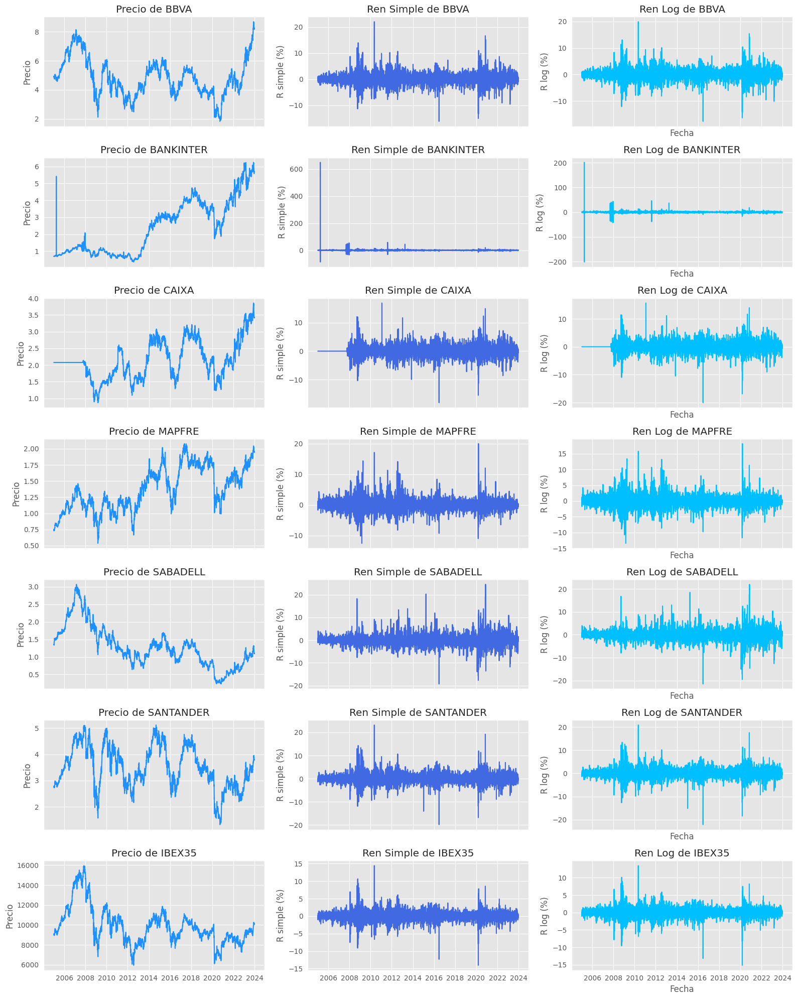

In [ ]:
# Crear una figura con subplots para cada ticker
fig, axs = plt.subplots(len(data.columns), 3, figsize=(16, 20), sharex=True)

# Iterar y crear gráficos
for i, ticker in enumerate(data.columns):
    # Gráfico de evolución del precio de cierre ajustado
    axs[i, 0].plot(data.index, data[ticker], color='dodgerblue')
    axs[i, 0].set(title=f'Precio de {ticker}', ylabel='Precio')

    # Gráfico de rendimientos simples
    axs[i, 1].plot(rendimientos_simple.index, rendimientos_simple[ticker] * 100, color='royalblue')
    axs[i, 1].set(title=f'Ren Simple de {ticker}', ylabel='R simple (%)')

    # Gráfico de rendimientos logarítmicos
    axs[i, 2].plot(rendimientos_log.index, rendimientos_log[ticker] * 100, color='deepskyblue')
    axs[i, 2].set(title=f'Ren Log de {ticker}', xlabel='Fecha', ylabel='R log (%)')

# Ajustar el espacio
plt.tight_layout()

# Mostrar los gráficos
plt.show()


### **Identificación de Outliers**

Al trabajar con datos de cualquier tipo, es común encontrarnos con observaciones que se apartan significativamente de la mayoría, conocidas como valores atípicos (outliers). Estos pueden surgir debido a diversos factores, como errores en los datos, eventos importantes en los mercados financieros o simplemente días de alta volatilidad que distorsionan los precios.

Los modelos estadísticos pueden ser sensibles a la presencia de valores atípicos, lo que puede resultar en predicciones incorrectas o sesgadas. Por esta razón, es fundamental abordar los valores atípicos antes de construir cualquier modelo analítico o predictivo.

Se emplea una técnica de ventana móvil para identificar valores atípicos en los datos financieros. Esta estrategia calcula la media y la desviación estándar en intervalos de tiempo específicos, utilizando una regla de más de tres desviaciones estándar para detectar las anomalías. El enfoque de ventana móvil captura cambios en la tendencia y la volatilidad de los datos a lo largo del tiempo, permitiendo una detección efectiva de valores atípicos al reducir el ruido y hacer que las anomalías sean más evidentes.

#### **Preparación de los datos**

A continuación, se define una función para identificar los outliers.

In [ ]:
def identifica_outlier(row, x_column, mu_column, sigma_column, n_sigmas=3):
    x = row[x_column]
    mu = row[mu_column]
    sigma = row[sigma_column]
    if (x > mu + n_sigmas * sigma) or (x < mu - n_sigmas * sigma):
        return 1
    else:
        return 0

El siguiente código combina los datos históricos, rendimientos simples y logarítmicos de los activos financieros, facilitando así el análisis y la visualización de los datos para un estudio financiero.

In [ ]:
# Lista de nombres de activos
activos = ['BBVA', 'BANKINTER', 'CAIXA', 'MAPFRE', 'SABADELL', 'SANTANDER', 'IBEX35']

# Crear un diccionario para almacenar los DataFrames combinados
combined_dataframes = {}

# Iterar sobre cada activo
for activo in activos:
    # Seleccionar las columnas del activo correspondiente de cada DataFrame
    data_activo = data[[activo]]
    rendimientos_simple_activo = rendimientos_simple[[activo]]
    rendimientos_log_activo = rendimientos_log[[activo]]

    # Concatenar las columnas del activo de los tres DataFrames, datos, rendimientos simples y rendimientos logaritmicos.
    combined_activo = pd.concat([data_activo, rendimientos_simple_activo, rendimientos_log_activo], axis=1)

    # Renombrar las columnas del activo
    combined_activo.columns = [f'{activo}_Precio', f'{activo}_Rendimiento_Simple', f'{activo}_Rendimiento_Log']

    # Eliminar filas con valores NaN
    combined_activo = combined_activo.dropna()

    # Almacenar el DataFrame combinado en el diccionario
    combined_dataframes[activo] = combined_activo

# Imprimir los DataFrames combinados para cada activo
for activo, df in combined_dataframes.items():
    print(f"Datos para {activo}:")
    print(df.head())
    print()

Datos para BBVA:
            BBVA_Precio  BBVA_Rendimiento_Simple  BBVA_Rendimiento_Log
Date                                                                  
2005-01-04     4.913592                -0.005331             -0.005346
2005-01-05     4.887259                -0.005359             -0.005374
2005-01-06     4.887259                 0.000000              0.000000
2005-01-07     4.936166                 0.010007              0.009957
2005-01-10     4.947539                 0.002304              0.002301

Datos para BANKINTER:
            BANKINTER_Precio  BANKINTER_Rendimiento_Simple  \
Date                                                         
2005-01-04          0.693805                     -0.004338   
2005-01-05          0.693271                     -0.000769   
2005-01-06          0.693271                      0.000000   
2005-01-07          0.703516                      0.014778   
2005-01-10          0.696119                     -0.010513   

            BANKINTER_Rendim

A continuación se identifican los valores atípicos del precio de cierre y se extraen sus valores para su uso posterior.

In [ ]:
# Crear un diccionario para almacenar los DataFrames combinados con outliers
combined_dataframes_outliers = {}

# Ventana móvil para el cálculo de estadísticas
window = 255

for activo, df in combined_dataframes.items():
    # Rellenar los valores de la columna
    df.fillna(df.ffill(), inplace=True)
    df.interpolate(method='linear', inplace=True)
    # Si quedan valores de rellenar valores con NaN se utiliza la mediana de la columna
    df.fillna(df.median(), inplace=True)
    # Aplicar interpolación sobre los datos rellenados
    df.interpolate(method='linear', inplace=True)

    # Calcular la media y el desvío estándar con ventana móvil
    df[f'{activo}_Precio_mean'] = df[f'{activo}_Precio'].rolling(window=window).mean()
    df[f'{activo}_Precio_std'] = df[f'{activo}_Precio'].rolling(window=window).std()

    # Aplicar la función identifica_outlier para identificar outliers en los precios de cierre
    df['outlier_precio'] = df.apply(identifica_outlier, args=(f'{activo}_Precio',
                                                             f'{activo}_Precio_mean',
                                                             f'{activo}_Precio_std'), axis=1)

    # Almacenar el DataFrame con los outliers identificados en el diccionario
    combined_dataframes_outliers[activo] = df


#### **Rendimiento Simple**

Identifica los valores atípicos y extrae sus valores para su uso posterior generando un gráfico que muestra el resultado para cada activo junto con el número de valores atípicos (outliers) para el rendimiento simple. Se utilizan ventanas móviles y se calculan las estadísticas (la media y la desviación estándar) dentro de esas ventanas usando el método rolling de Pandas.

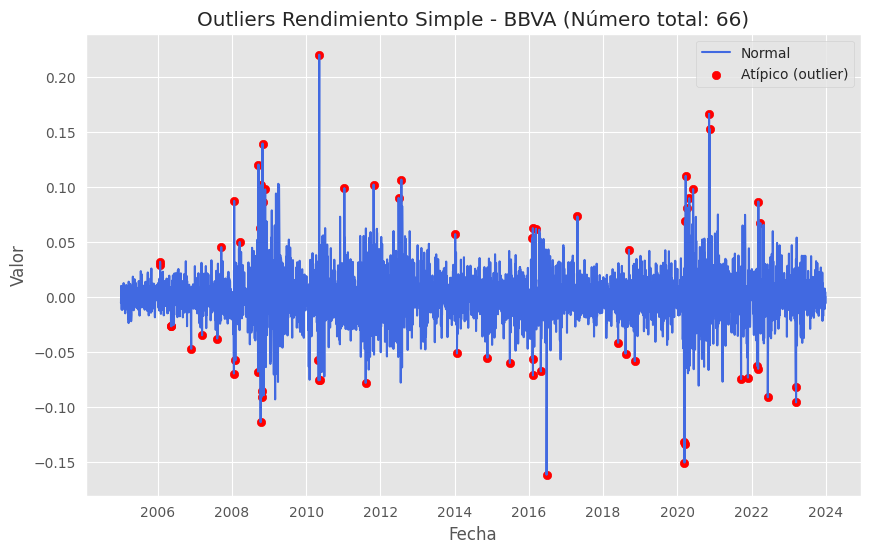

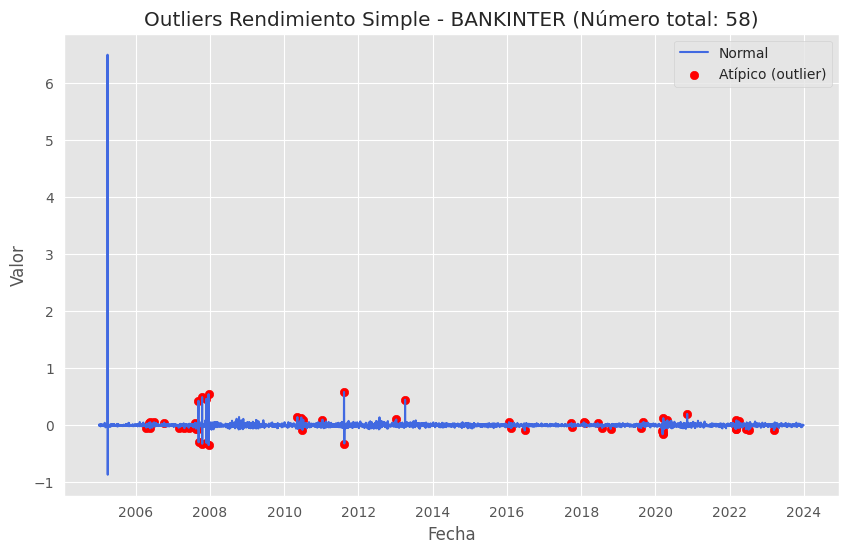

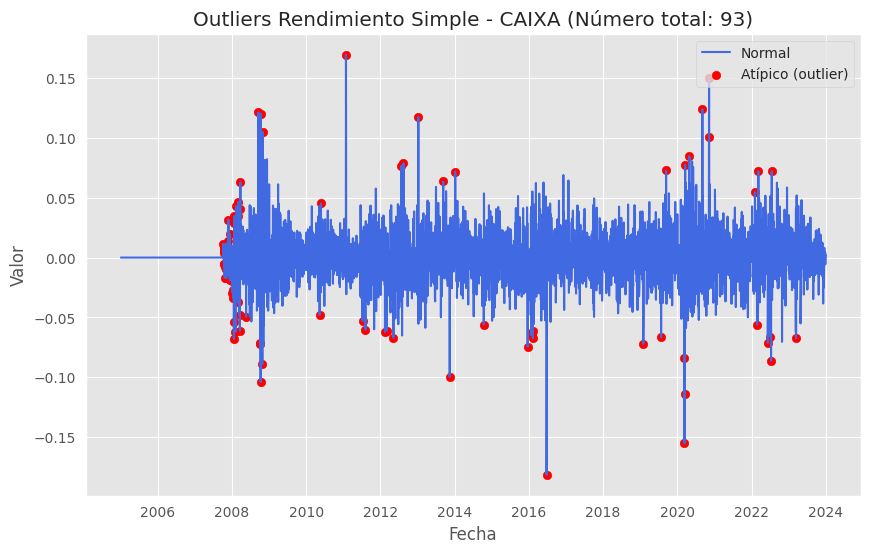

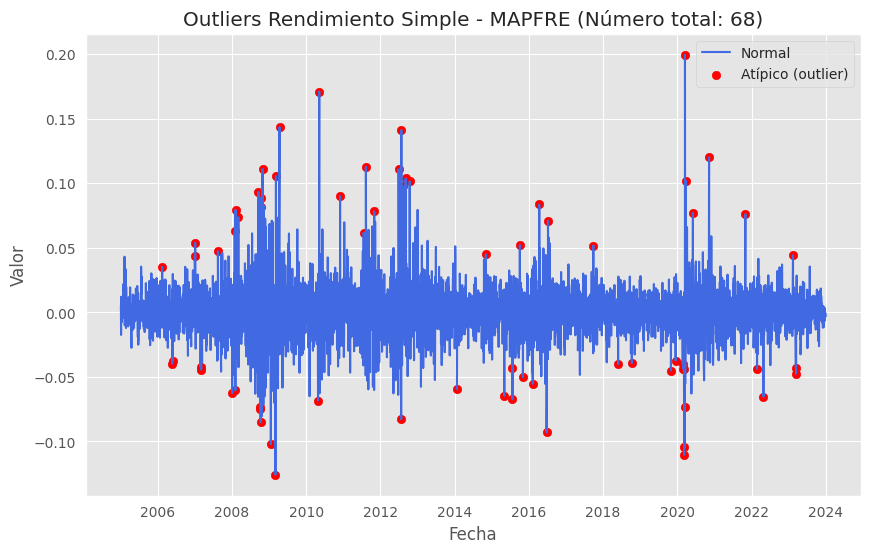

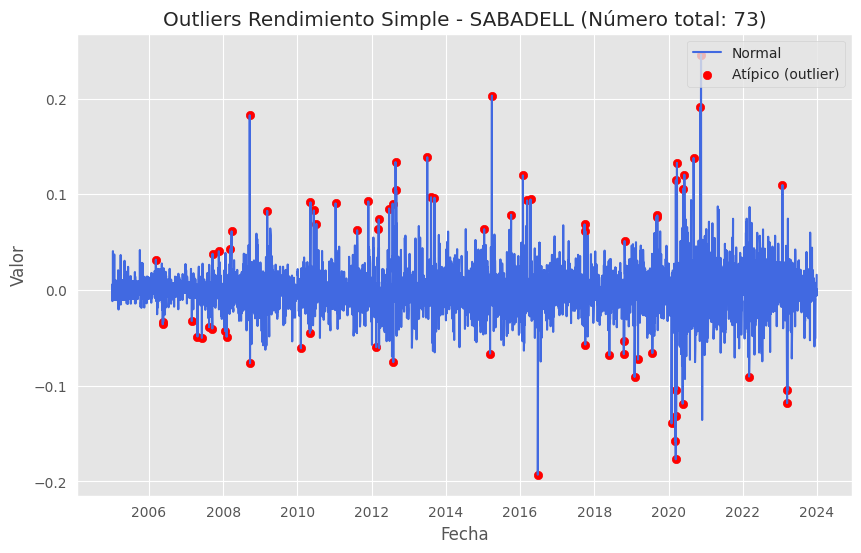

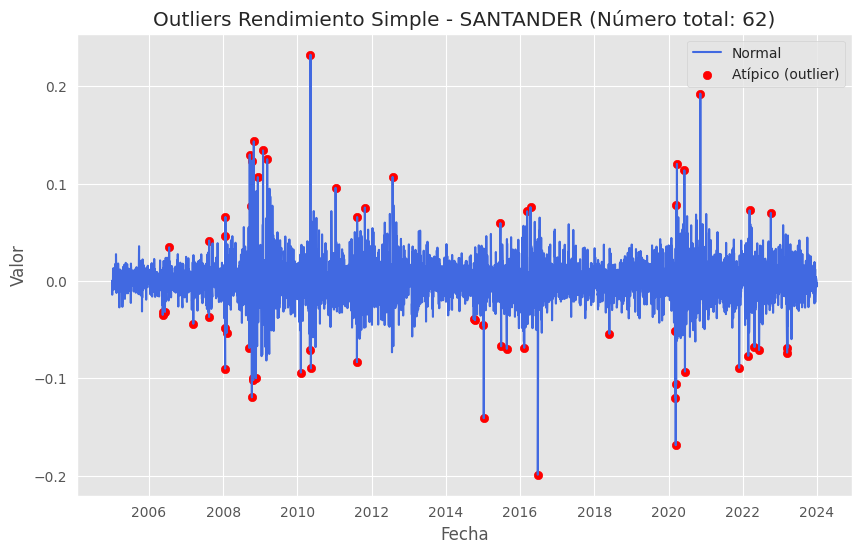

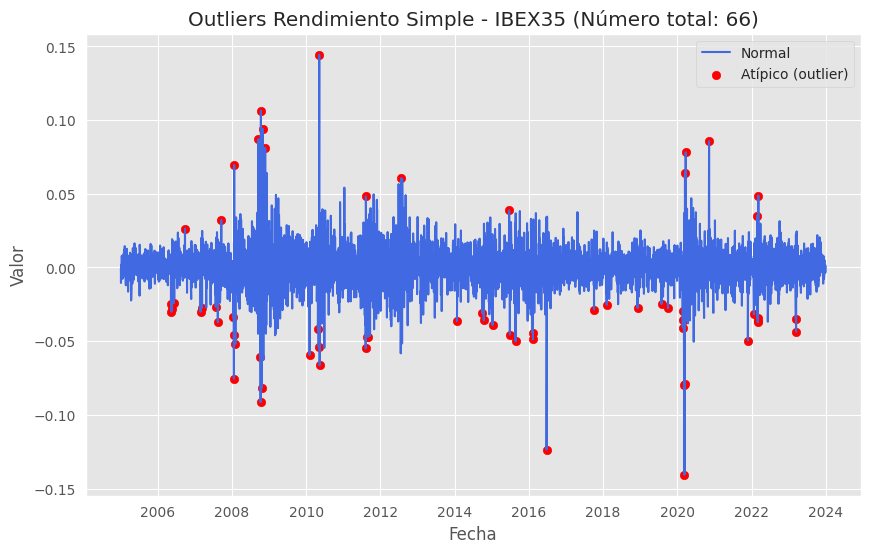

In [ ]:
# Crear un diccionario para almacenar los DataFrames combinados con outliers
combined_dataframes_outliers = {}

# Ventana móvil para el cálculo de estadísticas
window = 255

# Iterar sobre cada activo
for activo, df in combined_dataframes.items():
    # Rellenar los valores NaN y ffill de la columna
    df.fillna(df.ffill(), inplace=True)
    # Aplicar interpolación sobre los datos rellenados
    df.interpolate(method='linear', inplace=True)
    # Si quedan valores de rellenar los valores NaN con la mediana de la columna
    df.fillna(df.median(), inplace=True)
    # Aplicar interpolación sobre los datos rellenados
    df.interpolate(method='linear', inplace=True)

    # Calcular la media y el desvío estándar con ventana móvil
    df[f'{activo}_Rendimiento_Simple_mean'] = df[f'{activo}_Rendimiento_Simple'].rolling(window=window).mean()
    df[f'{activo}_Rendimiento_Simple_std'] = df[f'{activo}_Rendimiento_Simple'].rolling(window=window).std()

    # Aplicar la función identifica_outlier para identificar outliers en los rendimientos simples
    df['outlier_simple'] = df.apply(identifica_outlier, args=(f'{activo}_Rendimiento_Simple',
                                                             f'{activo}_Rendimiento_Simple_mean',
                                                             f'{activo}_Rendimiento_Simple_std'), axis=1)

    # Almacenar el DataFrame con los outliers identificados en el diccionario
    combined_dataframes_outliers[activo] = df

# Iterar sobre cada activo y generar el gráfico
for activo, df in combined_dataframes_outliers.items():
    # Crear subgráficos para cada activo
    fig, ax = plt.subplots(figsize=(10, 6))

    # Graficar rendimientos simples normales
    ax.plot(df.index,
            df[f'{activo}_Rendimiento_Simple'],
            color='royalblue',
            label='Normal')

    # Graficar outliers
    outliers_simple = df.loc[df['outlier_simple'] == 1, f'{activo}_Rendimiento_Simple']
    ax.scatter(outliers_simple.index,
               outliers_simple,
               color='red',
               label='Atípico (outlier)')

    # Calcular el número total de outliers
    outliers_count_simple = outliers_simple.shape[0]

    # Establecer título y ejes
    ax.set_title(f"Outliers Rendimiento Simple - {activo} (Número total: {outliers_count_simple})")
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Valor')
    ax.legend(loc='upper right')

    # Mostrar gráfico
    plt.show()


En el gráfico, se pueden identificar los valores atípicos señalados con un punto rojo para cada activo. Es importante destacar que cuando hay dos rendimientos significativos, el algoritmo clasifica el primero como un valor atípico y el segundo como una observación regular. Esto se debe a que el primer valor atípico afecta a la media móvil y la desviación estándar al entrar en la ventana móvil.

Además, es necesario considerar el efecto conocido como "efecto fantasma" o "función ghost". Cuando un valor atípico entra en la ventana móvil, distorsiona los valores de las estadísticas de la ventana móvil mientras permanece dentro de ella.


#### **Rendimiento Logarítmico**

Identifica los valores atípicos y extrae sus valores para su uso posterior generando un gráfico que muestra el resultado para cada activo junto con el número de valores atípicos (outliers) para el rendimiento logarítimico. Se utilizan ventanas móviles y se calculan las estadísticas (la media y la desviación estándar) dentro de esas ventanas usando el método rolling de Pandas.

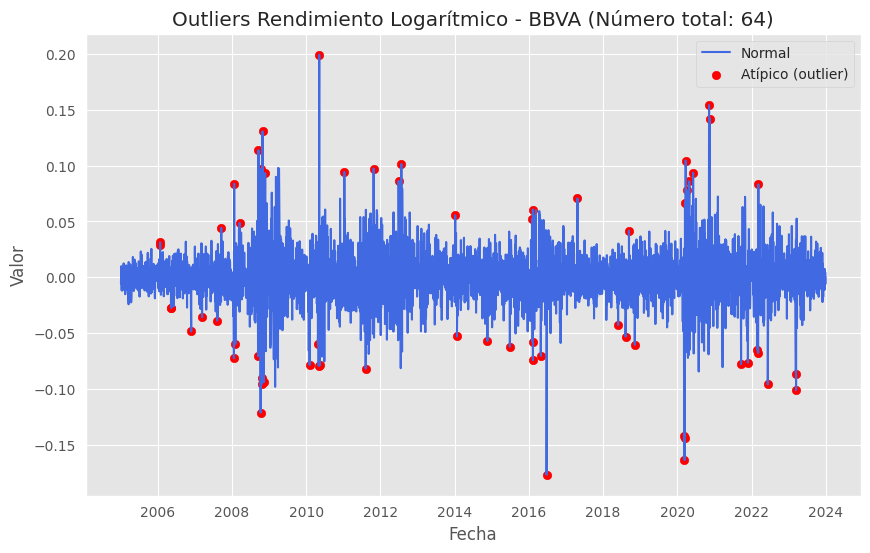

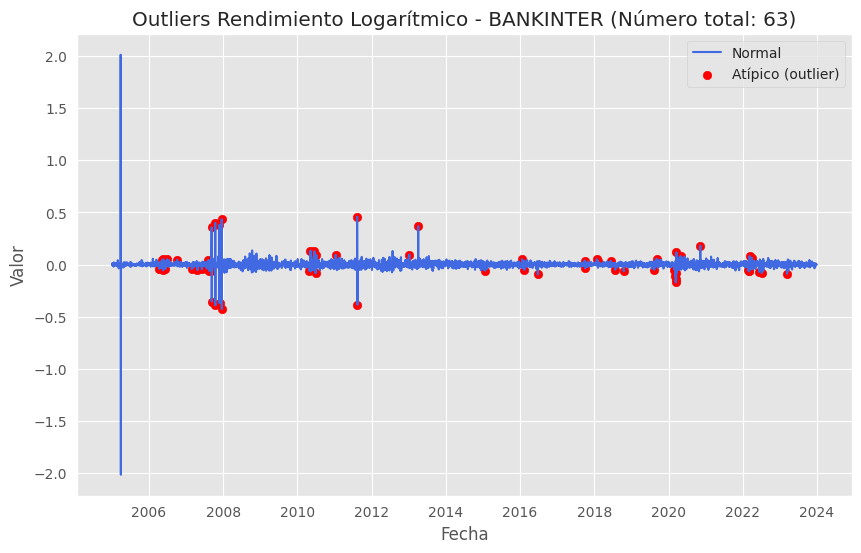

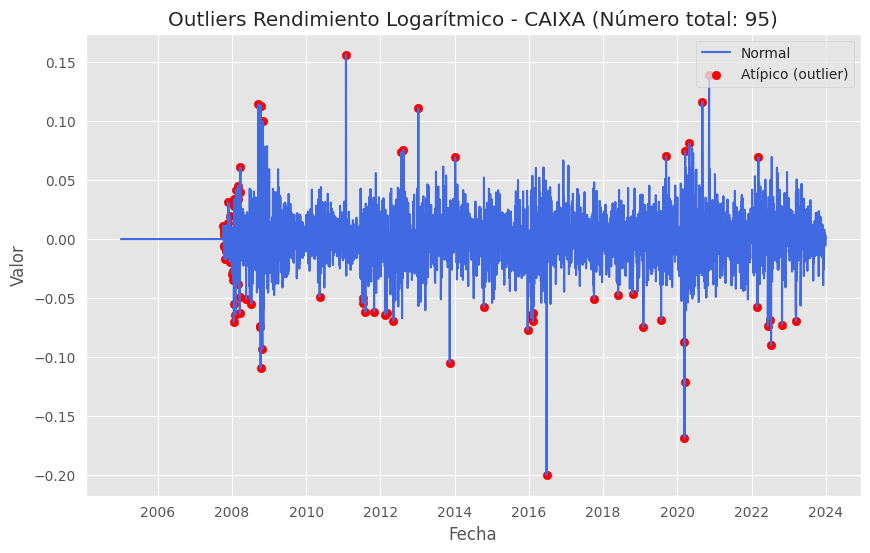

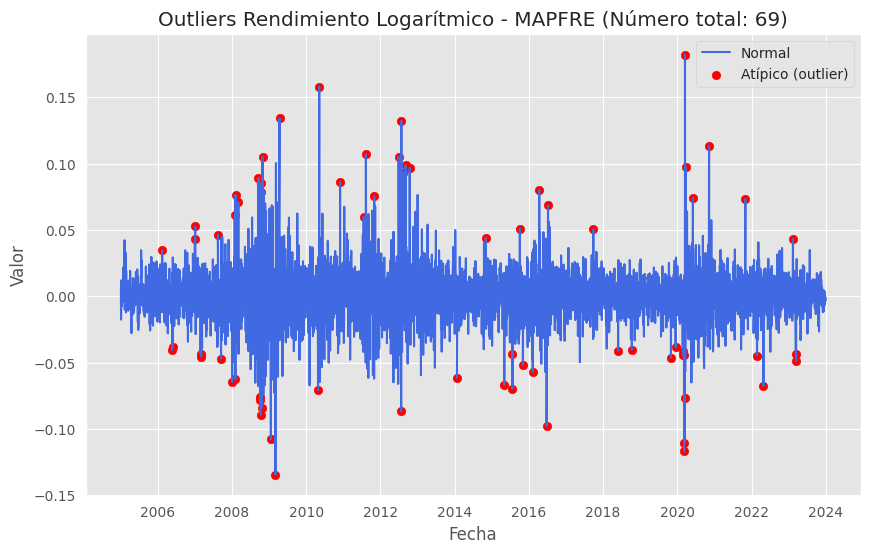

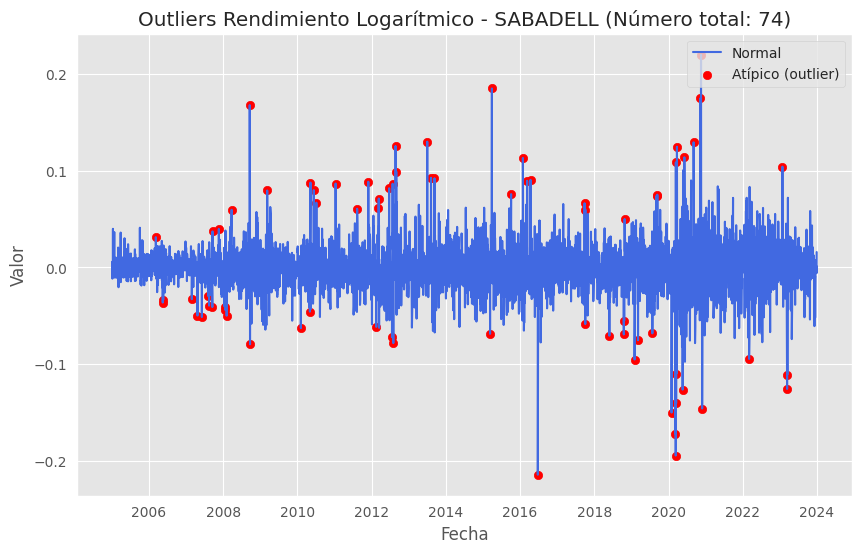

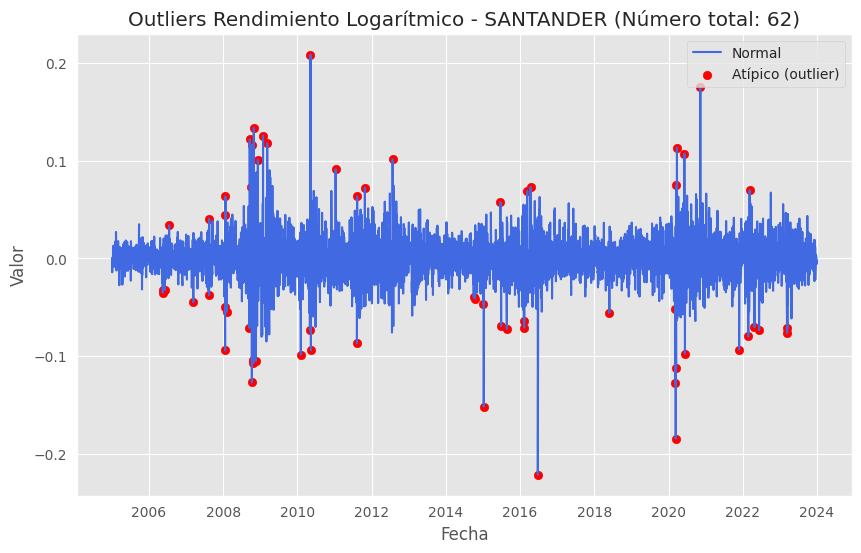

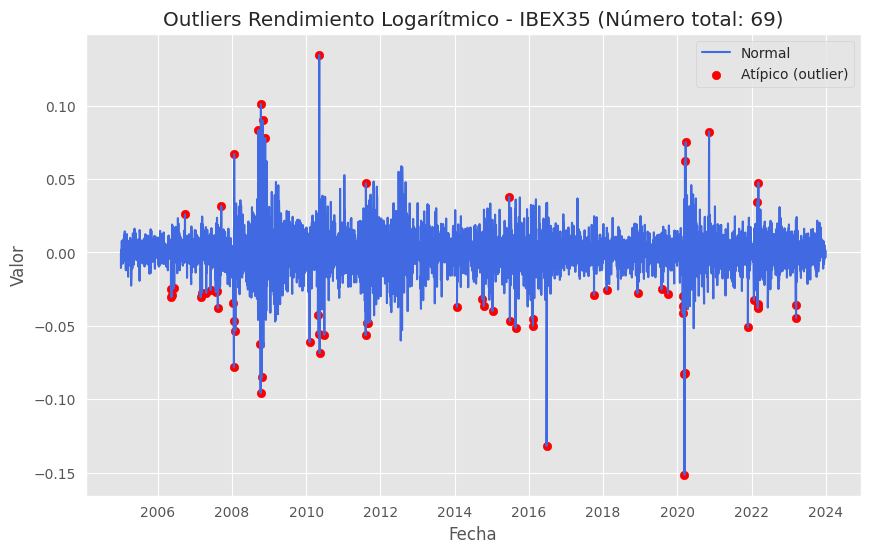

In [ ]:
# Crear un diccionario para almacenar los DataFrames combinados con outliers de rendimientos logarítmicos
combined_dataframes_outliers_log = {}

# Ventana móvil para el cálculo de estadísticas
window = 255  # Puedes ajustar el tamaño de la ventana según tus necesidades

# Iterar sobre cada activo
for activo, df in combined_dataframes.items():
    # Rellenar los valores NaN y ffill de la columna
    df.fillna(df.ffill(), inplace=True)
    # Aplicar interpolación sobre los datos rellenados
    df.interpolate(method='linear', inplace=True)
    # Si quedan valores de rellenar los valores NaN con la mediana de la columna
    df.fillna(df.median(), inplace=True)
    # Aplicar interpolación sobre los datos rellenados
    df.interpolate(method='linear', inplace=True)

    # Calcular la media y el desvío estándar con ventana móvil
    df[f'{activo}_Rendimiento_Log_mean'] = df[f'{activo}_Rendimiento_Log'].rolling(window=window).mean()
    df[f'{activo}_Rendimiento_Log_std'] = df[f'{activo}_Rendimiento_Log'].rolling(window=window).std()

    # Aplicar la función identifica_outlier para identificar outliers en los rendimientos logarítmicos
    df['outlier_log'] = df.apply(identifica_outlier, args=(f'{activo}_Rendimiento_Log',
                                                           f'{activo}_Rendimiento_Log_mean',
                                                           f'{activo}_Rendimiento_Log_std'), axis=1)

    # Almacenar el DataFrame con los outliers identificados en el diccionario
    combined_dataframes_outliers_log[activo] = df

# Iterar sobre cada activo y generar el gráfico
for activo, df in combined_dataframes_outliers_log.items():
    # Crear subgráficos para cada activo
    fig, ax = plt.subplots(figsize=(10, 6))

    # Graficar rendimientos logarítmicos normales
    ax.plot(df.index,
            df[f'{activo}_Rendimiento_Log'],
            color='royalblue',
            label='Normal')

    # Graficar outliers
    outliers_log = df.loc[df['outlier_log'] == 1, f'{activo}_Rendimiento_Log']
    ax.scatter(outliers_log.index,
               outliers_log,
               color='red',
               label='Atípico (outlier)')

    # Calcular el número total de outliers
    outliers_count_log = outliers_log.shape[0]

    # Establecer título y ejes
    ax.set_title(f"Outliers Rendimiento Logarítmico - {activo} (Número total: {outliers_count_log})")
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Valor')
    ax.legend(loc='upper right')

    # Mostrar gráfico
    plt.show()


En el gráfico, se pueden identificar los valores atípicos señalados con un punto rojo para cada activo. Es importante destacar que cuando hay dos rendimientos significativos, el algoritmo clasifica el primero como un valor atípico y el segundo como una observación regular. Esto se debe a que el primer valor atípico afecta a la media móvil y la desviación estándar al entrar en la ventana móvil.

Además, es necesario considerar el efecto conocido como "efecto fantasma" o "función ghost". Cuando un valor atípico entra en la ventana móvil, distorsiona los valores de las estadísticas de la ventana móvil mientras permanece dentro de ella.


#### **Comparación de rendimientos**

A continuación se muestra una gráfica en la que se comparan los rendimientos simples y logarítmicos, así como los outliers.

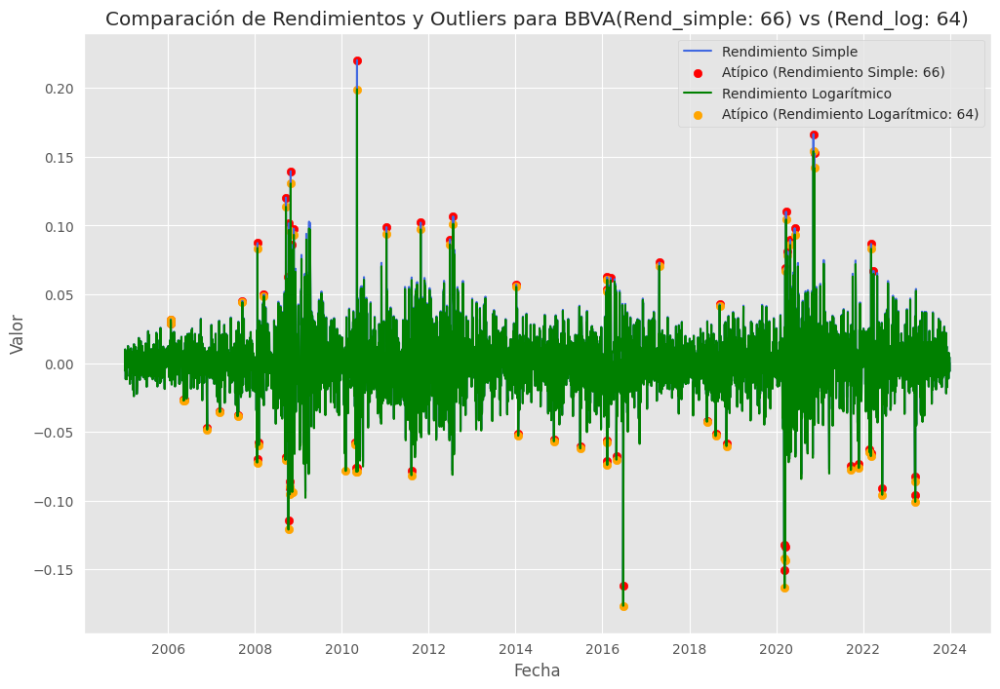

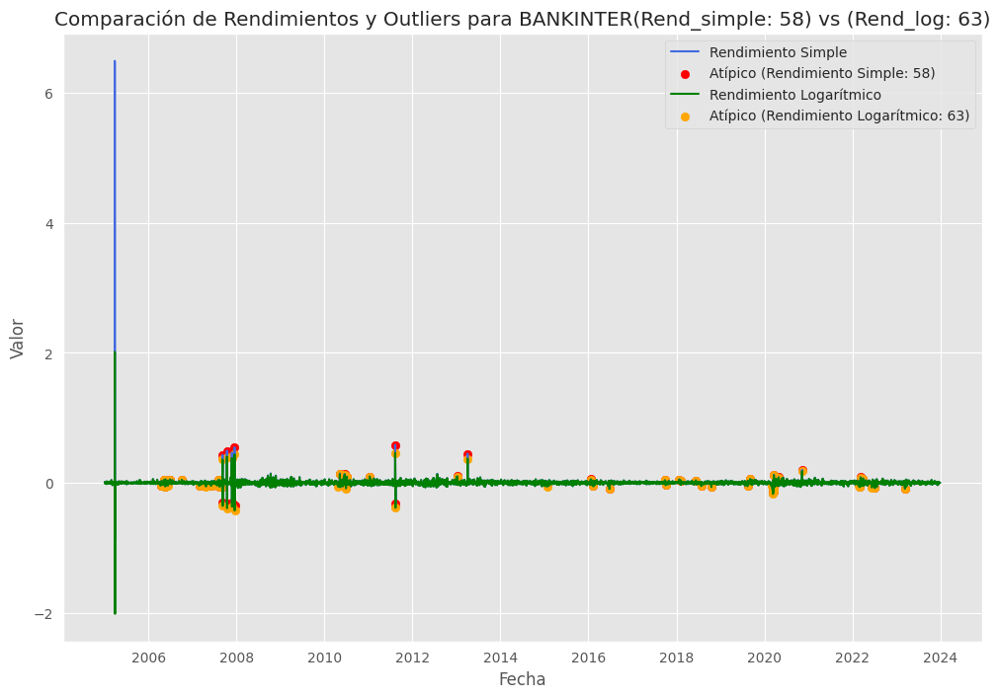

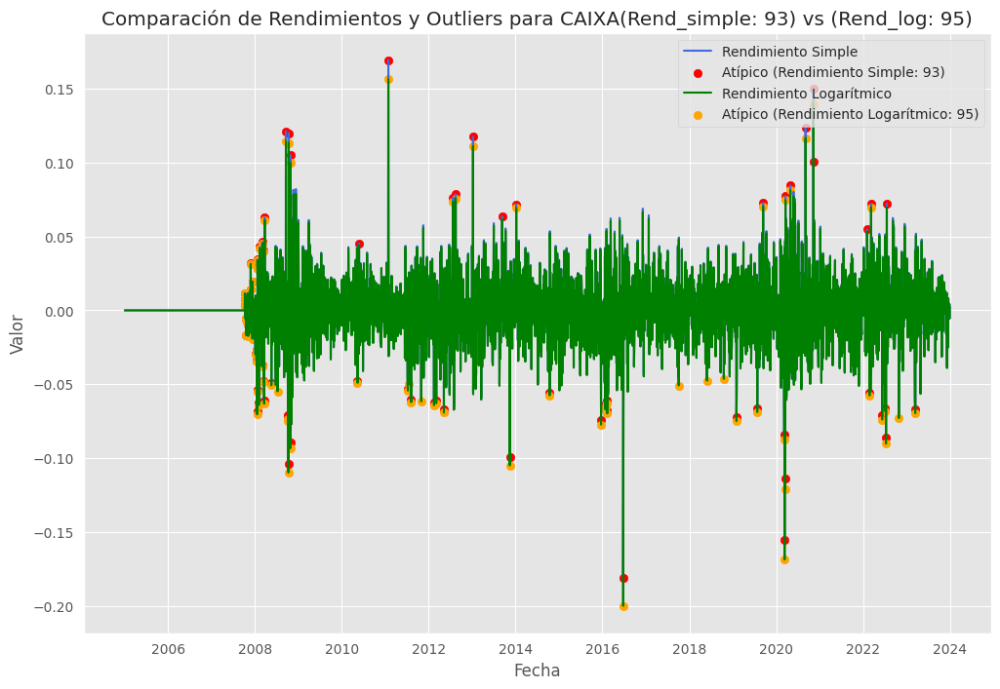

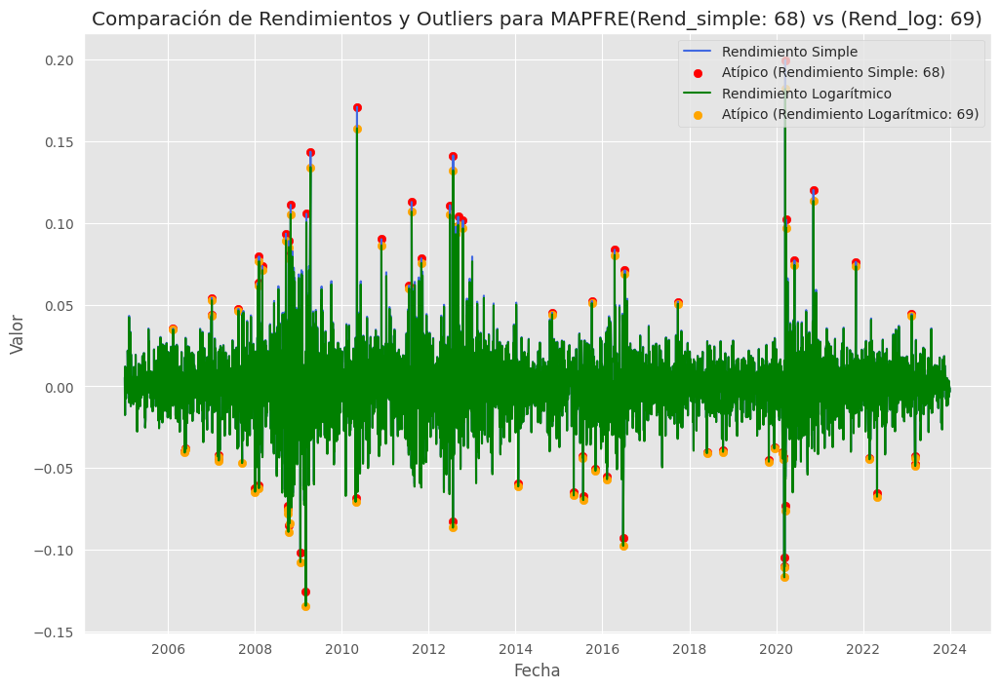

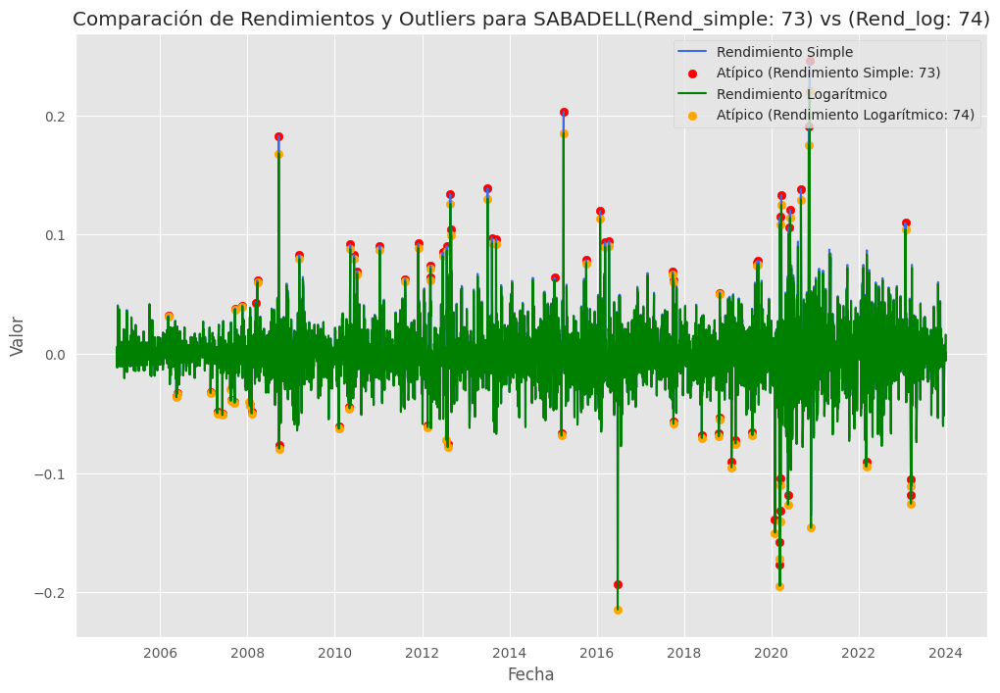

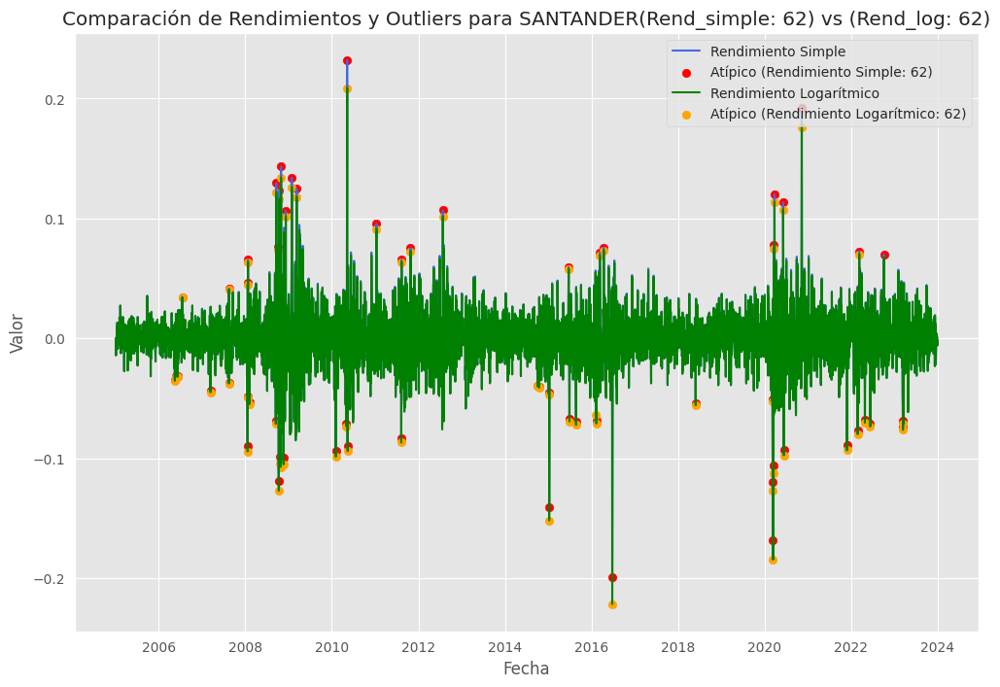

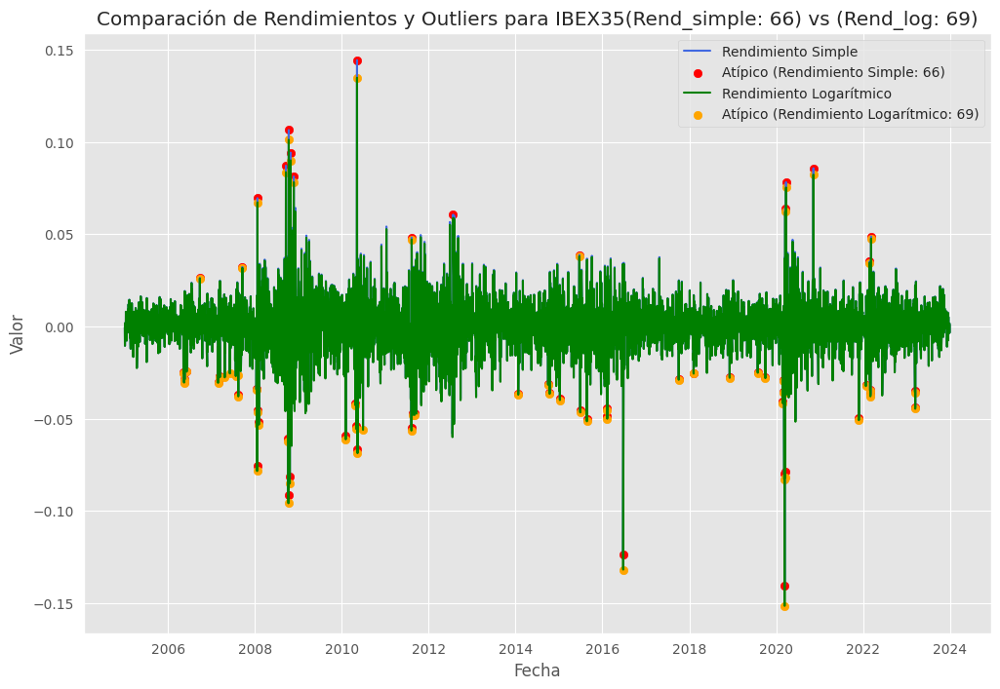

In [ ]:
# Iterar sobre cada activo y generar el  gráfico
for activo, df in combined_dataframes_outliers.items():
    # Crear subgráficos para cada activo
    fig, ax = plt.subplots(figsize=(12, 8))

    # Graficar rendimientos simples
    ax.plot(df.index, df[f'{activo}_Rendimiento_Simple'], color='royalblue', label='Rendimiento Simple')

    # Marcar outliers de rendimientos simples
    if 'outlier_simple' in df:
        outliers_count_simple = df['outlier_simple'].sum()
        outliers_simple = df.loc[df['outlier_simple'] == 1, [f'{activo}_Rendimiento_Simple']]
        ax.scatter(outliers_simple.index, outliers_simple[f'{activo}_Rendimiento_Simple'], color='red',
                   label=f'Atípico (Rendimiento Simple: {outliers_count_simple})')

    # Graficar rendimientos logarítmicos
    ax.plot(df.index, df[f'{activo}_Rendimiento_Log'], color='green', label='Rendimiento Logarítmico')

    # Marcar outliers de rendimientos logarítmicos
    if 'outlier_log' in df:
        outliers_count_log = df['outlier_log'].sum()
        outliers_log = df.loc[df['outlier_log'] == 1, [f'{activo}_Rendimiento_Log']]
        ax.scatter(outliers_log.index, outliers_log[f'{activo}_Rendimiento_Log'], color='orange',
                   label=f'Atípico (Rendimiento Logarítmico: {outliers_count_log})')

    # Establecer título y ejes
    ax.set_title(
                  f"Comparación de Rendimientos y Outliers para {activo}"
                  f"(Rend_simple: {outliers_count_simple}) vs (Rend_log: {outliers_count_log})"
                )
    ax.set_xlabel("Fecha")
    ax.set_ylabel("Valor")
    ax.legend(loc='upper right')

    # Mostrar la gráfica
    plt.show()


A continuación, se realizan los siguiente BoxPlot para continuar con la identificación de los outliers.

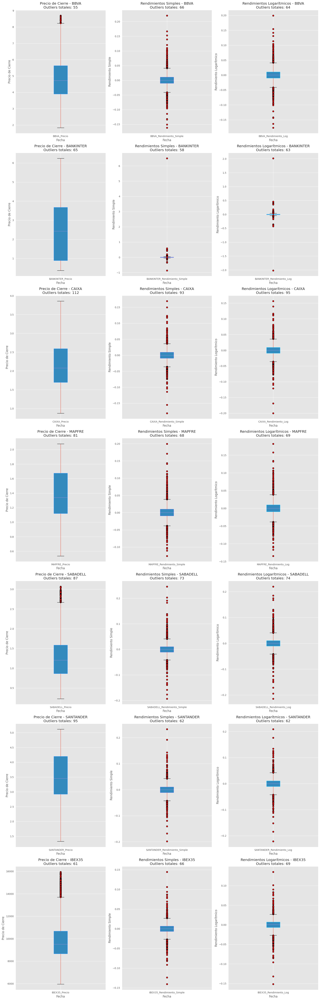

In [ ]:
# Crear una figura y ejes para las boxplots
fig, axes = plt.subplots(len(combined_dataframes_outliers), 3, figsize=(18, 8*len(combined_dataframes_outliers)))

# Iterar sobre cada activo y generar los boxplots en la misma fila
for i, (activo, df) in enumerate(combined_dataframes_outliers.items()):
    # Boxplot para el precio de cierre
    df.boxplot(column=f'{activo}_Precio', vert=True, patch_artist=True, boxprops=dict(color='dodgerblue'),
               flierprops=dict(markerfacecolor='red', marker='o'), ax=axes[i, 0])
    axes[i, 0].set_title(f'Precio de Cierre - {activo}\nOutliers totales: {df["outlier_precio"].sum()}')
    axes[i, 0].set_xlabel('Fecha')
    axes[i, 0].set_ylabel('Precio de Cierre')

    # Boxplot para los rendimientos simples
    df.boxplot(column=f'{activo}_Rendimiento_Simple', vert=True, patch_artist=True, boxprops=dict(color='royalblue'),
               flierprops=dict(markerfacecolor='red', marker='o'), ax=axes[i, 1])
    axes[i, 1].set_title(f'Rendimientos Simples - {activo}\nOutliers totales: {df["outlier_simple"].sum()}')
    axes[i, 1].set_xlabel('Fecha')
    axes[i, 1].set_ylabel('Rendimiento Simple')

    # Boxplot para los rendimientos logarítmicos
    df.boxplot(column=f'{activo}_Rendimiento_Log', vert=True, patch_artist=True, boxprops=dict(color='deepskyblue'),
               flierprops=dict(markerfacecolor='red', marker='o'), ax=axes[i, 2])
    axes[i, 2].set_title(f'Rendimientos Logarítmicos - {activo}\nOutliers totales: {df["outlier_log"].sum()}')
    axes[i, 2].set_xlabel('Fecha')
    axes[i, 2].set_ylabel('Rendimiento Logarítmico')

# Ajustar el diseño
plt.tight_layout()

# Mostrar la gráfica
plt.show()


In [ ]:
# Fin BoxPlot





Como se ha podido observar tanto el rendimiento simple como el logarítmico son prácticamente similares, y además, su número de outliers es prácticamente el mismo.

#### **Conjuntos de datos**

Con el propósito de obtener un conjunto de datos más depurado, se procede a la creación de un nuevo conjunto excluyendo los outliers identificados previamente para los precios de cierre, rendimientos simples y rendimientos logarítmicos.


In [ ]:
# Crear diccionarios para almacenar los DataFrames sin outliers
combined_dataframes_sin_outliers_precio = {}
combined_dataframes_sin_outliers_simple = {}
combined_dataframes_sin_outliers_log = {}

# Iterar sobre cada activo y su respectivo DataFrame
for activo, df in combined_dataframes_outliers.items():
    # Reemplazar los ceros por NaN en los precios de cierre
    df[f'{activo}_Precio'].replace(0, np.nan, inplace=True)
    # Seleccionar solo las filas que no son outliers para los precios de cierre
    df_sin_outliers_precio = df[df['outlier_precio'] == 0]
    # Seleccionar solo la columna de precios de cierre
    df_sin_outliers_precio = df_sin_outliers_precio[[f'{activo}_Precio']]
    # Almacenar el nuevo DataFrame sin outliers de los precios de cierre en el diccionario correspondiente
    combined_dataframes_sin_outliers_precio[activo] = df_sin_outliers_precio

    # Reemplazar los ceros por NaN en los rendimientos simples
    df[f'{activo}_Rendimiento_Simple'].replace(0, np.nan, inplace=True)
    # Seleccionar solo las filas que no son outliers para los rendimientos simples
    df_sin_outliers_simple = df[df['outlier_simple'] == False]
    # Seleccionar solo la columna de rendimientos simples
    df_sin_outliers_simple = df_sin_outliers_simple[[f'{activo}_Rendimiento_Simple']]
    # Almacenar el nuevo DataFrame sin outliers de los rendimientos simples en el diccionario correspondiente
    combined_dataframes_sin_outliers_simple[activo] = df_sin_outliers_simple

    # Reemplazar los ceros por NaN en los rendimientos logarítmicos
    df[f'{activo}_Rendimiento_Log'].replace(0, np.nan, inplace=True)
    # Seleccionar solo las filas que no son outliers para los rendimientos logarítmicos
    df_sin_outliers_log = df[df['outlier_log'] == False]
    # Seleccionar solo la columna de rendimientos logarítmicos
    df_sin_outliers_log = df_sin_outliers_log[[f'{activo}_Rendimiento_Log']]
    # Almacenar el nuevo DataFrame sin outliers de los rendimientos logarítmicos en el diccionario correspondiente
    combined_dataframes_sin_outliers_log[activo] = df_sin_outliers_log

# Concatenar los DataFrames en nuevos DataFrames
df_combined_sin_outliers_precio = pd.concat(combined_dataframes_sin_outliers_precio.values(), axis=1)
df_combined_sin_outliers_simple = pd.concat(combined_dataframes_sin_outliers_simple.values(), axis=1)
df_combined_sin_outliers_log = pd.concat(combined_dataframes_sin_outliers_log.values(), axis=1)

# Si se quiere disponer de los conjuntos finales sin nulos.
# Eliminar los nulos de los conjuntos de datos finales sin outliers.
# df_combined_sin_outliers_precio = df_combined_sin_outliers_precio.dropna() # Elimino del conjunto de datos los nulos
# df_combined_sin_outliers_simple = df_combined_sin_outliers_simple.dropna() # Elimino del conjunto de datos los nulos
# df_combined_sin_outliers_log = df_combined_sin_outliers_log.dropna() # Elimino del conjunto de datos los nulos


## **Estadística descriptiva**

Primero comprobamos como están generados los conjunto de datos.

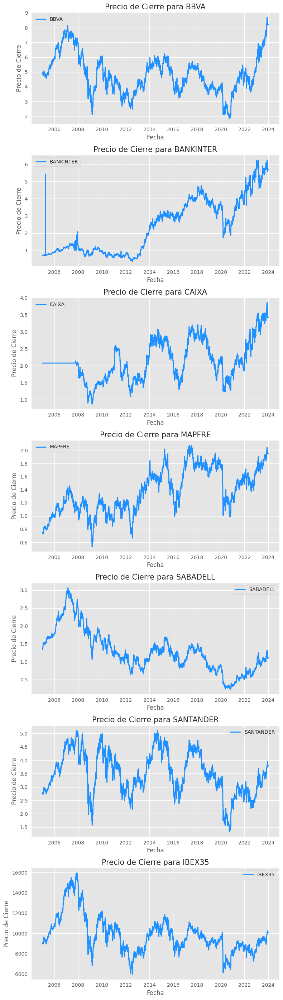

In [ ]:
# Obtener el número de columnas
num_columnas = len(data.columns)

# Definir el tamaño de la figura y los subplots
fig, axs = plt.subplots(num_columnas, 1, figsize=(8, 4*num_columnas))

# Iterar sobre cada columna del DataFrame
for i, columna in enumerate(data.columns):
    # Graficar la columna actual en el subplot correspondiente
    axs[i].plot(data.index, data[columna], lw=2, color='dodgerblue', label=columna)

    # Establecer título y etiquetas de los ejes con el nombre del activo
    axs[i].set_title(f"Precio de Cierre para {columna}", fontsize=15)
    axs[i].set_xlabel('Fecha')
    axs[i].set_ylabel('Precio de Cierre')

    # Mostrar leyenda
    axs[i].legend()

# Ajustar los subplots
plt.tight_layout()

# Mostrar los subplots
plt.show()


In [ ]:
# Fin conjunto de datos

Hemos podido visualizar la estructura de los conjuntos de datos de forma gráfica, lo que nos proporcionó una comprensión inicial de su generación. Para obtener un análisis más detallado sobre la evolución de los datos durante un período establecido, se llevó a cabo un examen exhaustivo en cada cuaderno individualizado.



La estadística descriptiva, como herramienta fundamental de análisis, posibilita la comprensión de los aspectos básicos de las variables, proporcionando una visión detallada y específica de su comportamiento y distribución, específicamente:

-   Número de observaciones (count).
-   Media (mean).
-   Desviación estándar (std).
-   Dato máximo de la muestra (max).
-   Dato mínimo de la muestra (min).
-   Quartiles ordenados de menor a mayor (25%, 50%, 75%).

In [ ]:
data.describe()

Ticker,BBVA,BANKINTER,CAIXA,MAPFRE,SABADELL,SANTANDER,IBEX35
count,4861.000000,4861.000000,4861.000000,4861.000000,4861.000000,4861.000000,4861.000000
mean,4.848639,2.398987,2.148690,1.377137,1.279650,3.509196,9880.085688
std,1.305519,1.576211,0.579275,0.332049,0.583745,0.802906,1854.722058
min,1.829429,0.364365,0.874844,0.535294,0.228581,1.326195,5956.293945
25%,3.897789,0.893257,1.696461,1.119531,0.863806,2.924380,8665.590820
50%,4.727282,2.429720,2.078433,1.339717,1.207595,3.457715,9507.000000
75%,5.631464,3.670134,2.592342,1.675516,1.587609,4.200846,10678.689453
max,8.696000,6.242889,3.858911,2.079051,3.069530,5.115027,15945.683594



En nuestro análisis, nos enfocaremos especialmente en la desviación estándar de cada variable. Observamos que la característica Bankinter exhibe una desviación estándar notablemente elevada. Además, notamos que su media es de 2.36, mientras que el valor máximo alcanza los 6.34. Esta discrepancia sugiere una varianza significativa en la variable. Similarmente, observamos un patrón similar para BBVA y el IBEX.Comprender la distribución de una variable puede ser crucial para determinar su relevancia en nuestro modelo. Por lo tanto, dado el alto nivel de desviación estándar en algunas variables, llevaremos a cabo un análisis de normalidad para evaluar su comportamiento.

Estas estadísticas proporcionan una visión general del comportamiento del precio de cierre de las acciones durante el período de estudio:


- Count (Conteo): Indica el número total de observaciones disponibles para el precio de cierre de las acciones durante el período analizado. En este caso, hay 4861 observaciones para cada activo.

- Mean (Media): Representa el promedio del precio de cierre de las acciones durante el período analizado. La media para cada activo varía: IBEX35 (9880.086), BBVA (4.849), SANTANDER (3.509), BANKINTER (2.438), CAIXA (2.337), MAPFRE (1.377), SABADELL (1.280).

- Std (Desviación Estándar): Indica la dispersión de los datos en torno a la media. Para cada activo, la desviación estándar es diferente: IBEX35 (1854.722), BANKINTER (1.602), BBVA (1.306), SANTANDER (0.803), CAIXA (0.630), SABADELL (0.584), MAPFRE (0.332). Se observa que BANKINTER y en menor medida BBVA  muestran desviaciones estándar relativamente altas en comparación con otros activos, lo que indica una mayor variabilidad en sus precios de cierre durante el período analizado

- Min (Mínimo): Es el precio mínimo registrado durante el período analizado para cada activo: IBEX35 (5956.294), BBVA (1.829), SANTANDER (1.326),  CAIXA (0.951),  MAPFRE (0.535), BANKINTER (0.370), SABADELL (0.229).

- 25%, 50%, 75% (Percentiles): Estos percentiles dividen los datos ordenados en cuatro partes iguales. El 25% indica que el 25% de los precios están por debajo de ese valor, el 50% es la mediana (la mitad de los precios están por encima y la otra mitad por debajo) y el 75% indica que el 75% de los precios están por debajo de ese valor. Es importante destacar que el IBEX35 presenta un valor máximo significativamente mayor que el tercer cuartil de los otros activos, lo que sugiere movimientos extremadamente grandes en comparación con el rango intercuartílico de los otros activos.

- Max (Máximo): Es el precio máximo registrado durante el período analizado para cada activo: IBEX35 (15945.684), BBVA (8.696), BANKINTER (6.344), SANTANDER (5.115), CAIXA (4.197), SABADELL (3.070), MAPFRE (2.079).

Estas estadísticas ofrecen una visión general del comportamiento del precio de cierre de las acciones durante el período de estudio, incluyendo su tendencia central, variabilidad y distribución.

#### **Analisis de normalidad**

Se realizó un análisis exhaustivo de normalidad con el objetivo de comprender la distribución de las variables y determinar su conformidad con una distribución normal. Inicialmente, se utilizó la visualización de histogramas para examinar cada variable estudiada. La observación detallada de estos histogramas reveló que algunas variables no muestran un sesgo ni una distribución normal.

##### **Histograma**

Un histograma es un gráfico que muestra la distribución de frecuencia de un conjunto de datos continuos. Las gráficas de histograma nos permiten visualizar la distribución de una variable al representar la frecuencia de ocurrencia de diferentes valores dentro de un rango específico. Estas representaciones ofrecen una visión detallada de la volatilidad y el comportamiento histórico del activo, lo que resulta fundamental para el análisis financiero. A continuación se muestran los histogramas para cada activo de sus valores de precio de cierre, rendimientos simples y rendimientos logaritmicos.

In [ ]:
# Renombrar las columnas de los DataFrames de rendimientos simples y logarítmicos
rendimientos_simple.columns = [f'{col}_Rendimiento_Simple' for col in rendimientos_simple.columns]
rendimientos_log.columns = [f'{col}_Rendimiento_Log' for col in rendimientos_log.columns]

# Fusionar los tres DataFrames usando pd.concat()
merged_data = pd.concat([data, rendimientos_simple, rendimientos_log], axis=1)
# Eliminar filas con valores NaN
merged_data = merged_data.dropna()

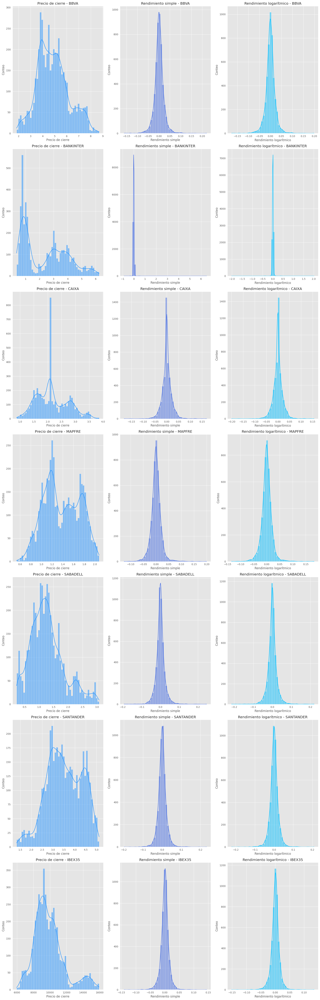

In [ ]:
# Obtener la lista de activos
activos = data.columns

# Definir el número de columnas para los subgráficos
num_columns = 3

# Calcular el número total de filas necesarias
num_filas = len(activos)

# Crear una figura y ejes para las gráficas
fig, axes = plt.subplots(num_filas, num_columns, figsize=(18, 8*num_filas))

# Iterar sobre cada activo
for i, activo in enumerate(activos):
    fila = i

    for j in range(num_columns):
        ax = axes[fila, j]

        # Determinar qué tipo de datos trazar en esta columna
        if j == 0:  # Graficar la distribución del precio de cierre
            sns.histplot(data=merged_data[activo], color="dodgerblue", kde=True, bins=50, ax=ax)
            ax.set_title(f"Precio de cierre - {activo}")
            ax.set_xlabel("Precio de cierre")
            ax.set_ylabel("Conteo")
        elif j == 1: # Graficar la distribución del rendimiento simple
            sns.histplot(data=merged_data[f'{activo}_Rendimiento_Simple'], color="royalblue", kde=True,
                         bins=50, ax=ax)
            ax.set_title(f"Rendimiento simple - {activo}")
            ax.set_xlabel("Rendimiento simple")
            ax.set_ylabel("Conteo")
        elif j == 2: # Graficar la distribución del rendimiento logarítmico
            sns.histplot(data=merged_data[f'{activo}_Rendimiento_Log'], color="deepskyblue", kde=True,
                         bins=50, ax=ax)
            ax.set_title(f"Rendimiento logarítmico - {activo}")
            ax.set_xlabel("Rendimiento logarítmico")
            ax.set_ylabel("Conteo")

# Ajustar el diseño y mostrarla
plt.tight_layout()
plt.show()

In [ ]:
# Histograma

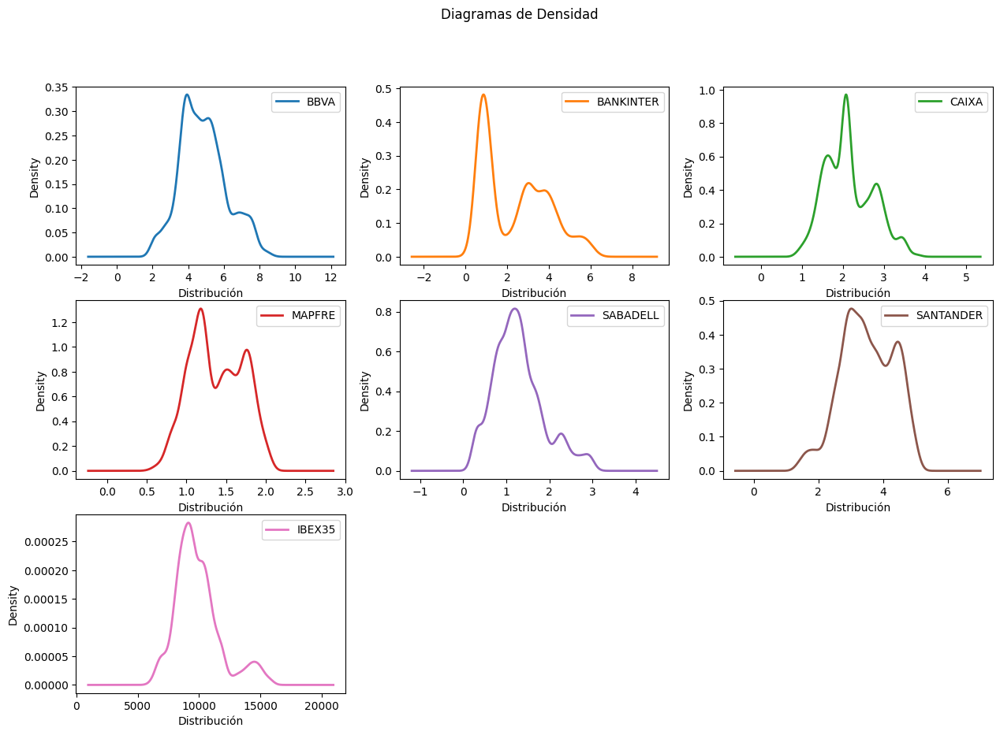

In [ ]:
plt.rcdefaults()
# Density Plots
axes = data.plot(kind='density', subplots=True, layout=(3,3), figsize=(15, 10),
                 sharex=False, linewidth=2, label='normal', title='Diagramas de Densidad')
for ax in axes.flatten():
    ax.set_xlabel('Distribución')
plt.show()

Se realizaron diferentes diagramas de densidad de las características para evaluar si siguen una distribución normal, proporcionando así una rápida impresión sobre la distribución de cada atributo. En estos diagramas, el eje y representa la densidad mientras que el eje x muestra la distribución. Durante el análisis visual de los datos, se ha observado que ciertos activos, como Bankinter, exhiben un comportamiento que se aparta claramente de una distribución normal.

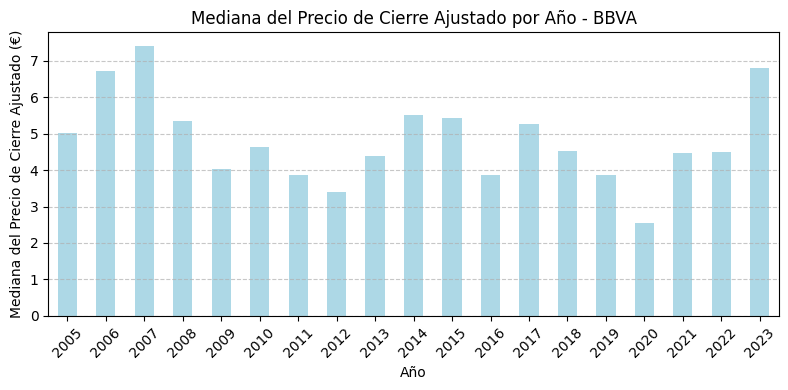

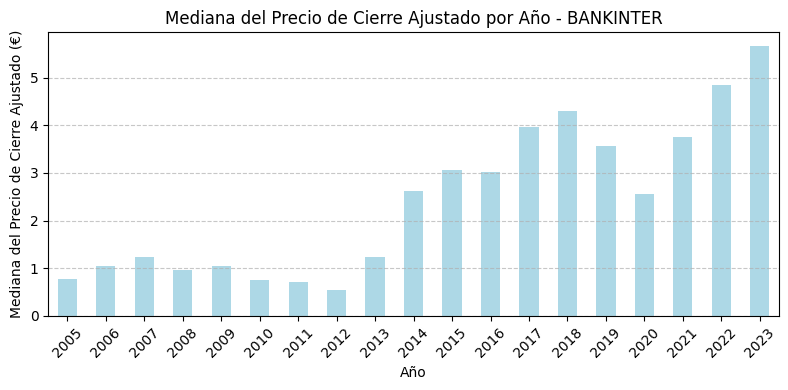

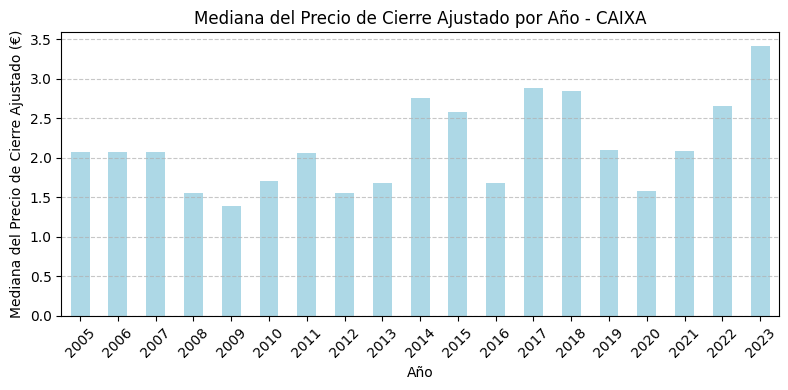

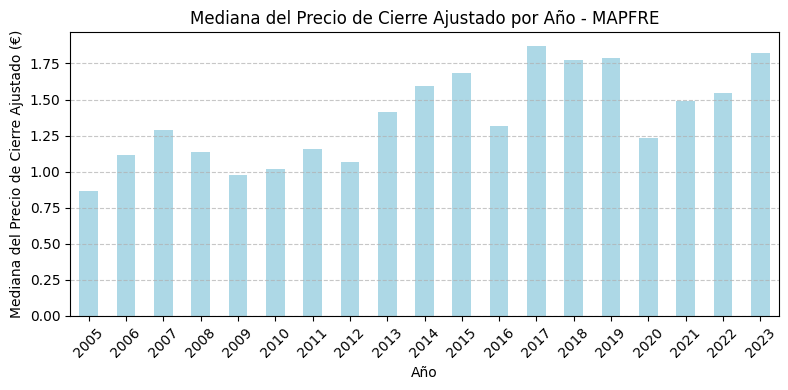

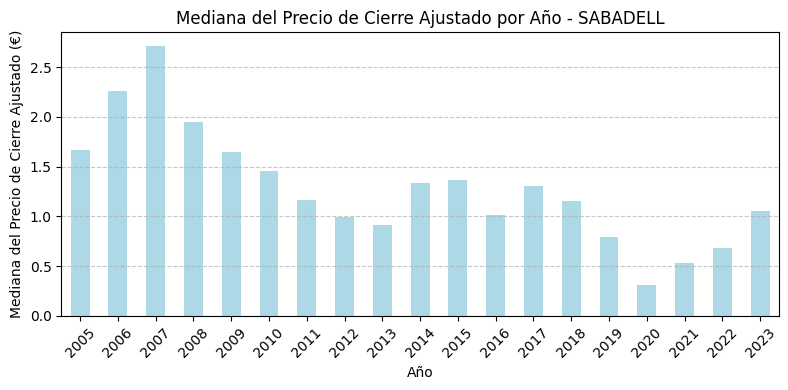

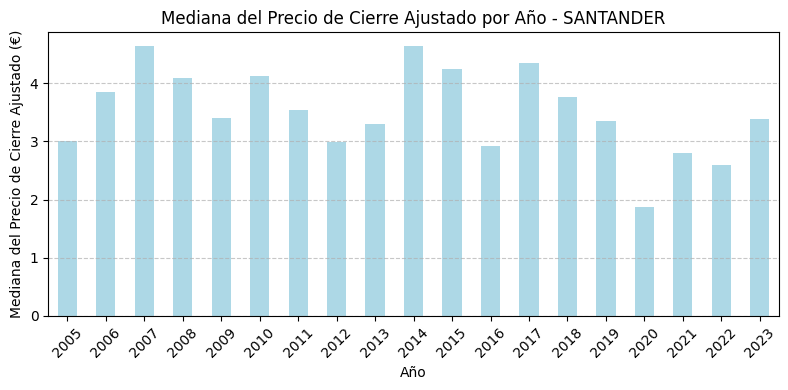

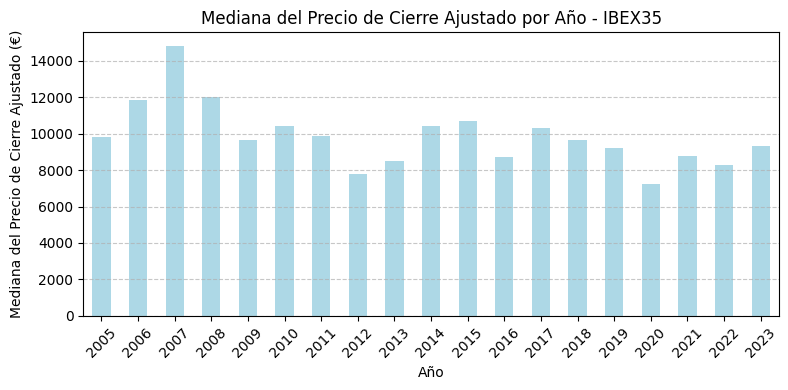

In [ ]:
# Calcular la mediana del precio de cierre ajustado para cada año y activo
yearly_median = merged_data.groupby([merged_data.index.year])[activos].median()

# Iterar sobre cada activo
for activo in activos:
    # Obtener la mediana
    activo_yearly_median = yearly_median[activo]

    # Graficar
    plt.figure(figsize=(8, 4))
    activo_yearly_median.plot(kind='bar', color='lightblue')
    plt.title(f'Mediana del Precio de Cierre Ajustado por Año - {activo}')
    plt.xlabel('Año')
    plt.ylabel('Mediana del Precio de Cierre Ajustado (€)')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

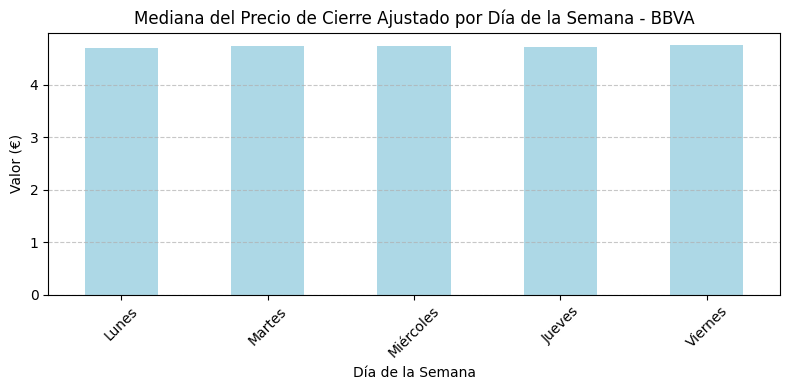

Valores medios del precio de cierre ajustado por día de la semana para BBVA:
Lunes: Mediana = 4.703290939331055
Martes: Mediana = 4.730181694030762
Miércoles: Mediana = 4.725439071655273
Jueves: Mediana = 4.715348243713379
Viernes: Mediana = 4.747400999069214


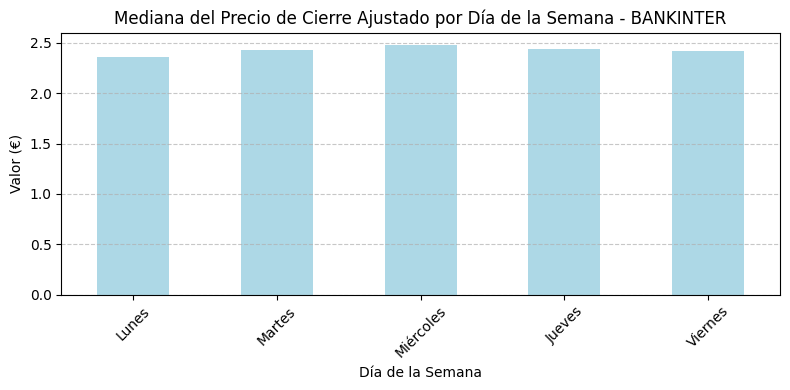

Valores medios del precio de cierre ajustado por día de la semana para BANKINTER:
Lunes: Mediana = 2.3633830547332764
Martes: Mediana = 2.433931589126587
Miércoles: Mediana = 2.476922035217285
Jueves: Mediana = 2.441145420074463
Viernes: Mediana = 2.422181725502014


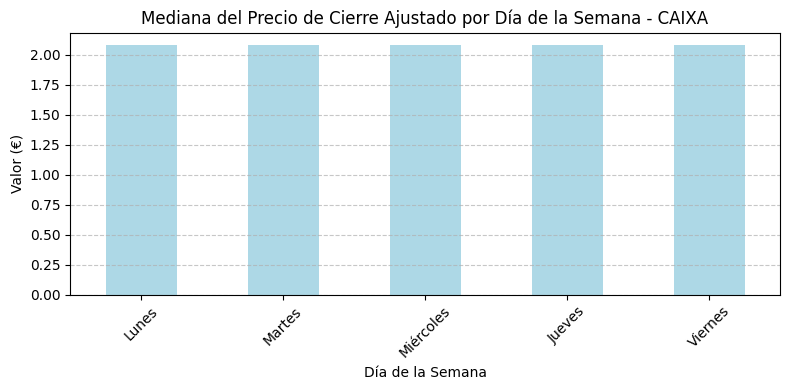

Valores medios del precio de cierre ajustado por día de la semana para CAIXA:
Lunes: Mediana = 2.078433036804199
Martes: Mediana = 2.078433036804199
Miércoles: Mediana = 2.078433036804199
Jueves: Mediana = 2.078433036804199
Viernes: Mediana = 2.078433036804199


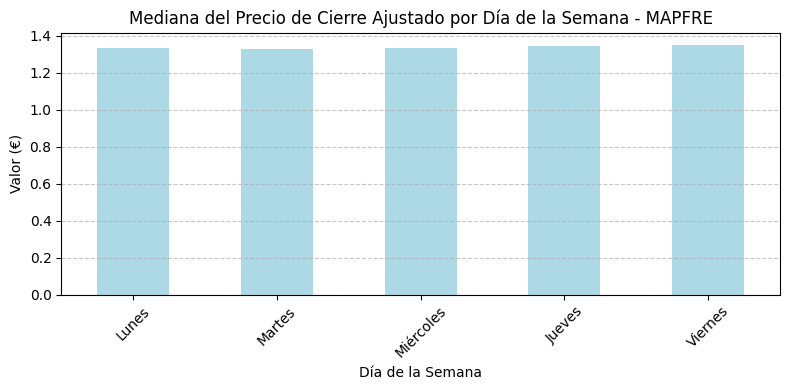

Valores medios del precio de cierre ajustado por día de la semana para MAPFRE:
Lunes: Mediana = 1.3339356184005737
Martes: Mediana = 1.328317642211914
Miércoles: Mediana = 1.3359367847442627
Jueves: Mediana = 1.3432704210281372
Viernes: Mediana = 1.3488541841506958


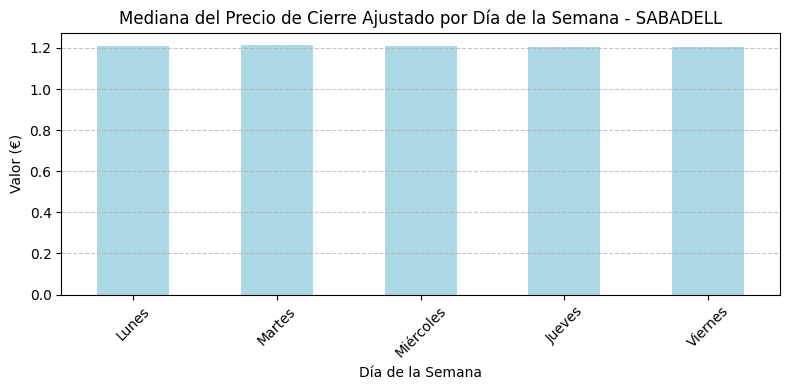

Valores medios del precio de cierre ajustado por día de la semana para SABADELL:
Lunes: Mediana = 1.2075954675674438
Martes: Mediana = 1.213065266609192
Miércoles: Mediana = 1.2109358310699463
Jueves: Mediana = 1.2051879167556763
Viernes: Mediana = 1.2051610946655273


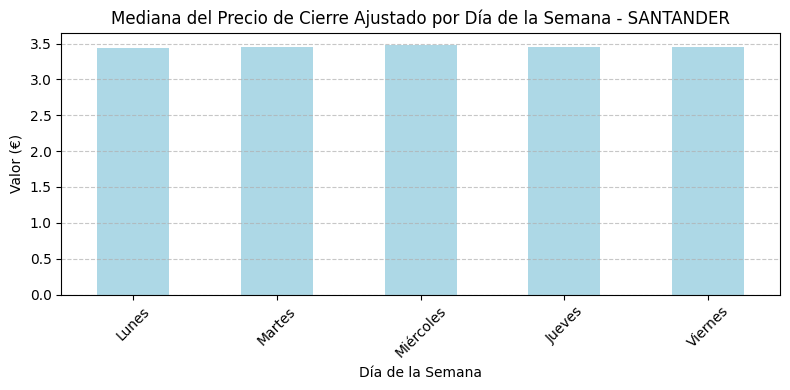

Valores medios del precio de cierre ajustado por día de la semana para SANTANDER:
Lunes: Mediana = 3.441253900527954
Martes: Mediana = 3.4538655281066895
Miércoles: Mediana = 3.475795030593872
Jueves: Mediana = 3.456880569458008
Viernes: Mediana = 3.4587485790252686


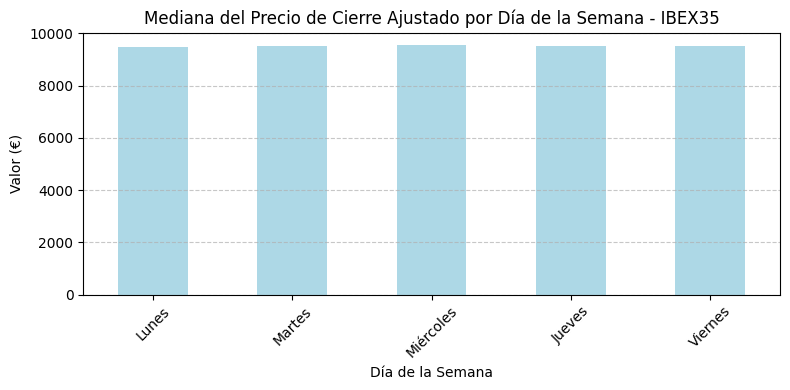

Valores medios del precio de cierre ajustado por día de la semana para IBEX35:
Lunes: Mediana = 9482.099609375
Martes: Mediana = 9510.2001953125
Miércoles: Mediana = 9546.7001953125
Jueves: Mediana = 9501.2001953125
Viernes: Mediana = 9517.4453125


In [ ]:
# Calcular la mediana del precio de cierre ajustado para cada día de la semana y activo
ticker_model_day = merged_data.copy()
ticker_model_day['Day_of_Week'] = ticker_model_day.index.dayofweek

# Asignar nombres a los días de la semana
dias_semana = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes']

# Iterar sobre cada activo
for activo in activos:
    # Calcular la mediana d
    weekly_median = ticker_model_day.groupby('Day_of_Week')[activo].median()

    # Graficar la mediana del precio de cierre ajustado por día de la semana
    plt.figure(figsize=(8, 4))
    weekly_median.plot(kind='bar', color='lightblue')
    plt.title(f'Mediana del Precio de Cierre Ajustado por Día de la Semana - {activo}')
    plt.xlabel('Día de la Semana')
    plt.ylabel('Valor (€)')
    plt.xticks(range(5), dias_semana, rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Mostrar los valores medios por día de la semana para el activo actual
    print(f"Valores medios del precio de cierre ajustado por día de la semana para {activo}:")
    for dia, valor in zip(dias_semana, weekly_median):
        print(f"{dia}: Mediana = {valor}")


##### **Box plot**

Además, se emplearon Box Plots para identificar posibles sesgos en las variables. Los resultados indicaron la presencia de sesgos en algunas de ellas.

Un diagrama de caja (box plot en inglés) es una herramienta gráfica que se utiliza para visualizar la distribución de un conjunto de datos y proporciona información sobre la mediana, el rango intercuartil (IQR, por sus siglas en inglés), los valores atípicos y la dispersión general de los datos.

  * **Mediana (línea en el centro):** La línea que divide la caja en dos partes representa la mediana de los datos, que es el valor que se encuentra en el punto medio de la distribución. Es útil para identificar la tendencia central de los datos.
  * **Caja (intercuartiles):** La caja muestra el rango intercuartil (IQR), que se extiende desde el primer cuartil (Q1) hasta el tercer cuartil (Q3). El IQR es la distancia entre el percentil 25 (Q1) y el percentil 75 (Q3) de los datos. La caja encierra el 50% central de los datos y proporciona una medida de la dispersión de estos datos.
  * **Bigotes (*whiskers*):** Los bigotes se extienden desde la caja hasta los valores extremos, pero no más allá de 1.5 veces el IQR desde la caja. Los valores que están más allá de estos límites se consideran valores atípicos y se representan individualmente.
  * **Valores Atípicos (puntos individuales):** Los puntos que se encuentran más allá de los bigotes se consideran valores atípicos y se muestran como puntos individuales en el gráfico. Estos valores suelen ser puntos de datos inusuales o extremos en la distribución.

<Figure size 800x400 with 0 Axes>

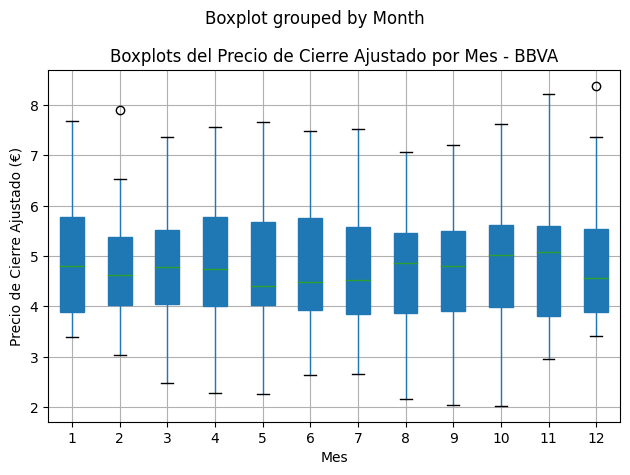

<Figure size 800x400 with 0 Axes>

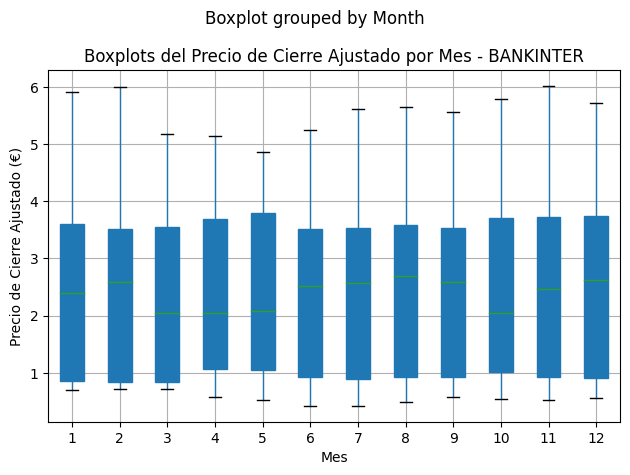

<Figure size 800x400 with 0 Axes>

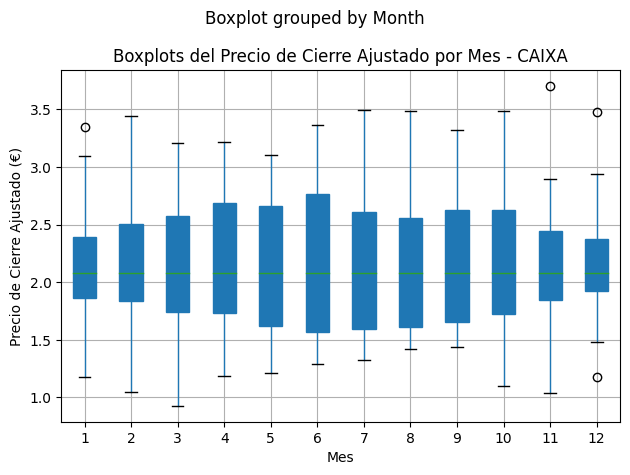

<Figure size 800x400 with 0 Axes>

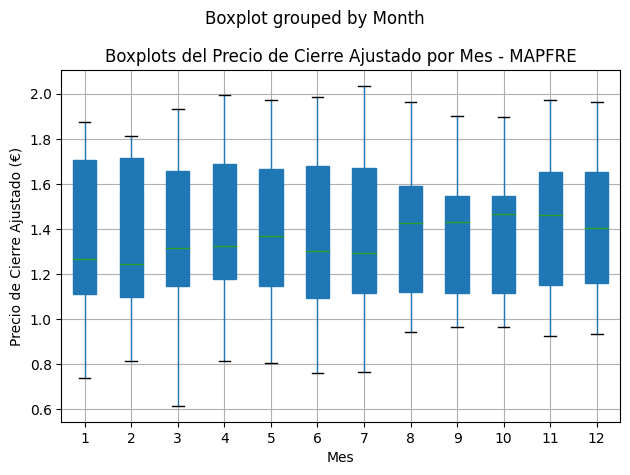

<Figure size 800x400 with 0 Axes>

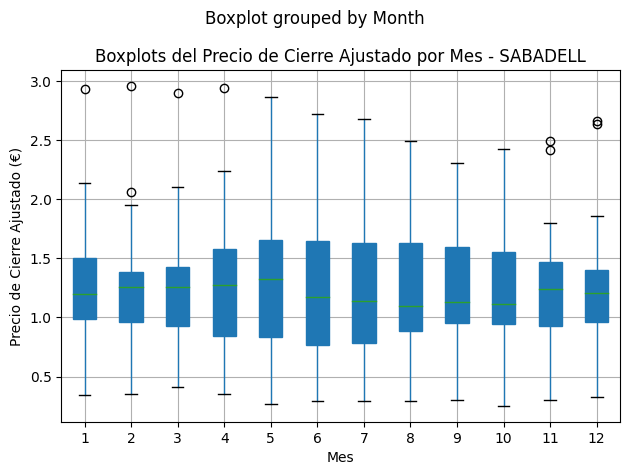

<Figure size 800x400 with 0 Axes>

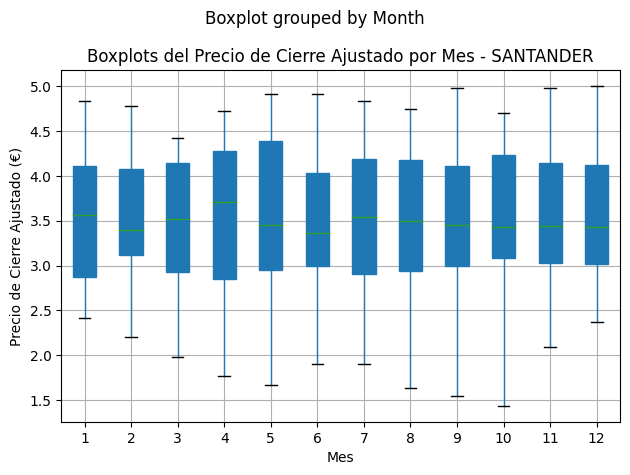

<Figure size 800x400 with 0 Axes>

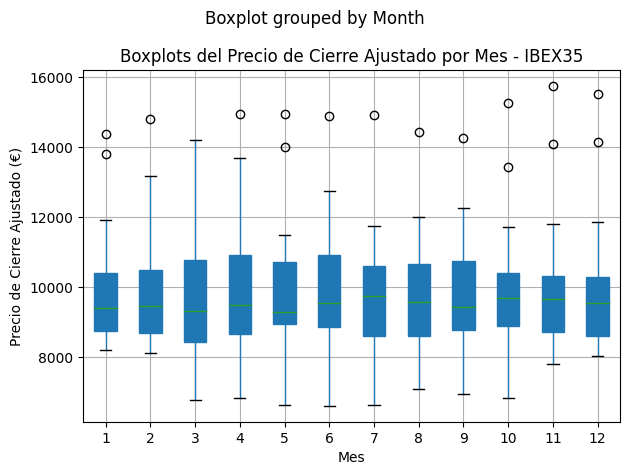

In [ ]:
# Calcular la mediana del precio de cierre ajustado para cada mes y activo
monthly_data = merged_data.resample('M').median()

# Iterar sobre cada activo para graficar la mediana del precio de cierre ajustado por mes
for activo in activos:
    # Crear un DataFrame mensual para el activo actual
    monthly_data_df = pd.DataFrame(monthly_data[activo], columns=[activo])

    # Crear una nueva columna para el mes
    monthly_data_df['Month'] = monthly_data_df.index.month

    # Crear boxplots para cada mes
    plt.figure(figsize=(8, 4))
    monthly_data_df.boxplot(column=activo, by='Month', vert=True, patch_artist=True)
    plt.title(f'Boxplots del Precio de Cierre Ajustado por Mes - {activo}')
    plt.xlabel('Mes')
    plt.ylabel('Precio de Cierre Ajustado (€)')
    plt.tight_layout()
    plt.show()

##### **Sesgo**

El sesgo (*skewness* en inglés) es una medida estadística que describe la **asimetría de la distribución** de los datos en un histograma o una gráfica de densidad. Indica la dirección y el grado en que la distribución de los datos se desvía de una distribución simétrica.

El sesgo se calcula de la siguiente manera:

  * Si el sesgo es igual a 0, la distribución es perfectamente simétrica.
  * Si el sesgo es positivo, significa que la distribución tiene una cola derecha más larga y es asimétrica hacia la derecha (positiva).
  * Si el sesgo es negativo, significa que la distribución tiene una cola izquierda más larga y es asimétrica hacia la izquierda (negativa).

El sesgo es una medida útil para comprender la forma de la distribución de los datos y puede proporcionar información sobre la simetría o asimetría de los mismos

###### **Sesgo del precio de cierre**

BBVA
Sesgo : 0.38


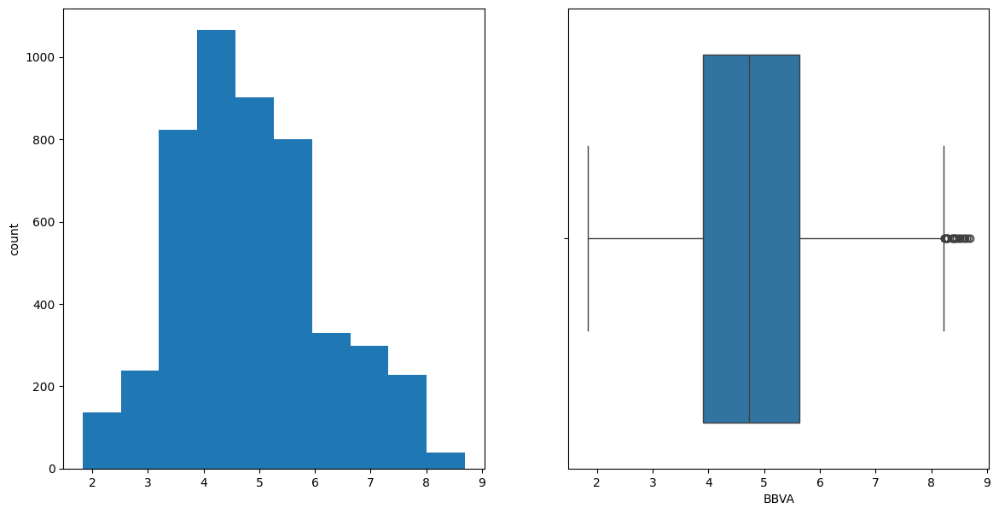

BANKINTER
Sesgo : 0.46


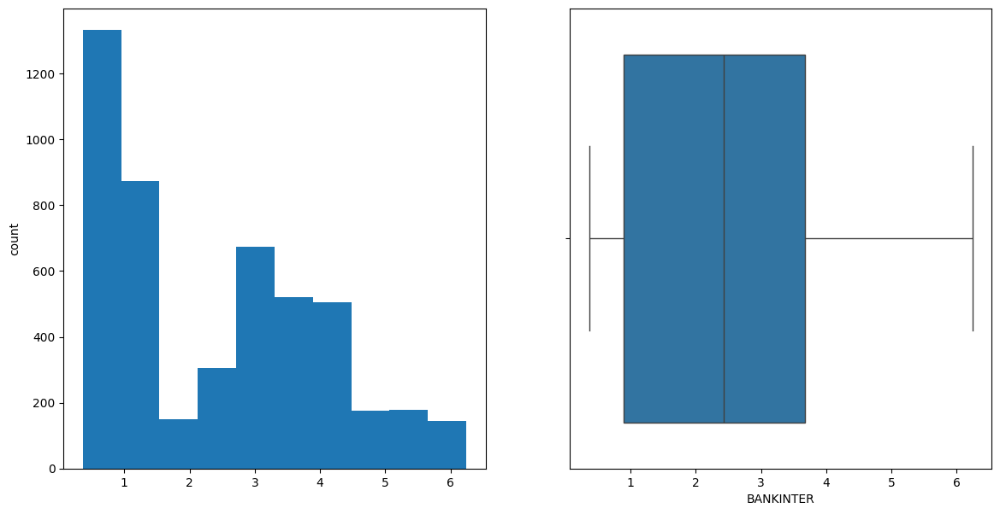

CAIXA
Sesgo : 0.41


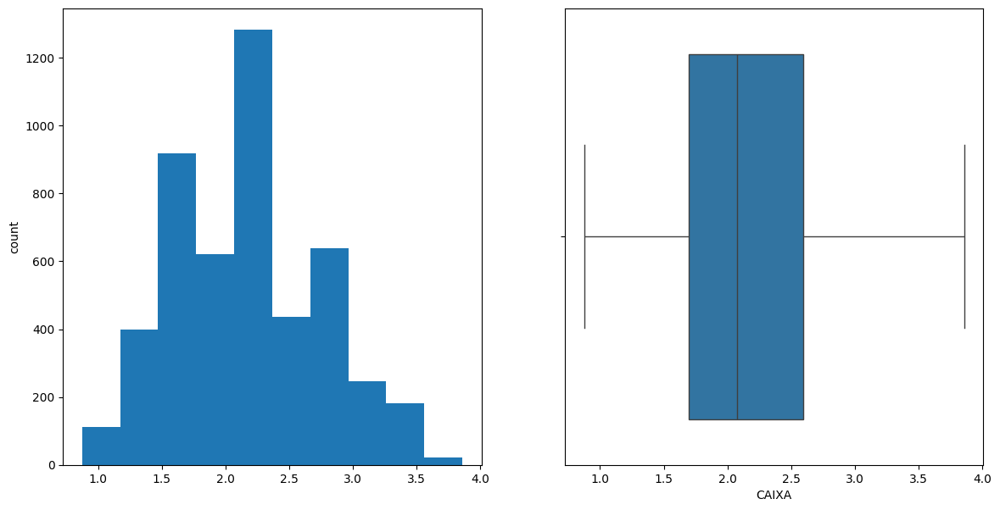

MAPFRE
Sesgo : 0.06


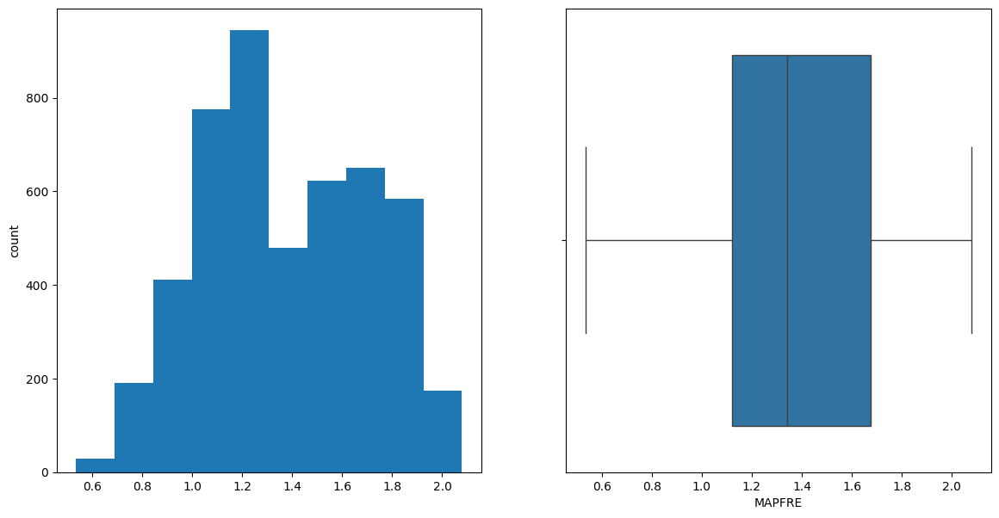

SABADELL
Sesgo : 0.74


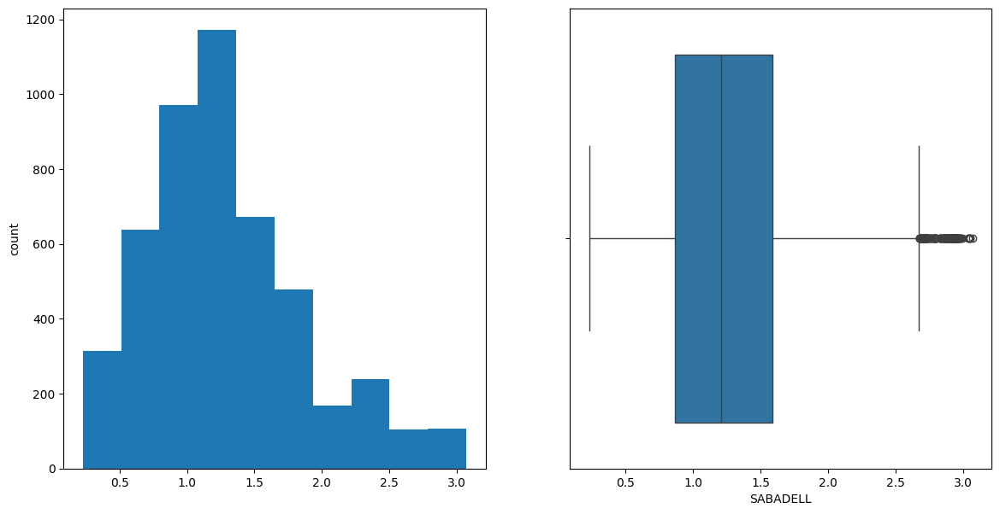

SANTANDER
Sesgo : -0.15


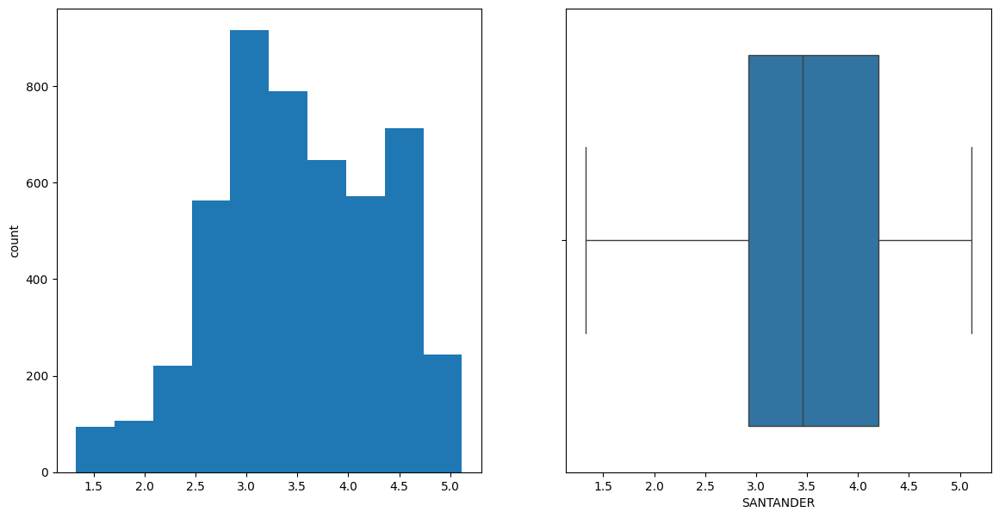

IBEX35
Sesgo : 1.03


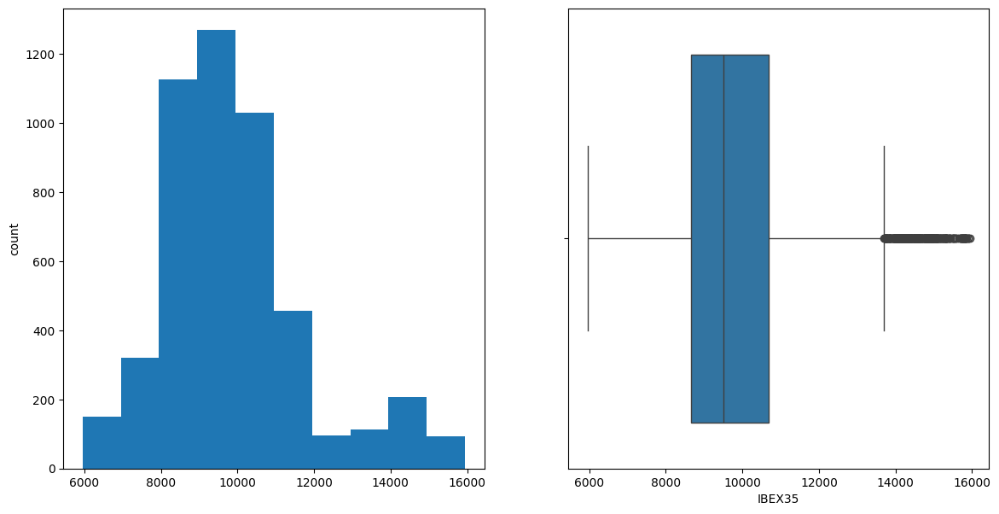

In [ ]:
num_cols = data.select_dtypes(include=np.number).columns.tolist()
for col in num_cols:
    print(col)
    print('Sesgo :', round(data[col].skew(), 2))
    plt.figure(figsize = (14, 7))
    plt.subplot(1, 2, 1)
    data[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.show()

###### **Sesgo del rendimiento simple**

A continuación, se procede a revisar los sesgos para el rendimiento simple de los diferentes activos financieros. Como ya hemos comprobado el análisis de sesgos proporciona información crucial sobre la dirección y la magnitud de cualquier tendencia sistemática en los retornos de los activos financieros. Esto incluye sesgos positivos, que indican un rendimiento por encima del promedio, y sesgos negativos, que señalan un rendimiento por debajo del promedio.

BBVA_Rendimiento_Simple
Sesgo : 0.29


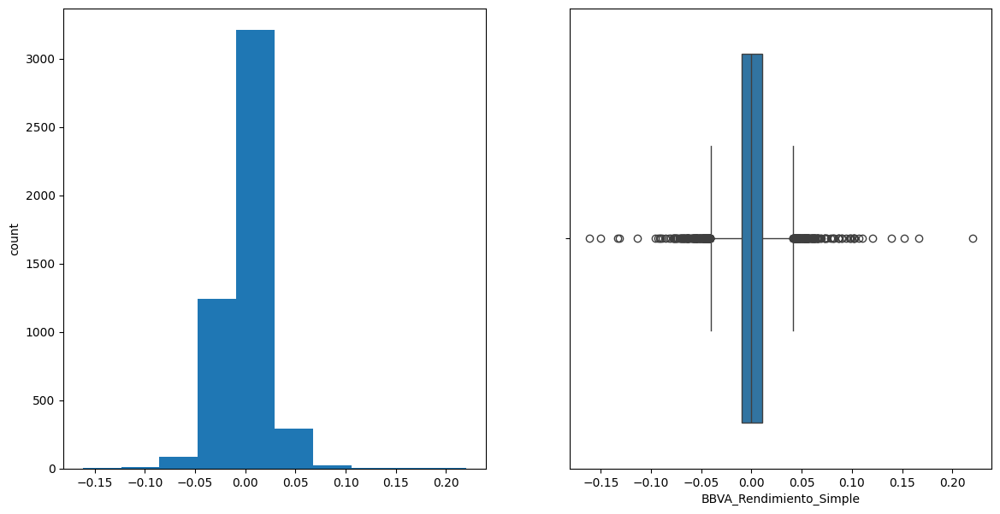

BANKINTER_Rendimiento_Simple
Sesgo : 58.81


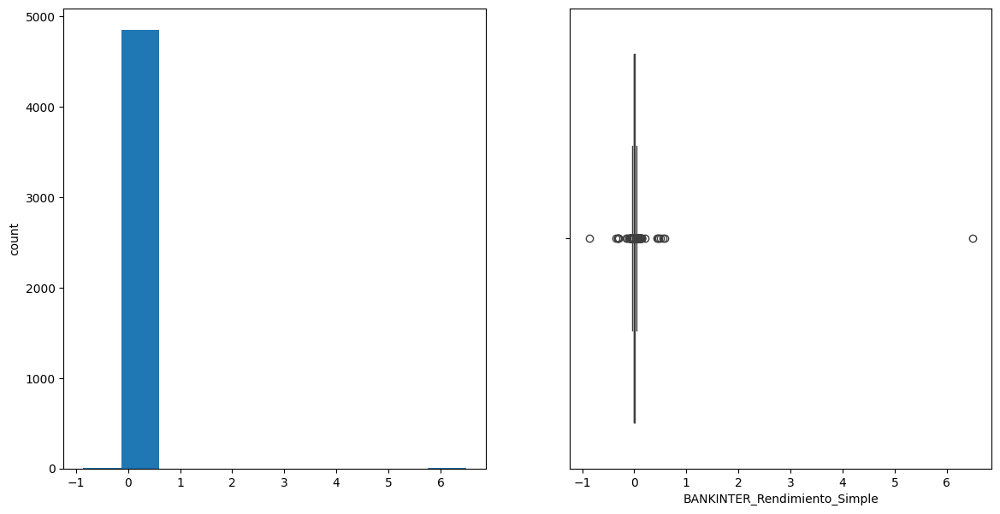

CAIXA_Rendimiento_Simple
Sesgo : 0.1


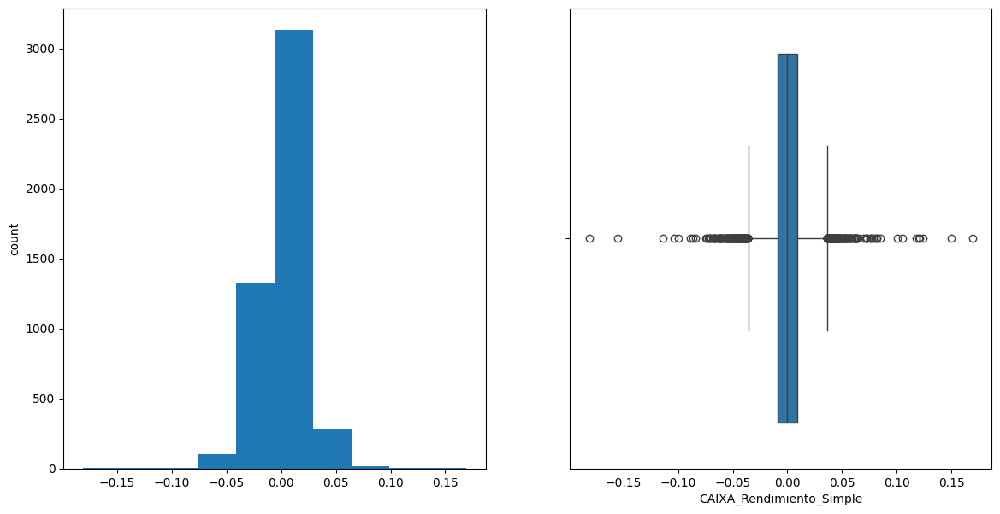

MAPFRE_Rendimiento_Simple
Sesgo : 0.67


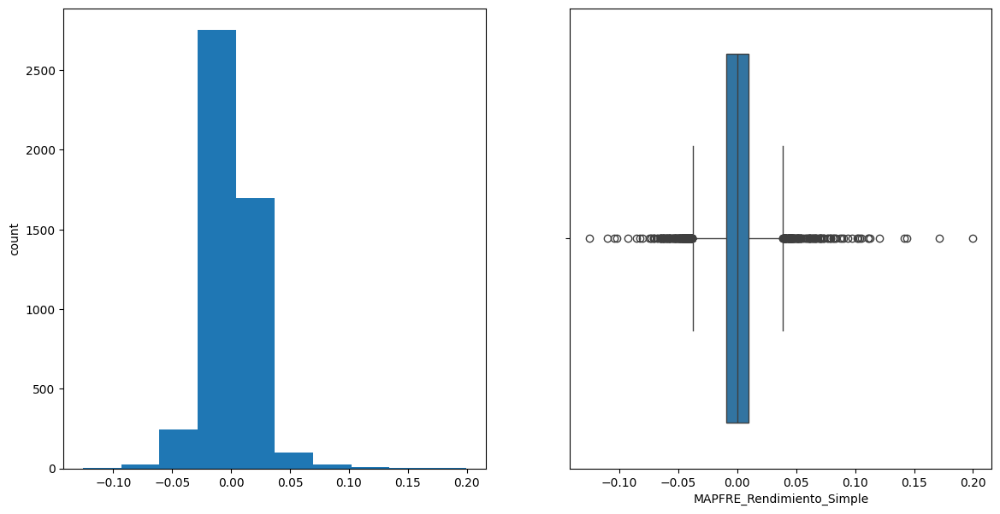

SABADELL_Rendimiento_Simple
Sesgo : 0.5


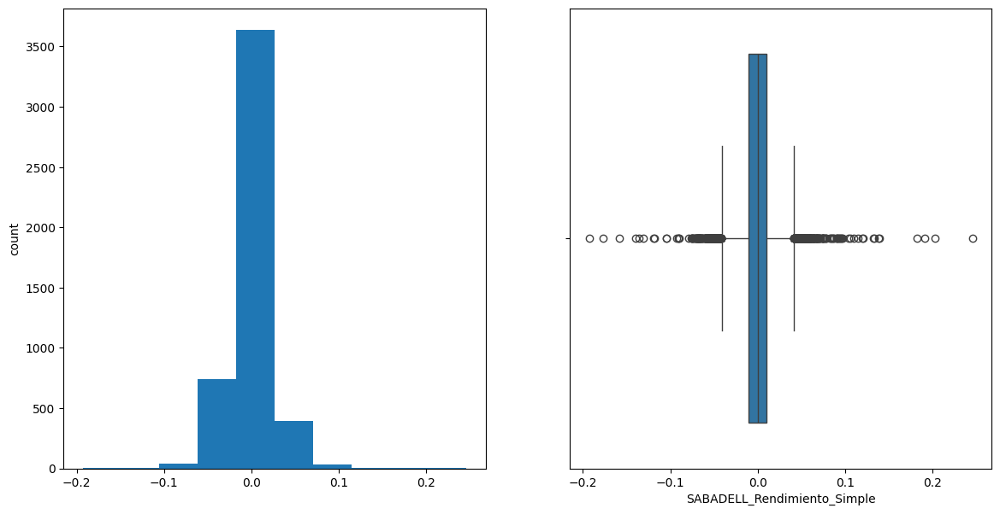

SANTANDER_Rendimiento_Simple
Sesgo : 0.24


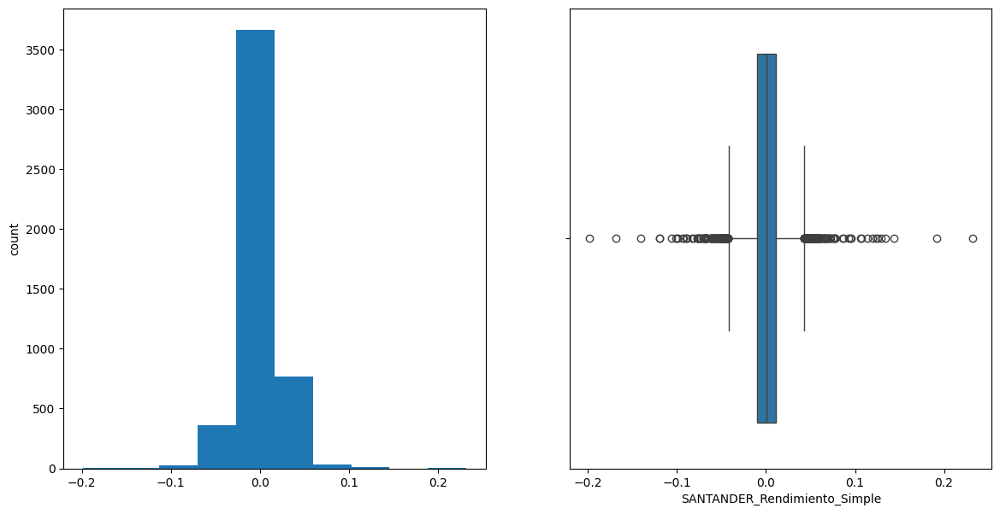

IBEX35_Rendimiento_Simple
Sesgo : -0.14


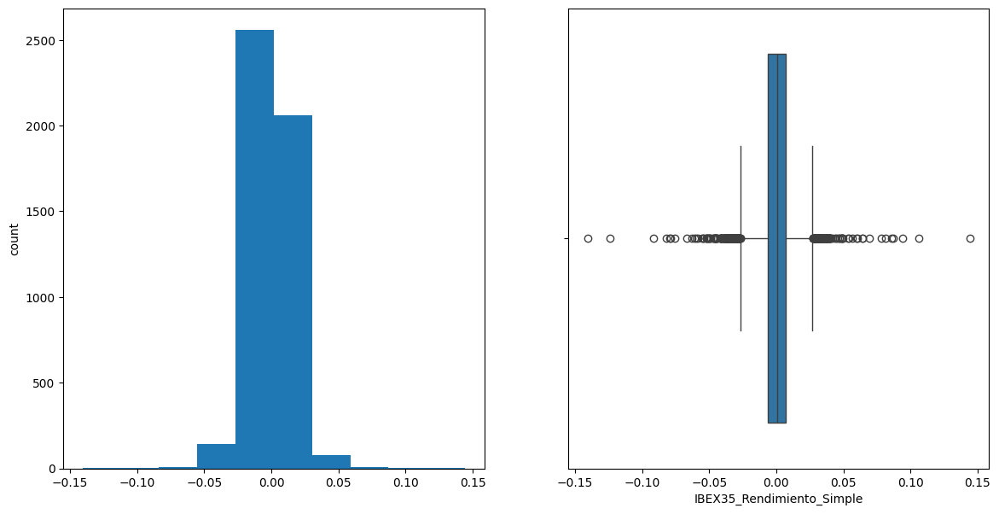

In [ ]:
num_cols_r = rendimientos_simple.select_dtypes(include=np.number).columns.tolist()
for col in num_cols_r:
    print(col)
    print('Sesgo :', round(rendimientos_simple[col].skew(), 2))
    plt.figure(figsize = (14, 7))
    plt.subplot(1, 2, 1)
    rendimientos_simple[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=rendimientos_simple[col])
    plt.show()

###### **Sesgo del rendimiento logarítmico**

A continuación, se procede a revisar los sesgos para el rendimiento logarítmico de los diferentes activos financieros. Como ya hemos comprobado el análisis de sesgos proporciona información crucial sobre la dirección y la magnitud de cualquier tendencia sistemática en los retornos de los activos financieros. Esto incluye sesgos positivos, que indican un rendimiento por encima del promedio, y sesgos negativos, que señalan un rendimiento por debajo del promedio.

BBVA_Rendimiento_Log
Sesgo : -0.01


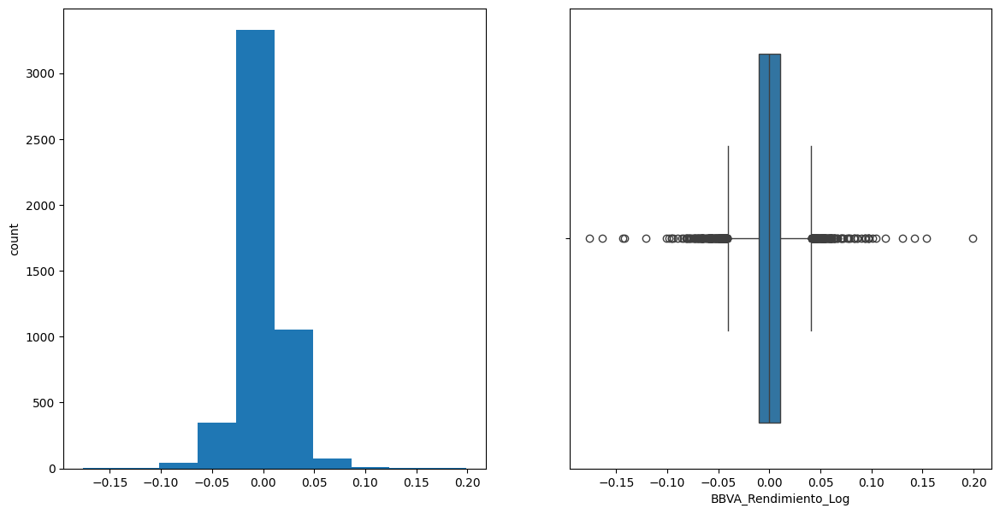

BANKINTER_Rendimiento_Log
Sesgo : 0.11


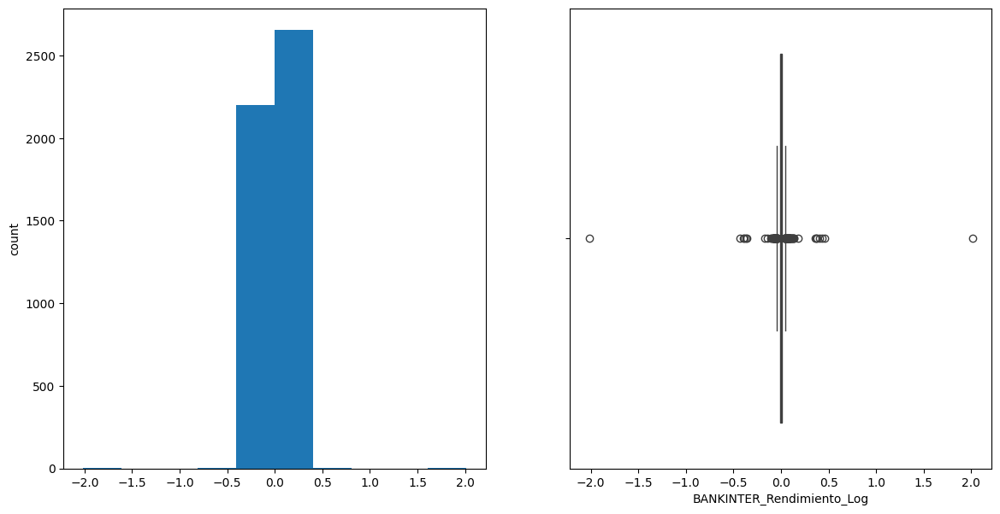

CAIXA_Rendimiento_Log
Sesgo : -0.17


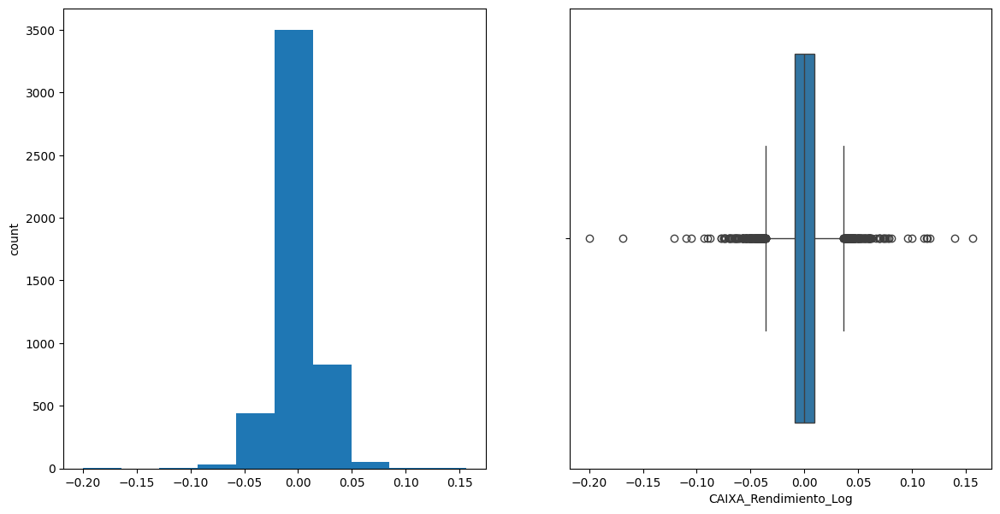

MAPFRE_Rendimiento_Log
Sesgo : 0.4


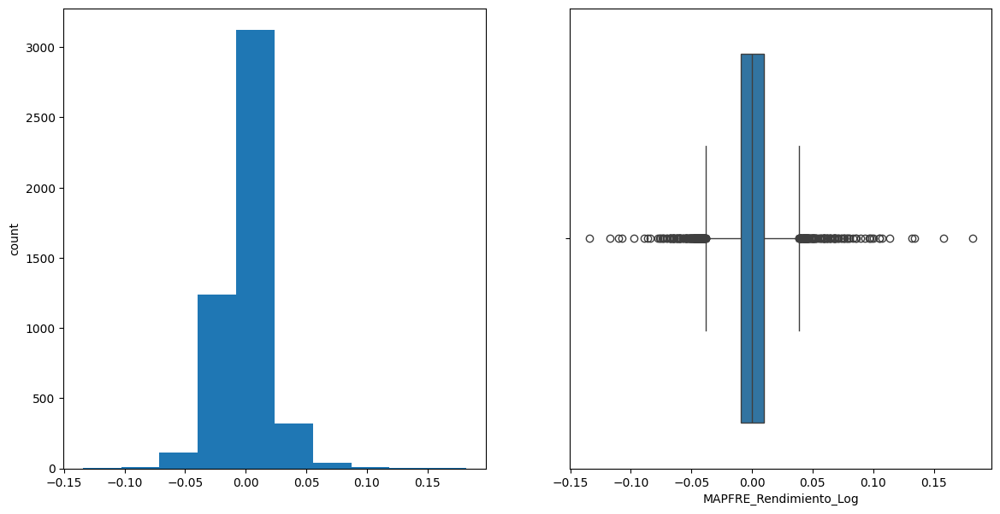

SABADELL_Rendimiento_Log
Sesgo : 0.09


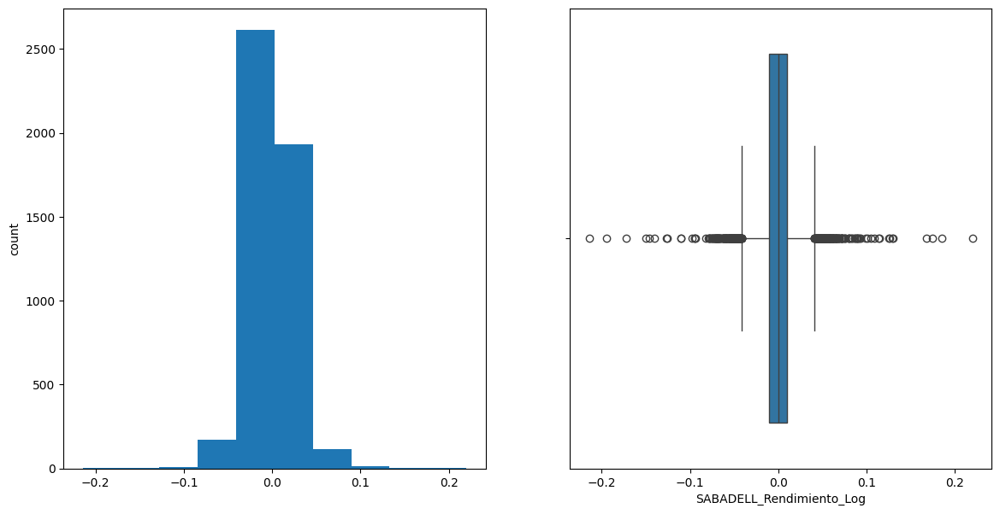

SANTANDER_Rendimiento_Log
Sesgo : -0.13


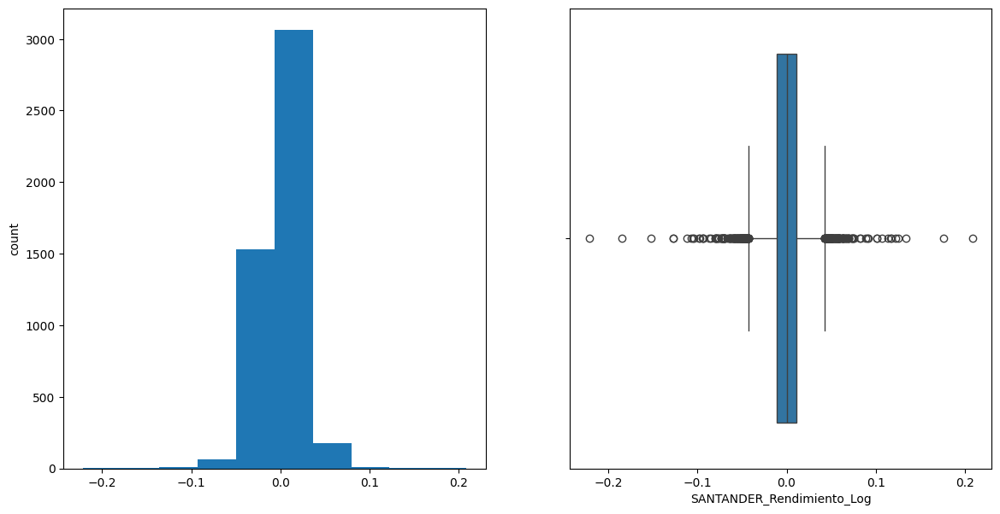

IBEX35_Rendimiento_Log
Sesgo : -0.39


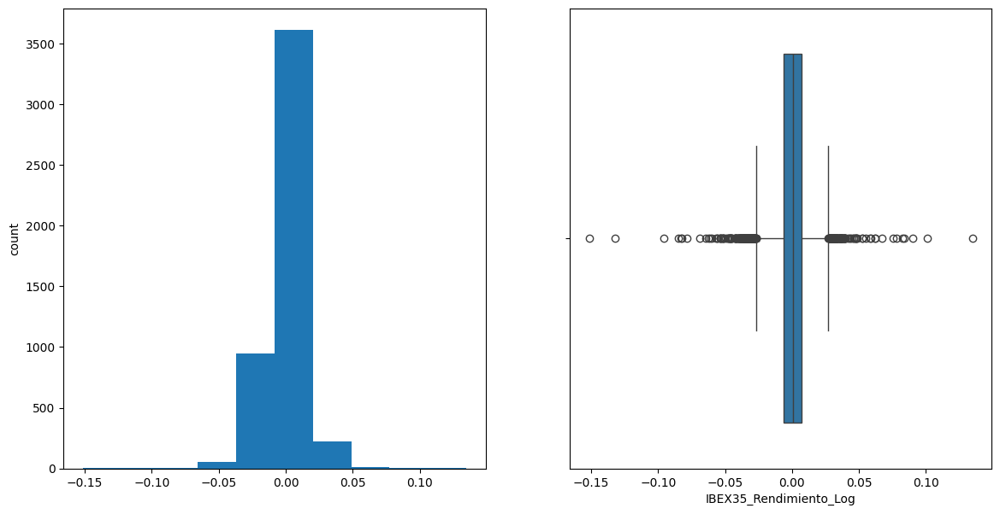

In [ ]:
num_cols_r = rendimientos_log.select_dtypes(include=np.number).columns.tolist()
for col in num_cols_r:
    print(col)
    print('Sesgo :', round(rendimientos_log[col].skew(), 2))
    plt.figure(figsize = (14, 7))
    plt.subplot(1, 2, 1)
    rendimientos_log[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=rendimientos_log[col])
    plt.show()

##### **Grafico cuantil cuantil (Q-Q plot)**

El gráfico Cuantil-Cuantil, conocido como Q-Q Plot, representa dos conjuntos de cuantiles uno contra otro.

Un cuantil representa una fracción donde ciertos valores caen por debajo de ese punto. Por ejemplo, la mediana es un cuantil donde el 50% de los datos caen por debajo de ese valor y el 50% restante se encuentra por encima de él.

El propósito principal de los Q-Q plots es determinar si dos conjuntos de datos provienen de la misma distribución. En el gráfico Q-Q, se traza una línea diagonal a 45 grados; si los dos conjuntos de datos se distribuyen de manera similar, los puntos se distribuirán cerca de esta línea de referencia.

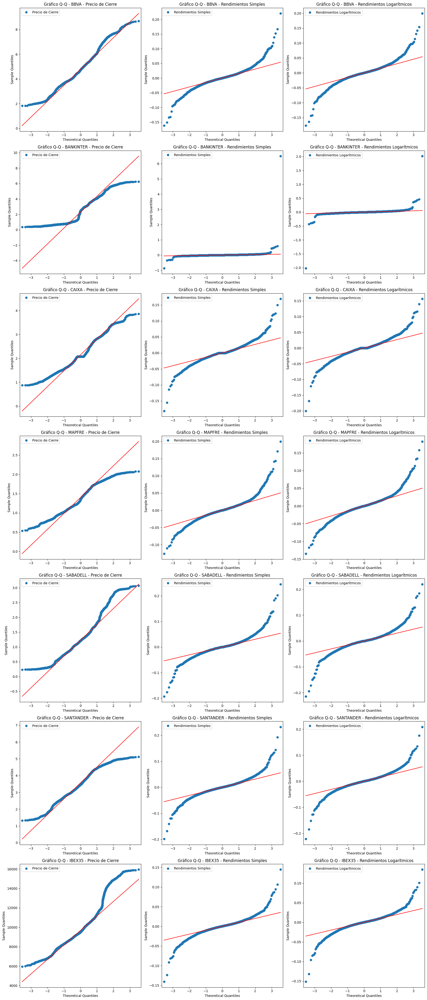

In [ ]:
# Calcular el número total de activos
num_activos = len(activos)

# Definir el número de columnas para los subgráficos
num_columns = 3

# Calcular el número total de filas necesarias
num_filas = num_activos

# Crear una figura y ejes para las gráficas
fig, axes = plt.subplots(num_filas, num_columns, figsize=(18, 6*num_filas))

# Iterar sobre cada activo
for i, activo in enumerate(activos):
    fila = i
    ax = axes[fila, 0]

    # Graficar el gráfico Q-Q para el precio de cierre del activo actual
    qq_plot_cierre = sm.qqplot(merged_data[activo], line='q', ax=ax, color='dodgerblue', label='Precio de Cierre')
    ax.set_title(f'Gráfico Q-Q - {activo} - Precio de Cierre')
    ax.legend()

    ax = axes[fila, 1]

    # Graficar el gráfico Q-Q para los rendimientos simples del activo actual
    qq_plot_simple = sm.qqplot(merged_data[f'{activo}_Rendimiento_Simple'], line='q', ax=ax, color='royalblue',
                               label='Rendimientos Simples')
    ax.set_title(f'Gráfico Q-Q - {activo} - Rendimientos Simples')
    ax.legend()

    ax = axes[fila, 2]

    # Graficar el gráfico Q-Q para los rendimientos logarítmicos del activo actual
    qq_plot_log = sm.qqplot(merged_data[f'{activo}_Rendimiento_Log'], line='q', ax=ax, color='deepskyblue',
                            label='Rendimientos Logarítmicos')
    ax.set_title(f'Gráfico Q-Q - {activo} - Rendimientos Logarítmicos')
    ax.legend()

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()



Los gráficos Q-Q (cuantil-cuantil) comparan cuantiles de dos distribuciones para evaluar si provienen de la misma población. Se traza una línea diagonal de referencia, si los puntos se alinean cerca de esta línea, indica que los datos se ajustan a una distribución normal. En estas visualizaciones podemos analizar cómo se distribuyen los precios de cierre, los rendimientos simples y los rendimientos logarítmicos del activo financiero.

En general, los gráficos Q-Q muestran que la línea de los datos no sigue la diagonal de referencia, y en los extremos se aleja considerablemente de sus valores esperados. Dado que las distribuciones de los rendimientos simples y logarítmicos no ofrecen resultados prometedores, se procede a visualizar nuevamente los gráficos, pero esta vez con el conjunto de datos modificado, el cual excluye los outliers para el precio de cierre, los rendimientos simples y los rendimientos logarítmicos del activo financiero.


###### **Q-Q plot sin outliers**

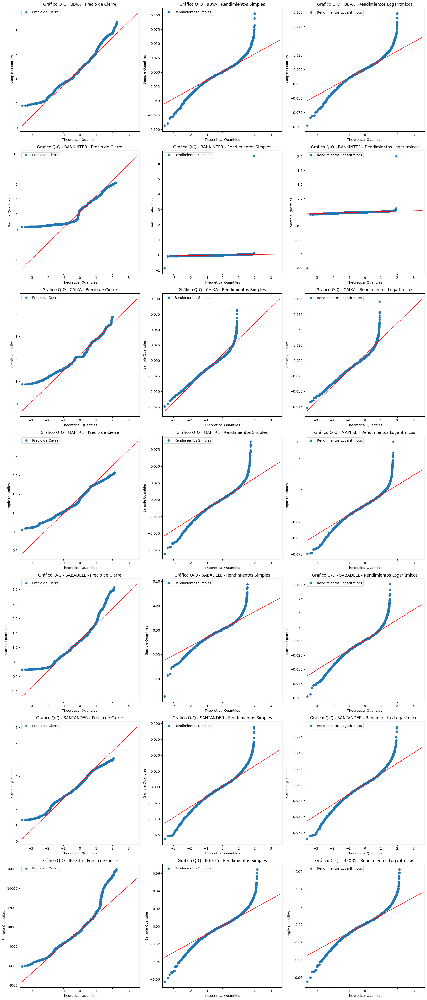

In [ ]:
# Concatenar los datos sin outilers a merged_data_cleaned
merged_data_cleaned = pd.concat([df_combined_sin_outliers_precio,
                                 df_combined_sin_outliers_simple,
                                 df_combined_sin_outliers_log], axis=1)
#df_combined_sin_outliers_log.dropna()

# Definir el número total de activos
num_activos = len(activos)

# Definir el número de columnas para los subgráficos
num_columns = 3

# Calcular el número total de filas necesarias
num_filas = num_activos

# Crear una figura y ejes para las gráficas
fig, axes = plt.subplots(num_filas, num_columns, figsize=(18, 6*num_filas))

# Iterar sobre cada activo
for i, activo in enumerate(activos):
    fila = i
    ax = axes[fila, 0]

    # Graficar el gráfico Q-Q para el precio de cierre del activo actual
    qq_plot_cierre = sm.qqplot(merged_data_cleaned[f'{activo}_Precio'], line='q', ax=ax, color='dodgerblue',
                               label='Precio de Cierre')

    ax.set_title(f'Gráfico Q-Q - {activo} - Precio de Cierre')
    ax.legend()

    ax = axes[fila, 1]

    # Graficar el gráfico Q-Q para los rendimientos simples del activo actual
    qq_plot_simple = sm.qqplot(merged_data_cleaned[f'{activo}_Rendimiento_Simple'], line='q', ax=ax, color='royalblue',
                               label='Rendimientos Simples')
    ax.set_title(f'Gráfico Q-Q - {activo} - Rendimientos Simples')
    ax.legend()

    ax = axes[fila, 2]

    # Graficar el gráfico Q-Q para los rendimientos logarítmicos del activo actual
    qq_plot_log = sm.qqplot(merged_data_cleaned[f'{activo}_Rendimiento_Log'], line='q', ax=ax, color='deepskyblue',
                            label='Rendimientos Logarítmicos')
    ax.set_title(f'Gráfico Q-Q - {activo} - Rendimientos Logarítmicos')
    ax.legend()

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()


Al eliminar los outliers, en la mayoría de los activos no se ha logrado una mejora los resultados, tanto de los rendimientos simples como logarítmicos muestran un rendimiento muy similar.

###### **Test D'Agostino**

Después de analizar los gráficos anteriores, procederemos a realizar el test de bondad de ajuste de K-cuadrado de D'Agostino.
El test de bondad de ajuste de K-cuadrado de D'Agostino se emplea para evaluar si una muestra proviene de una distribución normal. En este test, la hipótesis nula plantea que la variable sigue una distribución normal.
El valor p resultante del test nos ofrece una medida de la probabilidad de observar los datos si la hipótesis nula (los datos siguen una distribución normal) fuera verdadera. En general, si el valor p es menor que 0.05, rechazamos la hipótesis nula y concluimos que los datos no siguen una distribución normal. De lo contrario, no se puede rechazar la hipótesis nula y se concluye que los datos siguen una distribución normal.

El valor del estadístico  proporciona información sobre la discrepancia entre la distribución observada de los datos y la distribución esperada. Cuanto mayor sea el valor del estadístico, mayor será la discrepancia.

El siguiente código aplica el test de bondad de ajuste de K-cuadrado de D'Agostino a todas las columnas de los datos y muestra los resultados:

In [ ]:
import statsmodels.api as sm
from scipy import stats

for column in data.columns:
    k2, p_value = stats.normaltest(data[column])
    significance_level = 0.05
    if p_value < significance_level:
        interpretation = "Rechazar H0: No sigue una distribución normal"
    else:
        interpretation = "No se puede rechazar H0: Sigue una distribución normal"

    print(f"{column.ljust(35)} Estadístico = {k2:.4f}, p-value = {p_value:.4f}, Interpretación: {interpretation}")


BBVA                                Estadístico = 116.8263, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal
BANKINTER                           Estadístico = 1252.7662, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal
CAIXA                               Estadístico = 187.0714, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal
MAPFRE                              Estadístico = 1209.5511, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal
SABADELL                            Estadístico = 386.4127, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal
SANTANDER                           Estadístico = 179.7009, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal
IBEX35                              Estadístico = 719.2229, p-value = 0.0000, Interpretación: Rechazar H0: No sigue una distribución normal


Normalmente, se rechaza la hipótesis nula cuando el valor p es menor que 0.05. Observamos que en todas las variables analizadas, el valor p es considerablemente menor que 0.05, lo que nos lleva a rechazar la hipótesis nula de normalidad. Después de analizar la normalidad de estas variables tanto gráficamente como mediante pruebas estadísticas, llegamos a la conclusión de que no siguen una distribución normal y, por lo tanto, no son adecuadas como variables predictoras.

## **Estacionariedad**

En el trabajo se ha llevado a cabo un exhaustivo estudio de la estacionariedad y sus componentes.


### **Descomposicón aditiva y multiplicativa**

Se ha realizado y analizado para cada activo de forma individualizada su descomposición aditiva y multiplicativa. A continuación visualizaremos la descomposición del IBEX35. Debido a la extensión del estudio, los datos para cada activo financiero se encuentran cada cuaderno colab de forma individualizada.

#### **Descomposición Aditiva**
En la descomposición aditiva de una serie temporal, los componentes individuales, como la tendencia, la estacionalidad y los residuos, se suman entre sí para reconstruir la serie temporal original. Este enfoque se utiliza cuando la magnitud de la variación estacional no depende del nivel de la serie temporal.

La fórmula general para la descomposición aditiva de una serie temporal se expresa como: Serie Temporal = Tendencia + Estacionalidad + Residuos


Donde la tendencia representa la dirección general de los datos a lo largo del tiempo, la estacionalidad captura los patrones recurrentes o cíclicos en la serie que se repiten en intervalos regulares, y los residuos son las fluctuaciones aleatorias que no se pueden explicar por la tendencia o la estacionalidad.

A continuación, realizamos la descomposición de la serie temporal utilizando seasonal_decompose, una función que separa la serie en sus componentes principales: tendencia, estacionalidad y residuos.

- La tendencia refleja la dirección general de la serie a largo plazo, indicando si la serie aumenta, disminuye o se mantiene constante.
- La estacionalidad revela patrones repetitivos en los datos a intervalos regulares.
- Los residuos representan la variación no explicada por la tendencia o la estacionalidad y a menudo se consideran el componente aleatorio o el ruido en los datos.

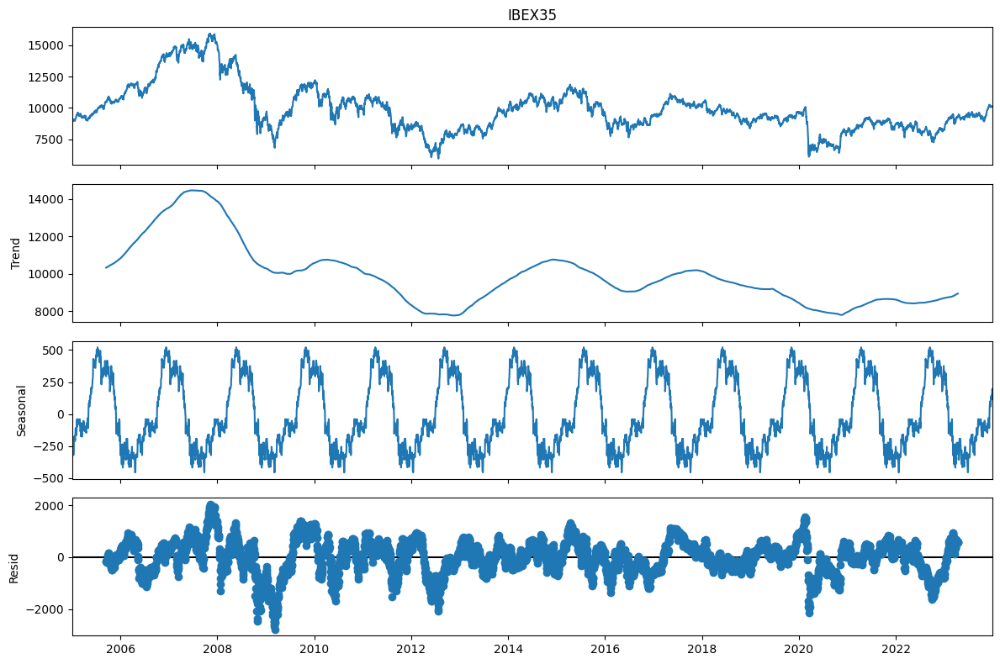

In [ ]:
plt.rcParams["figure.figsize"] = (12, 8)
# Descomposición aditiva de la serie temporal
result = seasonal_decompose(data['IBEX35'], model='additive', period=366)
# Graficar la descomposición
result.plot()
plt.show()

En el análisis resultante, la componente de tendencia exhibe un comportamiento consistente con la serie original, reflejando la dirección general de los datos a lo largo del tiempo y sugiere una relación estrecha entre ambos. La componente estacional, que representa las fluctuaciones regulares y repetitivas en la serie, evidencia una estacionalidad notable en la serie temporal con patrones claramente definidos. En cuanto a los residuos, se observa una fluctuación alrededor del valor cero, lo que implica que el modelo de descomposición ha capturado gran parte de la variabilidad de los datos. Sin embargo, se identifican algunos picos marcados en los residuos, lo que sugiere la presencia de variaciones aleatorias o irregularidades no explicadas en la serie temporal que podrían requerir una exploración adicional para su comprensión.




#### **Descomposición Multiplicativa**


En la descomposición multiplicativa de una serie temporal, los componentes se multiplican entre sí para formar la serie original. Este enfoque se prefiere cuando la magnitud de la variación estacional está directamente relacionada con el nivel de la serie temporal.

La fórmula general para la descomposición multiplicativa es: Serie Temporal = Tendencia * Estacionalidad * Residuos

La diferencia clave entre la descomposición aditiva y la descomposición multiplicativa radica en cómo se combinan los componentes para formar la serie temporal original. La descomposición aditiva es más adecuada cuando los cambios absolutos en la estacionalidad son constantes a lo largo del tiempo, mientras que la descomposición multiplicativa es más apropiada cuando los cambios porcentuales en la estacionalidad son constantes a lo largo del tiempo.

A continuación se lleva a cabo una descomposición multiplicativa de la serie temporal original del Ibex35.

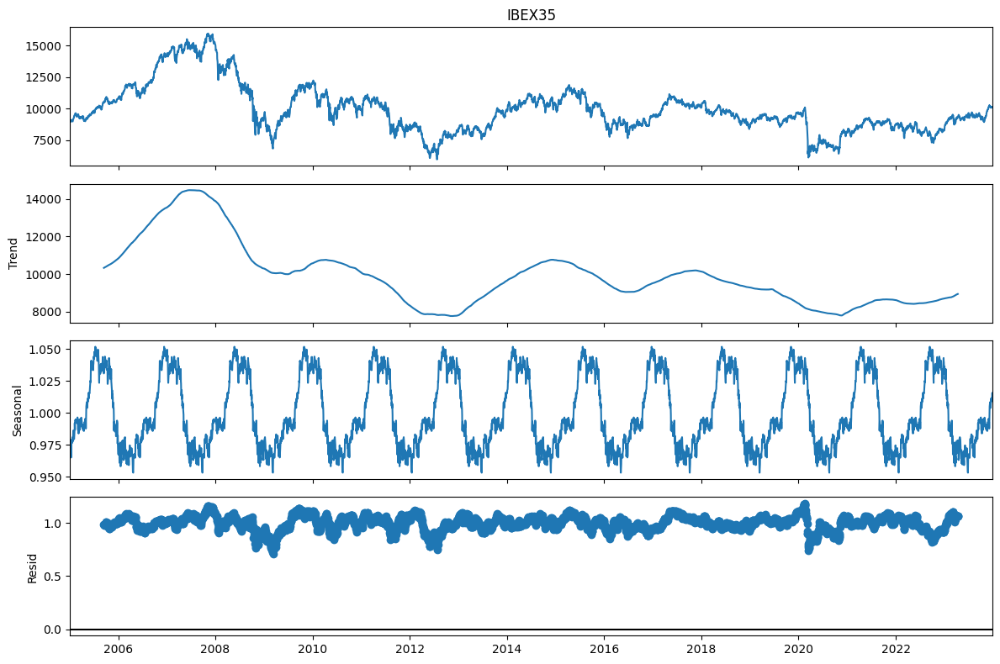

In [ ]:
plt.rcParams["figure.figsize"] = (12, 8)
# Descomposición multiplicative de la serie temporal
result = seasonal_decompose(data['IBEX35'], model='multiplicative', period=366)
# Graficar la descomposición
result.plot()
plt.show()

La descomposición de una serie temporal busca identificar patrones recurrentes en los datos.

Cuando los residuos de un modelo mantienen un valor constante alrededor de 1 y muestran una distribución uniforme en la gráfica de la estacionalidad, esto puede indicar:

- Residuos constantes: Una línea recta en la gráfica de residuos sugiere que estos mantienen un valor constante, señalando que el modelo no ha capturado completamente la variabilidad en los datos.

- Homocedasticidad: Si los residuos están uniformemente dispersos alrededor de 1 a lo largo del tiempo, esto puede indicar que la variabilidad de los errores es constante a lo largo de la serie temporal. Es deseable en muchos modelos de series temporales, ya que indica que la varianza de los errores no cambia con el tiempo.

En el análisis resultante, la tendencia sigue la dirección general de los datos, se observa una estacionalidad significativa con fluctuaciones, y los residuos oscilan alrededor de 1, revelando algunos picos pronunciados que indican la presencia de variaciones aleatorias.

### **Diferenciación de primer orden y segundo orden**

Se ha realizado y analizado para cada activo de forma individualizada su diferenciación de primer y segundo orden. Debido a la extensión del estudio, los datos para cada activo se encuentran cada cuaderno colab de forma individualizada.

### **Dickey Fuller**

La prueba de Dickey-Fuller aumentada (ADF) es una herramienta estadística vital en el análisis de series temporales que se emplea para detectar la presencia de una raíz unitaria en los datos, fue realizado por Dickey y Fuller en el año 1979. Este fenómeno puede causar resultados impredecibles y sesgados en el análisis de dichas series. La prueba establece una hipótesis nula para evaluar la influencia de una tendencia en los datos de la serie temporal. Al aceptar la hipótesis nula, se concluye que los datos no son estacionarios y al rechazarla, se considera que los datos son estacionarios. Los valores negativos de la de la prueba ADF refuerzan el rechazo de la hipótesis nula. El propósito fundamental de aplicar la prueba ADF es determinar si la serie temporal es estacionaria. En el caso de que la serie no sea estacionaria, se requiere llevar a cabo una diferenciación.

A continuación, se lleva a cabo la prueba de Dickey-Fuller para evaluar cada una de las series y comprobar si la serie es estacionaria. Si el valor p obtenido en la prueba es menor que el nivel de significancia establecido (0.05), se rechaza la hipótesis nula, lo que indica que la serie temporal es estacionaria. En caso de que el valor p sea mayor que 0.05, será necesario diferenciar la serie.

In [ ]:
from statsmodels.tsa.stattools import adfuller

# Iterar sobre cada columna en el DataFrame 'data'
for column in data.columns:
    # Serie original
    result = adfuller(data[column].dropna())
    print(f'     Valores de la Serie Original para {column}:')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    if result[1] <= 0.05:
        print("Los datos son estacionarios. Se rechaza la hipótesis nula.")
    else:
        print("Los datos no son estacionarios. No se puede rechazar la hipótesis nula.")
    print('__________________________________________')

    # Primera diferenciación
    result1 = adfuller(data[column].diff().dropna())
    print(f'     Valores de la Primera diferenciación para {column}:')
    print('ADF Statistic: %f' % result1[0])
    print('p-value: %f' % result1[1])
    if result1[1] <= 0.05:
        print("Los datos son estacionarios. Se rechaza la hipótesis nula.")
    else:
        print("Los datos no son estacionarios. No se puede rechazar la hipótesis nula.")
    print('__________________________________________')

    # Segunda diferenciación
    result2 = adfuller(data[column].diff().diff().dropna())
    print(f'     Valores de la Segunda diferenciación para {column}:')
    print('ADF Statistic: %f' % result2[0])
    print('p-value: %f' % result2[1])
    if result2[1] <= 0.05:
        print("Los datos son estacionarios. Se rechaza la hipótesis nula.")
    else:
        print("Los datos no son estacionarios. No se puede rechazar la hipótesis nula.")
    print('__________________________________________')


     Valores de la Serie Original para BBVA:
ADF Statistic: -1.839117
p-value: 0.361222
Los datos no son estacionarios. No se puede rechazar la hipótesis nula.
__________________________________________
     Valores de la Primera diferenciación para BBVA:
ADF Statistic: -49.154957
p-value: 0.000000
Los datos son estacionarios. Se rechaza la hipótesis nula.
__________________________________________
     Valores de la Segunda diferenciación para BBVA:
ADF Statistic: -21.333249
p-value: 0.000000
Los datos son estacionarios. Se rechaza la hipótesis nula.
__________________________________________
     Valores de la Serie Original para BANKINTER:
ADF Statistic: -0.727430
p-value: 0.839516
Los datos no son estacionarios. No se puede rechazar la hipótesis nula.
__________________________________________
     Valores de la Primera diferenciación para BANKINTER:
ADF Statistic: -36.421646
p-value: 0.000000
Los datos son estacionarios. Se rechaza la hipótesis nula.
______________________________

## **Caracteristica de los datos**



A continuación, utilizamos un gráfico de dispersión (ScatterPlot) para verificar la relación entre todas las variables. La función pandas.plotting.scatter_matrix muestra una matriz de gráficos de dispersión cruzando las características cuantitativas del dataframe indicado. Observamos una relación entre los datos de las características de Sabadell y Santander con el Ibex 35. Es esencial profundizar en su estudio para identificar su relevancia y determinar si estas variables son buenas candidatas como predictoras.


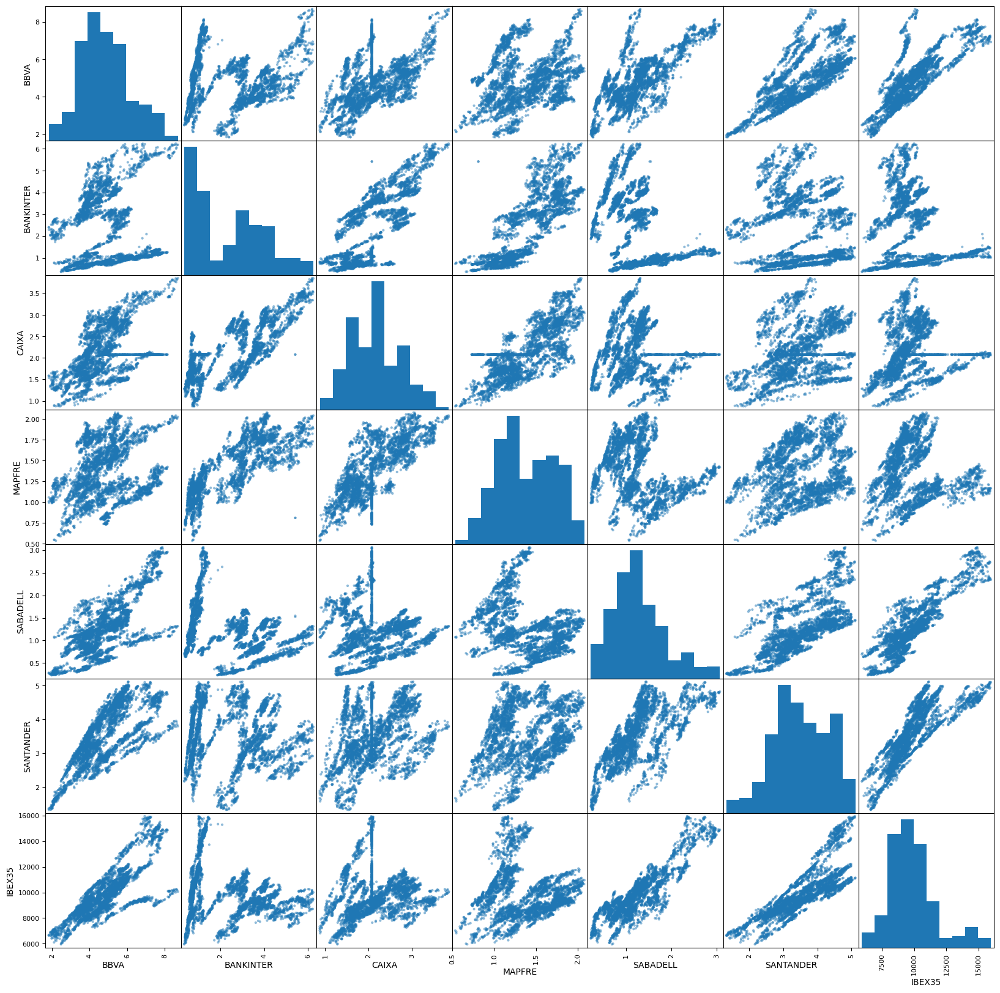

In [ ]:
#0.2.3 Scatterplot matrix
from pandas.plotting import scatter_matrix
scatter_matrix(data, figsize=(20, 20))
plt.show()

#### **Matriz de correlación**

La correlación es una medida estadística que describe la relación entre dos variables.

La fórmula para calcular el coeficiente de correlación de Pearson ($\rho$) entre dos variables X e Y se expresa como:

$$\rho = \frac{\sum{(X_i - \bar{X})(Y_i - \bar{Y})}}{\sqrt{\sum{(X_i - \bar{X})^2} \sum{(Y_i - \bar{Y})^2}}}$$

Donde:

* $X_i$ y $Y_i$ son los valores individuales de las variables X e Y.
* $\bar{X}$ y $\bar{Y}$son las medias (promedios) de las variables X e Y, respectivamente.

Esta fórmula calcula el coeficiente de correlación de Pearson y se basa en la covarianza entre X e Y y sus respectivas desviaciones estándar.

La correlación se utiliza para entender cómo se mueven dos activos o variables en relación entre sí. Los niveles de correlación pueden variar entre -1 y 1, y se interpretan de la siguiente manera:

* **Correlación Positiva** ($\rho > 0$): Cuando dos variables tienen una correlación positiva, significa que tienden a moverse en la misma dirección. Si una variable aumenta, la otra también tiende a aumentar. El valor 1 representa una correlación perfecta positiva, lo que significa que dos variables están perfectamente relacionadas y siempre se mueven juntas en la misma dirección.

* **Correlación Negativa** ($\rho < 0$): Cuando dos variables tienen una correlación negativa, significa que tienden a moverse en direcciones opuestas. Si una variable aumenta, la otra tiende a disminuir y viceversa. El valor -1 representa una correlación perfecta negativa, lo que significa que dos variables están perfectamente relacionadas pero siempre se mueven en direcciones opuestas.

* **Correlación Nula** ($\rho = 0$): Cuando la correlación entre dos variables es cero o cercana a cero, significa que no hay una relación lineal aparente entre ellas. En otras palabras, los movimientos en una variable no están relacionados con los movimientos en la otra variable.

Se realizó un análisis exhaustivo de correlación con el objetivo de comprender la distribución de las variables en el conjunto de datos. La correlación, una medida estadística que describe la relación entre dos variables, se calculó utilizando el coeficiente de correlación de Pearson. A continuación, se presentan las correlaciones del conjunto de datos en forma de matriz.

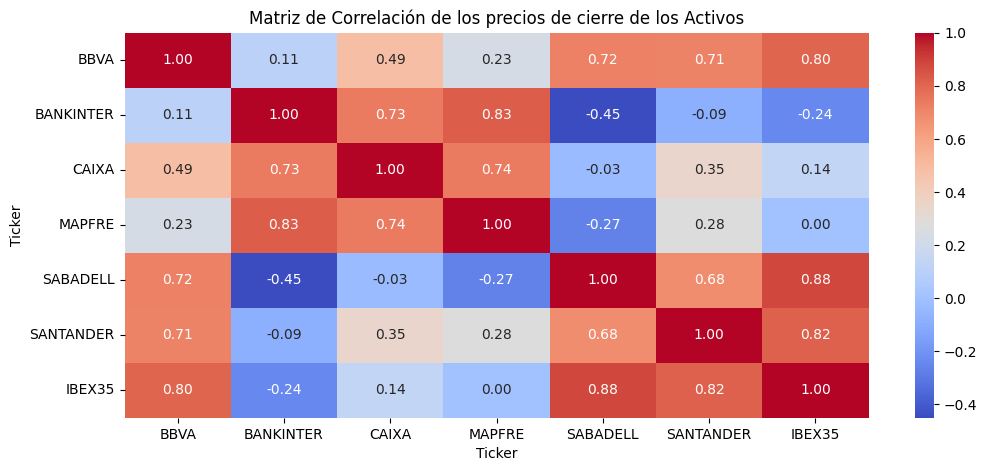

In [ ]:
# Calcular la matriz de correlación de los activos
correlation_matrix = data.corr()
# El método .corr() en un DataFrame de Pandas se utiliza para calcular la correlación entre las columnas numéricas
# del DataFrame. La correlación es una medida estadística que indica la relación lineal entre dos variables.
# El valor de la correlación varía entre -1 y 1, donde -1 indica una correlación negativa perfecta, 0 indica que no hay correlación y 1 indica una correlación positiva perfecta.

# Visualizar la matriz de correlación
plt.figure(figsize=(12, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlación de los precios de cierre de los Activos')
plt.show()

In [ ]:
# Imprimir la matriz de correlación
print("\nMatriz de Correlación de los precios de cierre de los Activos:")
print(correlation_matrix)


Matriz de Correlación de los precios de cierre de los Activos:
Ticker         BBVA  BANKINTER     CAIXA    MAPFRE  SABADELL  SANTANDER  \
Ticker                                                                    
BBVA       1.000000   0.105597  0.489524  0.230101  0.719788   0.712626   
BANKINTER  0.105597   1.000000  0.733959  0.826930 -0.450115  -0.090136   
CAIXA      0.489524   0.733959  1.000000  0.735528 -0.032806   0.346739   
MAPFRE     0.230101   0.826930  0.735528  1.000000 -0.265415   0.275515   
SABADELL   0.719788  -0.450115 -0.032806 -0.265415  1.000000   0.679551   
SANTANDER  0.712626  -0.090136  0.346739  0.275515  0.679551   1.000000   
IBEX35     0.802351  -0.244193  0.139668  0.000495  0.883845   0.815872   

Ticker       IBEX35  
Ticker               
BBVA       0.802351  
BANKINTER -0.244193  
CAIXA      0.139668  
MAPFRE     0.000495  
SABADELL   0.883845  
SANTANDER  0.815872  
IBEX35     1.000000  


**Revisión con heatmap de los activos sin el IBEX35.**


Un heatmap es una representación gráfica de datos que utiliza colores para mostrar la relación entre diferentes valores en una tabla de datos. Este tipo de gráfico es útil para visualizar la matriz de correlación entre variables, donde cada celda representa la correlación entre dos variables y se colorea según su valor, lo que permite identificar patrones y relaciones entre las variables de forma rápida y efectiva.

[Text(0.5, 1.0, 'Correlaciones del DataSet final\n')]

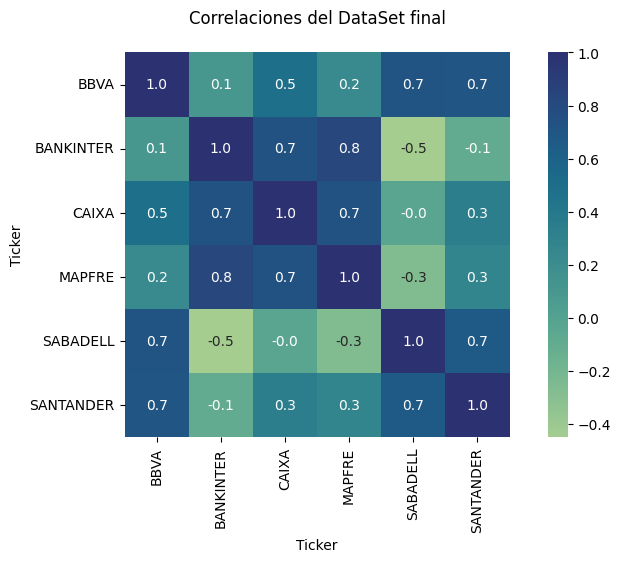

In [ ]:
import seaborn as sns
plt.figure(figsize = (10,5))
sns.heatmap(data_whitout_ibex.corr(), # Calcular la matriz de correlación de los activos
            square=True, annot=True, fmt=".1f", cmap="crest").set(title = 'Correlaciones del DataSet final\n')

Aquí podemos observar en la zona central superior izquierda cómo las variables de Bankinter, Caixa y Mapfre están altamente correlacionadas entre sí. Esta alta correlación indica que estas variables no son buenos predictores.

Tras revisar las correlaciones, se observó que algunas características están correlacionadas entre sí. Se llevó a cabo un estudio detallado para identificar las correlaciones más fuertes con respecto a la variable objetivo, en nuestro caso, el IBEX35. Estas correlaciones indican el grado de asociación entre los atributos predictores y el valor a predecir.
Los resultados revelaron que en algunas de las características existe correlación entre las variables y la variable objetivo. Se observó cierta correlación con el IBEX35 en variables como Banco Santander, Sabadell y BBVA, que presentaron un mayor índice de correlación. Tras un análisis más profundo, se concluyó que estas características (Santander, Sabadell y BBVA) están más correlacionadas con la variable objetivo. En resumen, los casos totales muestran cierto nivel de correlación con respecto a las características del conjunto de datos.


#### **Transposición**

##### **Análisis de componentes PCA**

La Análisis de Componentes Principales (PCA, por sus siglas en inglés) se emplea para determinar la cantidad de componentes principales que explican la mayor parte de la varianza en un conjunto de datos.

Se realizarán dos análisis de Componentes Principales (PCA) como parte del estudio. El primero visualizará las observaciones transformadas, mientras que el segundo analizará el porcentaje de varianza explicada y las variables más importantes en cada componente principal. Esto proporcionará una comprensión completa de la distribución de los datos y las relaciones entre las variables.


###### **Visualización de Observaciones Transformadas**

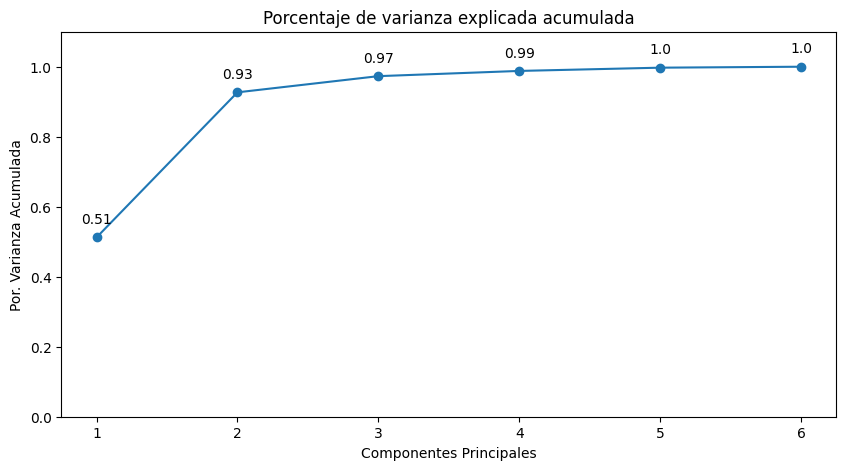

Componente Principal 1: ['BBVA', 'BANKINTER', 'CAIXA']
Componente Principal 2: ['BBVA', 'BANKINTER', 'SABADELL', 'SANTANDER']
Componente Principal 3: ['BBVA', 'MAPFRE', 'SANTANDER']
Componente Principal 4: ['BANKINTER', 'CAIXA', 'SABADELL']
Componente Principal 5: ['BBVA', 'CAIXA', 'SABADELL']
Componente Principal 6: ['MAPFRE', 'SANTANDER']


In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Aplicar PCA
pca_pipe = make_pipeline(PCA())
pca_pipe.fit(data_whitout_ibex)
modelo_pca = pca_pipe.named_steps['pca']
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum()

# Obtener los nombres de los activos
nombres_activos = data_whitout_ibex.columns

# Crear una lista para almacenar los nombres de los activos asociados a cada componente principal
activos_por_componente = []

# Iterar sobre los componentes principales
for i, componente in enumerate(modelo_pca.components_):
    # Obtener los nombres de los activos con mayor contribución a este componente
    nombres_activos_componente = [nombres_activos[j] for j, valor in enumerate(componente) if abs(valor) > 0.2]
    # Ajusta el umbral según sea necesario

    # Agregar los nombres de los activos asociados a este componente a la lista
    activos_por_componente.append(nombres_activos_componente)


# Gráfico de Porcentaje de Varianza Explicada Acumulada
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
ax.plot(np.arange(len(data_whitout_ibex.columns)) + 1, prop_varianza_acum, marker='o')

for x, y in zip(np.arange(len(data_whitout_ibex.columns)) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(label, (x, y), textcoords="offset points", xytext=(0, 10), ha='center')

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componentes Principales')
ax.set_ylabel('Por. Varianza Acumulada')

plt.show()

# Mostrar los nombres de los activos asociados a cada componente principal
for i, nombres in enumerate(activos_por_componente):
    print(f"Componente Principal {i+1}: {nombres}")


 En este caso, se observa que con 4 componentes principales se logra explicar el 99% de la varianza acumulada, mientras que con 5 componentes se alcanza el 100%.

###### **Análisis de Varianza y Variables Relevantes**

A continuación se realiza un análisis de varianza explicada y de las variables relevantes en componentes principales que consiste en reducir la dimensionalidad del conjunto de datos y se visualiza las observaciones en un gráfico de dispersión bidimensional.






In [ ]:
from sklearn import preprocessing
from numpy import corrcoef, transpose, arange
# Copiar el DataFrame original
df_feat_original = data.copy()
# Eliminar las columnas especificadas
delete_features = ['IBEX35']
df_feat_original = df_feat_original.drop(delete_features, axis=1)
#print(df_feat_original.columns)
names_original = df_feat_original.columns
#print(names_original)
df_feat_original = transpose(df_feat_original)

Componentes lineales:
 [[ 0.01408409  0.01405784  0.01403777 ...  0.01299631  0.01298675
   0.01298981]
 [-0.01115168 -0.01124275 -0.01116895 ...  0.01278652  0.01289513
   0.01282152]
 [-0.01688335 -0.01669379 -0.01717369 ... -0.02493774 -0.02496205
  -0.02536409]]

Ratio de variabilidad:  [0.77961036 0.18846528 0.01966668] 



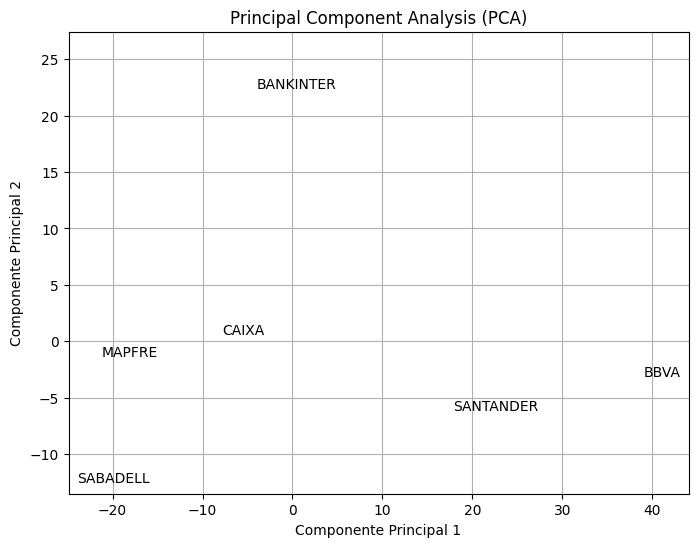

In [ ]:
from sklearn import preprocessing
import matplotlib.pyplot as plt

# 1. Normalization of the data
min_max_scaler = preprocessing.MinMaxScaler()
features_norm = min_max_scaler.fit_transform(df_feat_original)

# 1.2. Principal Component Analysis
from sklearn.decomposition import PCA
estimator = PCA(n_components=3)
X_pca = estimator.fit_transform(features_norm)
print("Componentes lineales:\n", estimator.components_)
print("\nRatio de variabilidad: ", estimator.explained_variance_ratio_, "\n")

# Crear una figura y ejes
fig, ax = plt.subplots(figsize=(8, 6))

# Iterar sobre las componentes principales y añadir etiquetas
for i in range(len(X_pca)):
    plt.text(X_pca[i][0], X_pca[i][1], names_original[i])

# Ajustar los límites de los ejes x e y
plt.xlim(X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 5)
plt.ylim(X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 5)

# Agregar título y nombres de los ejes
plt.title('Principal Component Analysis (PCA)')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')

# Agregar una leyenda si es necesario
# plt.legend()

# Mostrar la gráfica
plt.grid(True)
plt.show()


Los resultados del análisis de componentes principales ofrecen las siguientes observaciones:

- Bankinter: Este activo se encuentra muy alejado del resto, lo que indica que puede tener una influencia significativa y puede exhibir un comportamiento único en el conjunto de datos en términos de variabilidad.

- Mapfre y Caixa: Ambos activos están relativamente juntos y se encuentran cerca del origen (0,0). Esto indica que comparten similitudes en su comportamiento en el conjunto de datos y tienen una variabilidad comparativamente baja en relación con otros activos.

- Sabadell: Este activo está alejado, lo que sugiere que puede tener un comportamiento diferente pero aún exhibir cierta variabilidad en comparación con Mapfre y Caixa. Sabadell tiene menos influencia individual en la varianza total.

- Santander destaca en el análisis PCA al mostrar una relación fuerte con otros activos en los primeros dos componentes principales. Aunque su impacto individual en la varianza total es menor que otros activos, sugiere una fuerte correlación con los movimientos generales del conjunto de datos.

- BBVA muestra una posición alejada del origen en la dirección positiva del primer componente principal, lo que sugiere una alta variabilidad en comparación con otros activos. Esta discrepancia puede indicar que BBVA está influenciado por factores únicos o presenta un comportamiento más volátil en relación con los otros activos.


##### **Matriz de correlación**

El siguiente mapa de calor transpuesto ha sido muy útil para identificar de forma visual las relaciones de los diferentes conjuntos de datos que hemos generado.



Matriz de correlación:
Ticker         BBVA  BANKINTER     CAIXA    MAPFRE  SABADELL  SANTANDER
Ticker                                                                 
BBVA       1.000000   0.105597  0.489524  0.230101  0.719788   0.712626
BANKINTER  0.105597   1.000000  0.733959  0.826930 -0.450115  -0.090136
CAIXA      0.489524   0.733959  1.000000  0.735528 -0.032806   0.346739
MAPFRE     0.230101   0.826930  0.735528  1.000000 -0.265415   0.275515
SABADELL   0.719788  -0.450115 -0.032806 -0.265415  1.000000   0.679551
SANTANDER  0.712626  -0.090136  0.346739  0.275515  0.679551   1.000000


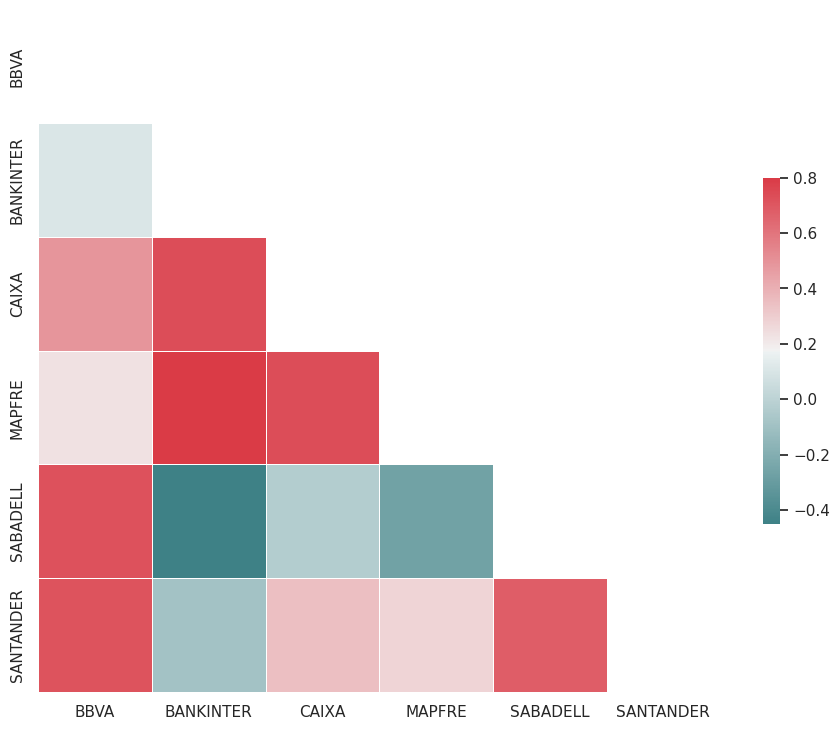

In [ ]:
import numpy as np
import pandas as pd
import io
from google.colab import files
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
from numpy import corrcoef, transpose, arange
from pylab import pcolor, show, colorbar, xticks, yticks

df_feat_original = transpose(data_whitout_ibex)
names_original =  df_feat_original.index
#https://docs.scipy.org/doc/numpy/reference/generated/numpy.corrcoef.html
R = corrcoef(df_feat_original)
# http://stanford.edu/~mwaskom/software/seaborn/examples/many_pairwise_correlations.html
# Generate a mask for the upper triangle
sns.set(style="white")
mask = np.zeros_like(R, dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(200, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(R, mask=mask, cmap=cmap, vmax=.8,
            square=True, xticklabels=names_original, yticklabels=names_original,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
# Imprimir la matriz de correlación en formato de texto
print("Matriz de correlación:")
print(pd.DataFrame(R, index=names_original, columns=names_original))


Las conclusiones del estudio del clustering jerárquico son las siguientes:

- BBVA muestra correlaciones moderadas con CAIXA y fuertes con SANTANDER, sugiriendo movimientos similares en el mercado.
- BANKINTER presenta una correlación significativa con CAIXA y MAPFRE, indicando una relación positiva entre estos activos.
- MAPFRE muestra una correlación alta con BANKINTER y CAIXA, lo que sugiere movimientos conjuntos en el mercado.
- SABADELL muestra correlaciones negativas con BANKINTER, sugiriendo movimientos opuestos en el mercado y también presenta una correlación moderada con MAPFRE, indicando una relación menos marcada entre estos activos.
- SANTANDER muestra correlaciones fuertes con BBVA y SABADELL, indicando una posible relación entre estos activos en términos de movimientos de precios.

Se ha detectado que SABADELL muestra una correlación alta tanto con BBVA como con SANTANDER. Por otro lado, BBVA y SANTANDER también muestran una correlación significativa entre sí. Esto sugiere que estos activos podrían tener movimientos de precios similares en el mercado, lo que podría indicar una cierta similitud en sus comportamientos y la posibilidad de que estén influenciados por factores comunes en el mercado financiero

#### **Normalización de los datos**

Durante el análisis exploratorio del conjunto de datos, se ha identificado que las variables muestran una variabilidad en sus rangos, lo que podría influir en el desempeño de las técnicas de modelado posteriormente. Por lo tanto, se procederá con la normalización de los datos. Este proceso es esencial para estandarizar las escalas de las variables, asegurando que todas ellas contribuyan de manera equitativa al modelo final. Al normalizar los datos, nos aseguramos de que las técnicas de aprendizaje automático no se vean sesgadas por las diferencias en los rangos de las variables, permitiendo así una interpretación más precisa de su verdadero impacto en el conjunto de datos.

In [ ]:
# Conjunto seleccionado de características
selected_features = ['BBVA','BANKINTER','CAIXA', 'MAPFRE', 'SABADELL', 'SANTANDER']
# selected_features = ['BBVA','CAIXA', 'MAPFRE', 'SABADELL', 'SANTANDER']
# selected_features = ['BBVA','SABADELL', 'SANTANDER', 'MAPFRE']
# selected_features = ['BBVA','SABADELL', 'SANTANDER']
# selected_features = ['BBVA', 'SANTANDER']

In [ ]:
# Normalización con MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_data_ibex = scaler.fit_transform(data_whitout_ibex[selected_features])
X_train = scaler.fit_transform(train_data[selected_features])
X_test = scaler.transform(test_data[selected_features])

#### **Clustering Jerárquico**

El Clustering Jerárquico es una técnica de agrupamiento que organiza los datos en una estructura jerárquica de clusters anidados. Esta técnica no requiere que se especifique el número de clusters de antemano, lo que la hace especialmente útil en la exploración de conjuntos de datos donde la estructura de agrupamiento es desconocida. La herramienta utilizada para visualizar los resultados del clustering jerárquico es el dendrograma que es un diagrama de árbol que muestra la relación de similitud entre los elementos del conjunto de datos. Cada hoja del dendrograma representa una observación, y las uniones de las ramas indican la similitud entre las observaciones agrupadas. El dendrograma permite visualizar de manera intuitiva cómo se agrupan los datos a diferentes niveles de similitud y puede ayudar en la interpretación y comprensión de la estructura de agrupamiento en los datos. A continuación vamos a revisar el dendograma.

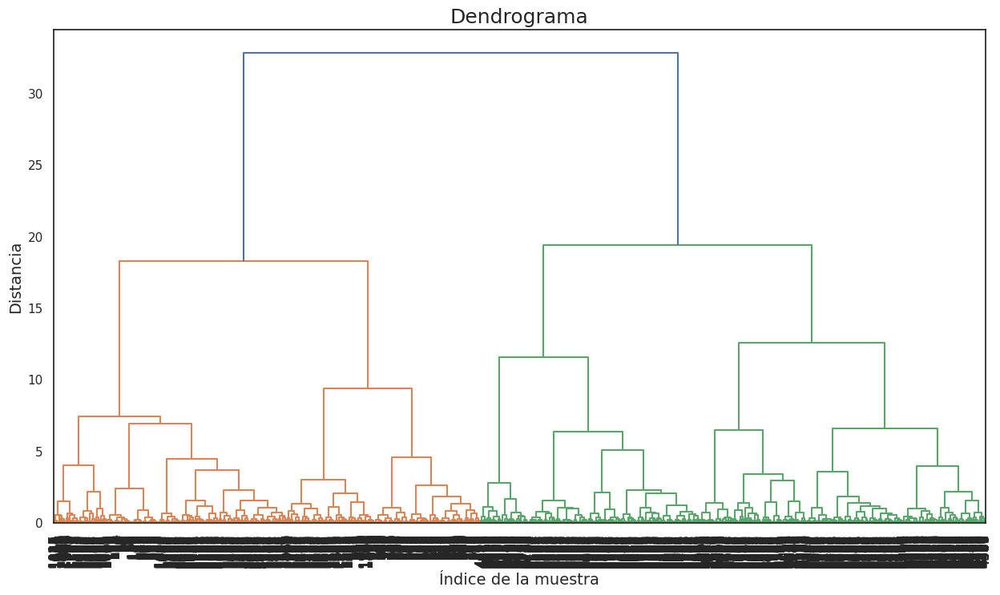

In [ ]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Calcular el dendrograma
Z = linkage(X_data_ibex, method='ward', metric='euclidean')

# Configurar la figura y el dendrograma
plt.figure(figsize=(15, 8))  # Ajusta el tamaño de la figura según sea necesario
plt.title('Dendrograma', fontsize=18)  # Ajusta el tamaño del título
plt.xlabel('Índice de la muestra', fontsize=14)  # Ajusta el tamaño del texto del eje x
plt.ylabel('Distancia', fontsize=14)  # Ajusta el tamaño del texto del eje y
dendrogram(
    Z,
    leaf_rotation=90.,  # Rota las etiquetas de las hojas para una mejor legibilidad
    leaf_font_size=12.,  # Ajusta el tamaño de la fuente de las etiquetas de las hojas
)
plt.show()


El coeficiente de correlación cofenético es una medida de la calidad de un agrupamiento jerárquico, que cuantifica qué tan bien las distancias originales entre las muestras se conservan en el dendrograma. Un valor cercano a 1 indica una buena calidad de agrupamiento, mientras que valores más bajos sugieren que el agrupamiento no captura bien las similitudes entre las muestras.

In [ ]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

# Calcular la matriz de distancias usando los datos normalizados
distances = pdist(X_data_ibex)

# Calcular el coeficiente de correlación cofenético
c, coph_dists = cophenet(Z, distances)

print("Coeficiente de correlación cofenético:", c)
# Resultados
# selected_features = ['BBVA','BANKINTER','CAIXA', 'MAPFRE', 'SABADELL', 'SANTANDER'] Coeficiente de correlación cofenético: 0.6718598509577589
# selected_features = ['BBVA','CAIXA', 'MAPFRE', 'SABADELL', 'SANTANDER'] Coeficiente de correlación cofenético: 0.6279167896034926
# selected_features = ['BBVA','SABADELL', 'SANTANDER', 'MAPFRE',] Coeficiente de correlación cofenético: Coeficiente de correlación cofenético: 0.6099037494112519
# selected_features = ['BBVA','SABADELL', 'SANTANDER'] Coeficiente de correlación cofenético: 0.5722525232345258
# selected_features = ['BBVA', 'SANTANDER'] Coeficiente de correlación cofenético: 0.644175587611709

Coeficiente de correlación cofenético: 0.671859844953966


Con todas las características seleccionadas, que incluyen BBVA, BANKINTER, CAIXA, MAPFRE, SABADELL y SANTANDER, el coeficiente de correlación es moderado. Esto sugiere una correlación razonable entre las distancias originales y las del agrupamiento jerárquico.

Al considerar solo las características BBVA y SANTANDER, el coeficiente de correlación muestra una disminución comparativamente menor en relación con la eliminación de otras características. Esto sugiere que BBVA y SANTANDER pueden estar altamente correlacionados entre sí y denotan su importancia en la estructura del agrupamiento jerárquico.

A continuación vamos a revisar  nuestro dendograma. Podemos observar los clusters y realizamos el corte en el dendograma.

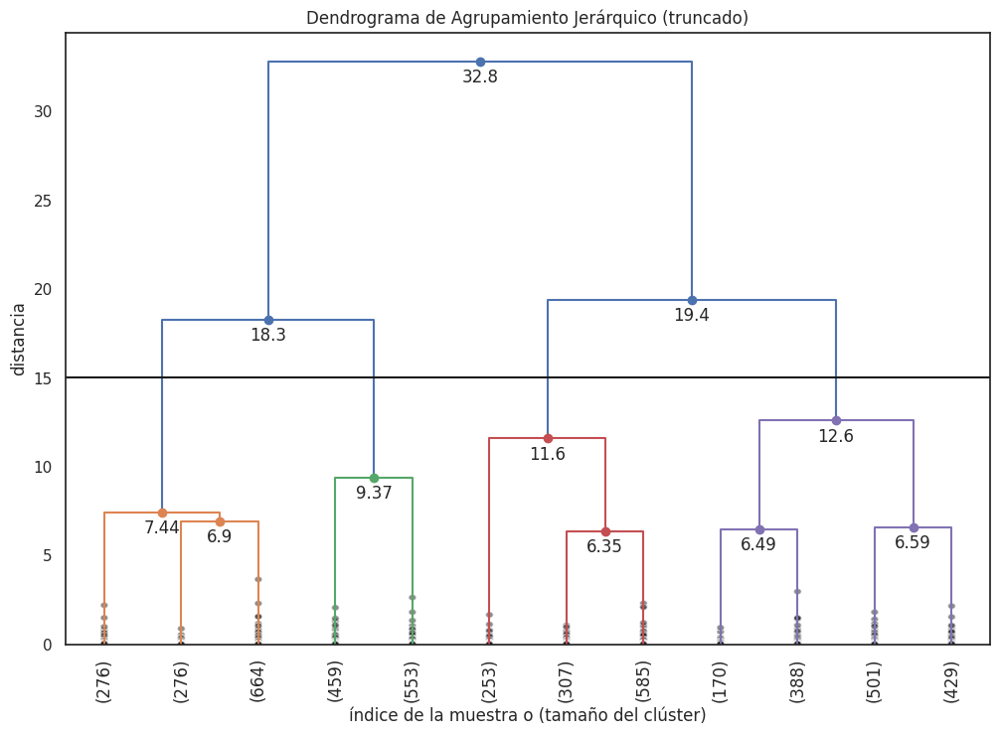

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy
import matplotlib.pyplot as plt

def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Dendrograma de Agrupamiento Jerárquico (truncado)')
        plt.xlabel('índice de la muestra o (tamaño del clúster)')
        plt.ylabel('distancia')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

# Definir la distancia y método de enlace
Z = linkage(X_data_ibex, method='ward', metric='euclidean')

# Definir el valor máximo para el corte del dendrograma
d_max = 15

# Visualizar el dendrograma con la función personalizada
fancy_dendrogram(
    Z,
    truncate_mode='lastp',
    p=12,
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=1,
    max_d=d_max,  # trazar una línea horizontal de corte
)
plt.show()


Con el corte tenemos 4 clusters. Por lo que podemos indicar que la data está agrupándose en 4 grupos

#### **DBSCAN**


DBSCAN es un algoritmo de clustering que agrupa datos basándose en su densidad. A diferencia de otros métodos, no necesita especificar el número de clusters de antemano, lo que lo hace útil en conjuntos de datos donde no se conoce la estructura subyacente. Utiliza dos parámetros principales: el radio de búsqueda (epsilon) y el número mínimo de puntos dentro de ese radio (minPts). DBSCAN es capaz de identificar clusters de formas arbitrarias y es robusto frente al ruido en los datos. En esta sección, aplicaremos DBSCAN a nuestros datos y analizaremos los clusters identificados.

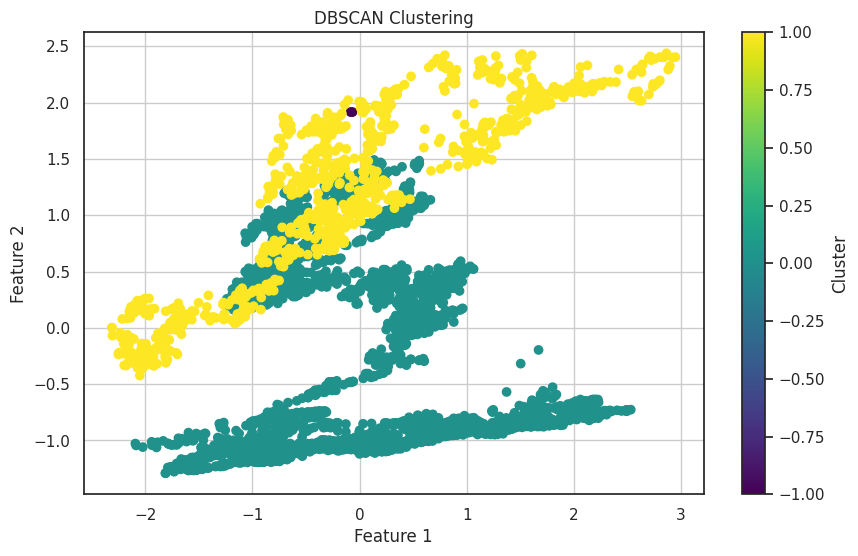

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Normalizar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_whitout_ibex)
#X_scaled = scaler.fit_transform(data_whitout_ibex[['BBVA','SABADELL', 'SANTANDER']])


# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
cluster_labels = dbscan.fit_predict(X_scaled)

# Visualizar los resultados
plt.figure(figsize=(10, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=cluster_labels, cmap='viridis')
plt.title('DBSCAN Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()


A continuación se aplica el algoritmo DBSCAN para agrupar los datos en clusters, identificando también los valores atípicos en el conjunto de datos y la identificación de patrones y anomalías en conjuntos de datos.


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import numpy as np

# Copia del conjunto de datos original
train_copy = data.copy()

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(train_copy)

# Exploración de diferentes valores de eps
min_samples = 2
for eps in np.arange(0.1, 2, 0.1):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(X_scaled)
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    n_outliers = list(clusters).count(-1)
    print(f"Eps: {eps:.2f} - Min Samples: {min_samples} - Clusters: {n_clusters} - Outliers: {n_outliers}")

# Ajuste de eps y min_samples
eps = 0.4  # Ajustar según los resultados de la exploración
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
clusters = dbscan.fit_predict(X_scaled)

# Guardar los labels en una variable para posterior análisis
labels = dbscan.labels_

# Agregar la columna 'dbscan_group' al conjunto de datos
train_copy['dbscan_group'] = labels

# Mostrar información de los outliers
outliers = train_copy[train_copy['dbscan_group'] == -1]
print("Outliers:")
print(outliers)


Eps: 0.10 - Min Samples: 2 - Clusters: 791 - Outliers: 1167
Eps: 0.20 - Min Samples: 2 - Clusters: 169 - Outliers: 81
Eps: 0.30 - Min Samples: 2 - Clusters: 39 - Outliers: 7
Eps: 0.40 - Min Samples: 2 - Clusters: 11 - Outliers: 0
Eps: 0.50 - Min Samples: 2 - Clusters: 3 - Outliers: 0
Eps: 0.60 - Min Samples: 2 - Clusters: 3 - Outliers: 0
Eps: 0.70 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 0.80 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 0.90 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.00 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.10 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.20 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.30 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.40 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.50 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.60 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.70 - Min Samples: 2 - Clusters: 2 - Outliers: 0
Eps: 1.80 - Min Samples: 2 - Clusters: 2 - Outliers: 0


#### **K-Means**

K-Means es un algoritmo de agrupamiento ampliamente utilizado en el campo del aprendizaje automático y la minería de datos. Su objetivo es dividir un conjunto de datos en un número predefinido de grupos (o clústeres) basados en la similitud entre las observaciones. El algoritmo selecciona centroides aleatorios y asigna cada observación al centroide más cercano, actualizando iterativamente los centroides hasta converger. Aunque eficiente, el K-Means puede ser sensible a la inicialización de centroides y a la elección de parámetros.

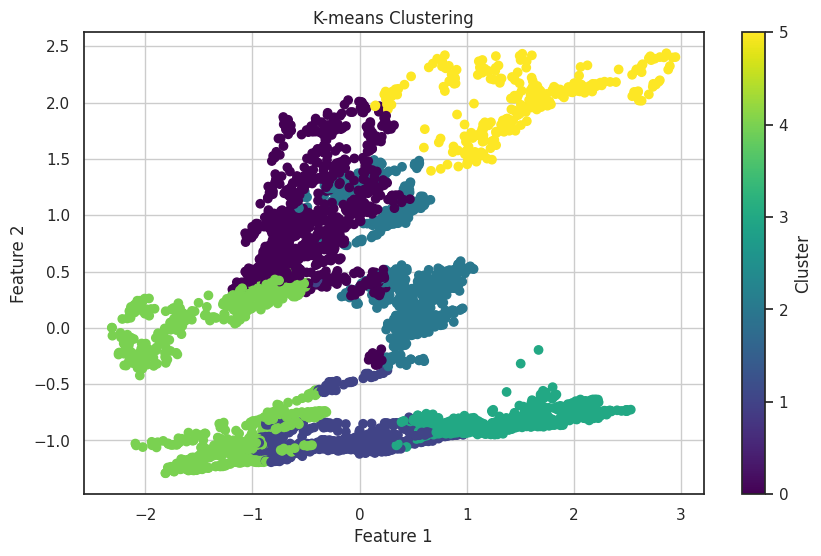

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Normalizar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_whitout_ibex)

# Especificar el número de clusters
n_clusters = 6

# Aplicar K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# Visualizar los resultados
plt.figure(figsize=(10, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=cluster_labels, cmap='viridis')
plt.title('K-means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()


En este código, vamos a explorar la técnica de K-means para determinar el número óptimo de clusters en un conjunto de datos. Utilizaremos la métrica de distorsión y el método del codo para identificar el número óptimo de clusters. La métrica de distorsión mide cuán dispersos están los puntos dentro de cada cluster, mientras que el método del codo nos ayuda a identificar el punto en el cual la adición de más clusters ya no mejora significativamente la distorsión. Vamos a representar gráficamente la distorsión en función del número de clusters y marcar el "codo" en el gráfico para identificar el número óptimo de clusters.

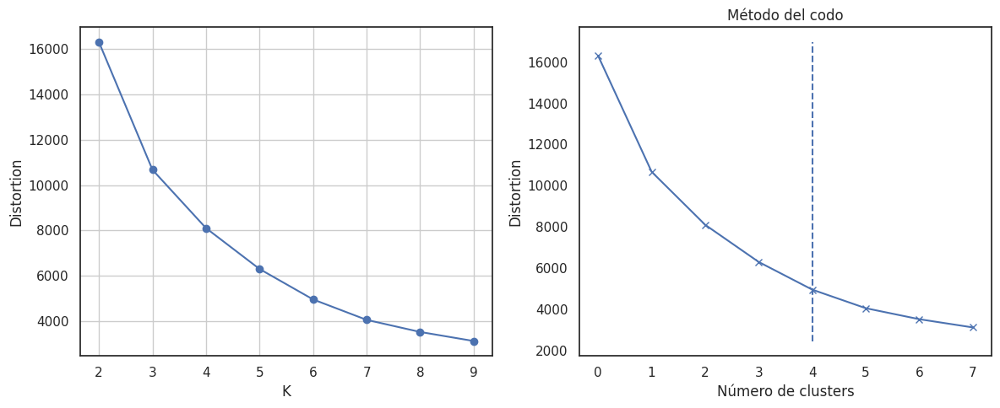

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics
from kneed import KneeLocator

distortions = []
silhouettes = []

# Crear subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Calcular distorsiones y siluetas
for i in range(2, 10):
    km = KMeans(i, init='random', n_init=10, max_iter=300, tol=1e-4, random_state=42)
    clustering = km.fit_predict(data_whitout_ibex)
    distortions.append(km.inertia_)
    silhouettes.append(metrics.silhouette_score(data_whitout_ibex, clustering))

# Gráfico de distorsiones
axs[0].plot(range(2,10), distortions, marker='o')
axs[0].set_xticks(range(2, 10))
axs[0].set_xlabel('K')
axs[0].set_ylabel('Distortion')
axs[0].grid(True)

# Gráfico de codo
kneedle = KneeLocator(range(2, 10), distortions[:8], curve="convex", direction="decreasing")
elbow_point = kneedle.elbow
axs[1].plot(distortions, 'bx-')
axs[1].vlines(elbow_point, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
axs[1].set_xlabel('Número de clusters')
axs[1].set_ylabel('Distortion')
axs[1].set_title('Método del codo')

# Mostrar gráficos
plt.tight_layout()
plt.show()


El valor "Codo: 4" indica que el método del codo sugiere que el número óptimo de clústeres para el conjunto de datos es 4. Esto se determina observando el punto en la curva de distorsión donde se produce un cambio significativo en la pendiente.

### **Random Forest**

El código analiza la importancia de las características financieras en la predicción del IBEX35 utilizando Random Forest. Se entrena un modelo con datos históricos de varias compañías financieras, excluyendo el IBEX35. Luego se determina la importancia de cada característica en la predicción del índice bursátil.

Importancia de las Características:
1. SABADELL: 0.6305019172169423
2. SANTANDER: 0.2668522109137013
3. BBVA: 0.0645903997727956
4. MAPFRE: 0.016706629439556378
5. BANKINTER: 0.011057170626533505
6. CAIXA: 0.010291672030471053


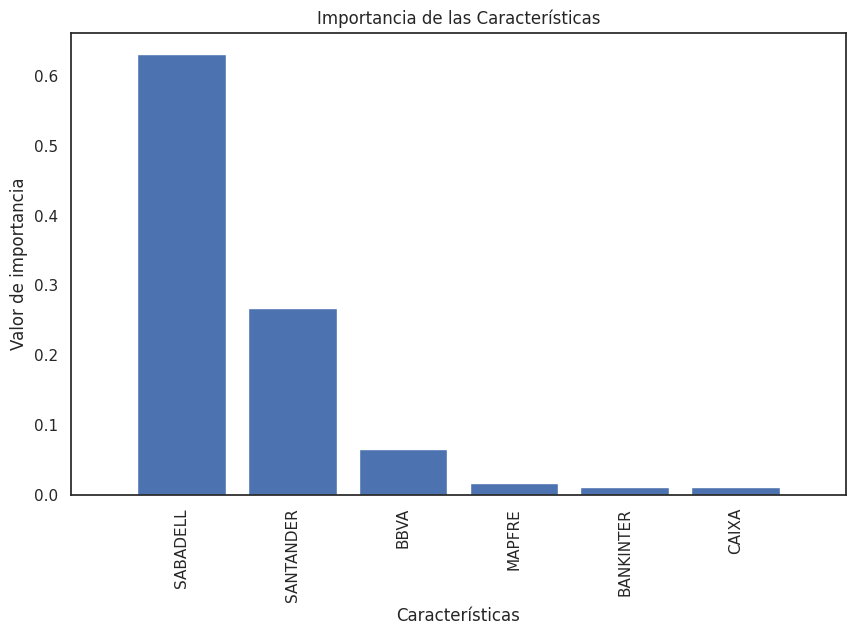

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Separar las características (X) y la variable objetivo (y)
X = data.drop('IBEX35', axis=1)
y = data['IBEX35']

# Crear un clasificador de bosque aleatorio
clf = RandomForestRegressor(n_estimators=100, random_state=42)

# Entrenar el clasificador con tus datos
clf.fit(X, y)

# Obtener la importancia de las características
importances = clf.feature_importances_

# Obtener los nombres de las características
feature_names = X.columns

# Ordenar las características por importancia descendente
indices = np.argsort(importances)[::-1]

# Imprimir la importancia de las características en texto
print("Importancia de las Características:")
for i, idx in enumerate(indices):
    print(f"{i+1}. {feature_names[idx]}: {importances[idx]}")

# Visualizar la importancia de las características
plt.figure(figsize=(10, 6))
plt.title("Importancia de las Características")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), feature_names[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.xlabel("Características")
plt.ylabel("Valor de importancia")
plt.show()


Se han determinado la importancia de las características financieras en la predicción del IBEX35 utilizando un modelo de Random Forest. Se ha entrenado el modelo de Random Forest con los datos históricos de los activos financieros y se ha identificado las variables más influyentes:

- Sabadell (0.63): Esta característica tiene la mayor importancia, lo que sugiere que los datos relacionados con Sabadell tienen un impacto significativo en la predicción del IBEX35.

- Santander (0.26): Aunque su importancia es menor, Santander es una característica relevante. Pudiendo proporcionar información valiosa para mejorar la precisión de las predicciones.

- BBVA (0.06): Con una importancia menor, BBVA aún contribuye al modelo. Se considera útil esta característica, dado que las otras características tienen una correlación significativa con ella, especial significativa la correlación con el SANTANDER.

- Mapfre (0.016): Aunque su importancia es baja en comparación con las anteriores, Mapfre aún tiene cierta influencia en la predicción del IBEX35. Se considera que todavía pueda ser de utilidad incluir esta característica.

En resumen, basándonos en la importancia de las características, se considera centrarse en Sabadell, Santander y tener en cuenta BBVA y Mapfre como las características principales para el modelo de predicción. Se revisa nuevamente la matriz de correlación con esos datos.

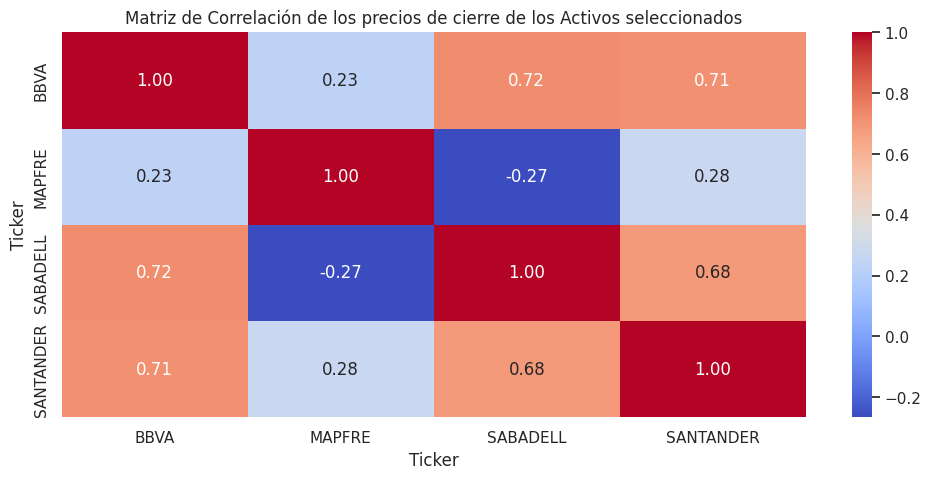


Matriz de Correlación de los precios de cierre de los Activos seleccionados:
Ticker         BBVA    MAPFRE  SABADELL  SANTANDER
Ticker                                            
BBVA       1.000000  0.230101  0.719788   0.712626
MAPFRE     0.230101  1.000000 -0.265415   0.275515
SABADELL   0.719788 -0.265415  1.000000   0.679551
SANTANDER  0.712626  0.275515  0.679551   1.000000


In [ ]:
selected_features = ['BBVA', 'MAPFRE', 'SABADELL', 'SANTANDER']
# Calcular la matriz de correlación de los activos
correlation_matrix = data[selected_features].corr()
# El método .corr() en un DataFrame de Pandas se utiliza para calcular la correlación entre las columnas
# numéricas del DataFrame. La correlación es una medida estadística que indica la relación lineal entre dos variables. El valor de la correlación varía entre -1 y 1,
# donde -1 indica una correlación negativa perfecta, 0 indica que no hay correlación y 1 indica una correlación positiva perfecta.

# Visualizar la matriz de correlación
plt.figure(figsize=(12, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlación de los precios de cierre de los Activos seleccionados')
plt.show()
# Imprimir la matriz de correlación
print("\nMatriz de Correlación de los precios de cierre de los Activos seleccionados:")
print(correlation_matrix)

A continuación se realiza un análisis de la Matriz de correlación de los activos financieros seleccionados:

- BBVA y SANTANDER: Tienen una correlación positiva fuerte de 0.712, que sugiere que tienden a moverse en la misma dirección en el mercado.

- BBVA y SABADELL: También muestran una correlación positiva significativa de 0.719, que indica que los precios de estos dos activos tienden a moverse juntos.

- MAPFRE y SABADELL: Tienen una correlación negativa moderada de -0.265, lo que sugiere que tienden a moverse en direcciones opuestas en el mercado.

- MAPFRE y SANTANDER: Muestran una correlación positiva moderada de 0.275, lo que indica una relación algo débil entre estos dos activos.

# **Propuesta final**

Después de analizar varios métodos y revisar los resultados obtenidos, se ha concluido del enfoque óptimo consistirá en un modelo de 4 clústeres, cada uno con las siguientes características. En un principio, consideramos incluir las 4 características más relevantes identificadas por Random Forest. Sin embargo, tras una investigación más profunda, hemos optado por seleccionar únicamente las 3 características más destacadas. Esto se justificará más adelante.

A continuación, presentamos el conjunto de datos final con las características seleccionadas.

In [ ]:
data_final = data.copy() # Copia de los datos originales
delete_final = ['BANKINTER', 'CAIXA', 'MAPFRE']
# Se eliminan caracteristicas de la selección original
data_final.drop(delete_final, axis = 1, inplace = True)

In [ ]:
data_final.columns

Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')

# **Evaluación de Modelos**.
Al construir modelos de aprendizaje automático, es común comparar múltiples modelos durante la fase de desarrollo. Posteriormente, evaluamos el rendimiento de estos modelos y seleccionamos aquel que se espera que tenga el mejor desempeño. Para tomar esta decisión de manera objetiva, es fundamental contar con medidas de desempeño. En este sentido, exploraremos diversas estrategias para evaluar modelos de aprendizaje automático en general, así como adaptaciones y consideraciones específicas a tener en cuenta para la tarea de previsión.

### **Métricas de Evaluación**

En este apartado, se proporcionará una explicación detallada de las métricas de evaluación utilizadas para analizar el desempeño de los modelos. Cada métrica desempeña un papel crucial en la evaluación de la precisión y el ajuste del modelo a los datos observados, ofreciendo una comprensión profunda de su capacidad predictiva y su capacidad para generalizar a datos no vistos.

- MSE (Error Cuadrático Medio): El MSE es una medida que calcula el promedio de los cuadrados de las diferencias entre los valores reales y los valores predichos por el modelo. Es una medida de la dispersión de los errores, cuanto más bajo sea el valor del MSE, mejor será el rendimiento del modelo, ya que indicará que las predicciones están más cerca de los valores reales.

- MAE (Error Absoluto Medio): El MAE es una medida que calcula el promedio de las diferencias absolutas entre los valores reales y los valores predichos por el modelo. El MAE proporciona una idea de cuánto se desvían, en promedio, las predicciones del valor real. Es una medida de la precisión del modelo, cuanto más bajo sea el valor de MAE, mejor será el rendimiento del modelo.

- RMSE (Raíz del Error Cuadrático Medio): El RMSE es simplemente la raíz cuadrada del MSE. Es una medida de dispersión similar al MSE, pero en la misma escala que los datos originales.

- MAPE (Error Porcentual Absoluto Medio): El MAPE es una medida que calcula el promedio de los errores porcentuales absolutos entre los valores reales y los valores predichos por el modelo. El MAPE expresa el error relativo como un porcentaje del valor real. Cuanto menor sea el MAPE, mejor será el rendimiento del modelo y es muy útil cuando se desea evaluar el rendimiento del modelo en términos de precisión porcentual.

- R2 (Coeficiente de Determinación): El R2 es una medida que indica cuánta variabilidad de los datos es explicada por el modelo. Representa la proporción de la variación de la variable dependiente que es predecible a partir de la variable independiente. Un valor de R2 más cercano a 1 indica un buen ajuste del modelo a los datos, lo que significa que el modelo explica una gran parte de la variabilidad observada en los datos. Un valor de R2 cercano a 0 indica que el modelo no es capaz de explicar la variabilidad en los datos y puede ser un indicador de un mal ajuste del modelo.

### **Función de Evaluación**

A continuación se especifica la función metricas_evaluacion que calcula y muestra las métricas de evaluación.

In [ ]:
# Función para mostrar las métricas de evlaución
def metricas_evaluacion(indices_finales, y_true, y_pred, nombre_modelo):
    # Función para calcular el error porcentual absoluto medio
    def error_porcentual_absoluto_medio(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    # Calcula las métricas de evaluación
    mse = metrics.mean_squared_error(y_true, y_pred)  # Error cuadrático medio
    mae = metrics.mean_absolute_error(y_true, y_pred)  # Error absoluto medio
    rmse = np.sqrt(mse)  # Raíz del error cuadrático medio
    mape = error_porcentual_absoluto_medio(y_true, y_pred)  # Error porcentual absoluto medio
    r2 = metrics.r2_score(y_true, y_pred)  # Coeficiente de determinación R2

    # Imprime los resultados
    print(f'Resultados de las métricas de evaluación para el modelo {nombre_modelo}:')
    print(f'Indices utilizados en el cojunto de datos final: {indices_finales.columns}')  # Imprimir columnas de data_final
    print(f'MSE: {mse}')  # Error cuadrático medio
    print(f'MAE: {mae}')  # Error absoluto medio
    print(f'RMSE: {rmse}')  # Raíz del error cuadrático medio
    print(f'MAPE: {mape}')  # Error porcentual absoluto medio
    print(f'R2: {r2}')  # Coeficiente de determinación R2

---
# **Pronóstico de Series de tiempo**
---



En este estudio, exploraremos una variedad de modelos de pronóstico de series temporales, desde los métodos tradicionales basados en modelos estadísticos hasta las técnicas más avanzadas de aprendizaje automático y redes neuronales.

Comenzaremos con modelos clásicos como ARIMA y sus variantes (AUTOARIMA, SARIMA), para luego investigar el modelo de Facebook Prophet. Después, avanzaremos hacia modelos de machine learning más sofisticados, como Random Forest y XGBoost, que aprovechan el poder del aprendizaje automático para capturar patrones complejos en los datos. Además, consideraremos la utilidad de las Máquinas de Vectores de Soporte (SVM) en el contexto del pronóstico de series temporales, examinando su capacidad para manejar datos estructurados y bien definidos.

Continuaremos explorando técnicas más avanzadas, como las redes neuronales recurrentes (LSTM), que son capaces de modelar dependencias a largo plazo en las series temporales, y las redes neuronales convolucionales (CNN), que pueden capturar patrones espaciales en los datos.

A lo largo de este estudio, evaluaremos el rendimiento de cada modelo utilizando métricas estándar de evaluación de pronósticos, como el error cuadrático medio (MSE), el error absoluto medio (MAE) y el coeficiente de determinación (R²). Además, analizaremos la escalabilidad, la interpretabilidad y la robustez de cada modelo para comprender sus ventajas y limitaciones en diferentes contextos de aplicación.

El objetivo primordial de esta investigación es proporcionar una comprensión integral y aplicada del pronóstico de series temporales. Se presentarán los modelos de manera progresiva, lo que permitirá un avance gradual hacia técnicas más avanzadas de aprendizaje automático y redes neuronales. Para cada uno de estos modelos, se han evaluado varias configuraciones, incluyendo valores reales, diferenciados de primer y segundo nivel, así como rendimientos simples y logarítmicos. Finalmente, debido a la extensión del estudio, se detallarán únicamente los modelos finales que han arrojado resultados más prometedores.


## **Modelo ARIMA.**

El modelo ARIMA (Autoregressive Integrated Moving Average) es una técnica estadística comúnmente empleada para prever tendencias futuras en datos de series temporales. Este enfoque, ampliamente utilizado en análisis financieros como la predicción de precios de acciones, combina componentes autoregresivos (AR) e integrados de media móvil (MA) para modelar las relaciones entre observaciones pasadas y predecir futuros movimientos de precios.

Este estudio se centra en la aplicación de ARIMA para modelar la serie temporal al IBEX35, ajustando el modelo a los datos históricos y evaluando su capacidad predictiva. Para el modelo ARIMA, es fundamental trabajar con datos univariados, lo que implica utilizar una única serie temporal como entrada. En esta primera fase de nuestro estudio, hemos seleccionado el BBVA como la variable de entrada y el IBEX35 como la variable objetivo. Esta elección se basa en el hecho de que el BBVA ha demostrado ser el activo financiero más prometedor en términos de rendimiento individual.


In [ ]:
# Selección del conjunto de datos para ARIMA a partir de los datos finales.
data_arima = data_final.copy()
# delete_arima = ['SABADELL', 'BBVA']
# delete_arima = ['SANTANDER', 'BBVA']
delete_arima = ['SANTANDER', 'SABADELL']
# Se eliminan caracteristicas no utilizadas para el modelo univariado
data_arima.drop(delete_arima, axis = 1, inplace = True)

# Dividir los datos en conjuntos de entrenamiento y prueba (80% entrenamiento, 20% prueba)
train_size = int(len(data_arima) * 0.8)
train_activo = data_arima['BBVA'][:train_size]
test_activo = data_arima['BBVA'][train_size:]
test_ibex35 = data_arima['IBEX35'][train_size:]

# Crear y ajustar el modelo ARIMA
modelo_ARIMA_activo = ARIMA(train_activo, order=(1, 0, 1))
model_fit_ARIMA_activo = modelo_ARIMA_activo.fit()
print(model_fit_ARIMA_activo.summary())

# Realizar predicciones sobre los datos de prueba
forecast_activo = model_fit_ARIMA_activo.forecast(steps=len(test_activo))

# Utilizar las predicciones del activo financiero para predecir el IBEX35 asumiendo que hay una relación lineal entre el activo y el IBEX35
# forecast_ibex35 contendrá las predicciones del IBEX35 utilizando el modelo ARIMA ajustado con los datos del activo
forecast_ibex35 = forecast_activo * (data_arima['IBEX35'].iloc[train_size - 1] / data_arima['BBVA'].iloc[train_size - 1])

                               SARIMAX Results                                
Dep. Variable:                   BBVA   No. Observations:                 3888
Model:                 ARIMA(1, 0, 1)   Log Likelihood                3875.123
Date:                Sat, 06 Apr 2024   AIC                          -7742.245
Time:                        08:57:34   BIC                          -7717.183
Sample:                             0   HQIC                         -7733.349
                               - 3888                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8916      0.600      8.148      0.000       3.715       6.068
ar.L1          0.9974      0.001    828.033      0.000       0.995       1.000
ma.L1          0.0645      0.013      5.141      0.0

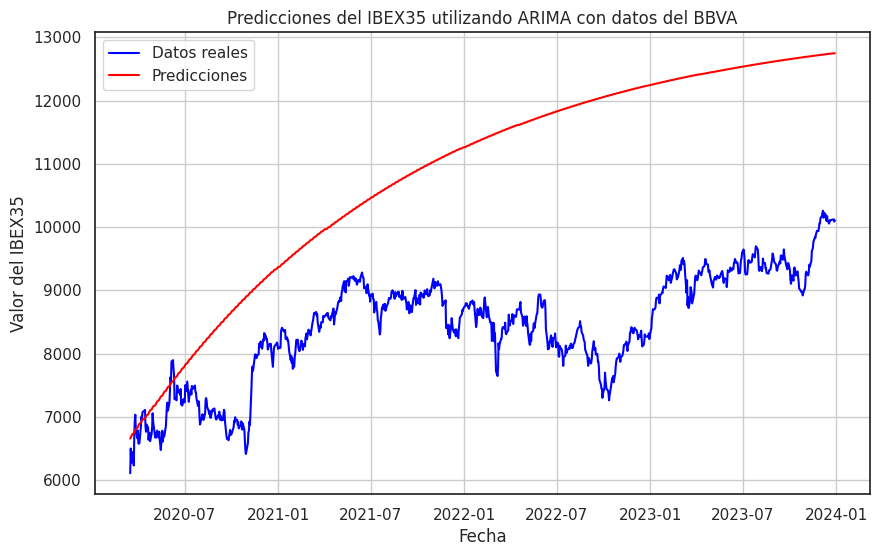

In [ ]:
# Imprimir las predicciones del IBEX35
plt.figure(figsize=(10, 6))

# Graficar los datos reales del IBEX35
plt.plot(test_ibex35.index, test_ibex35, label='Datos reales', color='blue')

# Graficar las predicciones del IBEX35
plt.plot(test_ibex35.index, forecast_ibex35, label='Predicciones', color='red')

plt.title('Predicciones del IBEX35 utilizando ARIMA con datos del BBVA')
plt.xlabel('Fecha')
plt.ylabel('Valor del IBEX35')
plt.legend()
plt.grid(True)
plt.show()


En la evaluación visual del rendimiento del modelo Arima en comparación con los datos reales disponibles. Inicialmente, se observa una ligera dispersión en las predicciones. Sin embargo, a medida que avanza en la predicción estas se alejan significativamente cada vez más y el modelo realiza predicciones que se no alinean con los valores reales, mostrando un pésimo ajuste.

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo Arima "
metricas_evaluacion(data_arima, test_ibex35, forecast_ibex35, nombre_modelo + 'BBVA')

Resultados de las métricas de evaluación para el modelo Modelo Arima BBVA:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'IBEX35'], dtype='object', name='Ticker')
MSE: 7191886.202300564
MAE: 2424.446414166257
RMSE: 2681.769229874294
MAPE: 28.453425581801966
R2: -8.896985618334122


En general, los resultados obtenidos en las métricas de evaluación sugieren que el modelo tiene un mal desempeño. Las métricas de evaluación, como el Error Cuadrático Medio (MSE), el Error Absoluto Medio (MAE) y la Raíz del Error Cuadrático Medio (RMSE), presentan valores significativamente altos. Estos valores indican que el modelo no está realizando predicciones precisas de las observaciones. Además, el Error Porcentual Absoluto Medio (MAPE) es elevado, lo que sugiere que las predicciones del modelo pueden diferir considerablemente del valor real en un porcentaje considerable. El hecho de que el coeficiente de determinación (R cuadrado) sea negativo es otro indicio de que el modelo no se ajusta bien a los datos. En este contexto, un valor negativo de R cuadrado sugiere que el modelo no es capaz de explicar la variabilidad de los datos de manera adecuada.

Como hemos podido comprobar en la grafica, y se ha confirmado con los resultados de las métricas de evaluación los valores no se ajustan adecuadamente. Con el fin de mejorar los resultados, se procederá a explorar otros modelos alternativos.

## **Modelo AUTOARIMA.**

AutoARIMA es una extensión del modelo ARIMA que automatiza el proceso de selección de los hiperparámetros del modelo, lo que lo hace más accesible y fácil de usar. Este enfoque utiliza técnicas de búsqueda automática para identificar los valores óptimos de p, d y q, los parámetros que determinan la estructura autoregresiva, integrada y de media móvil del modelo ARIMA.

Al igual que con ARIMA, AutoARIMA es especialmente útil en el análisis financiero para predecir los precios de las acciones. Su capacidad para ajustar automáticamente los parámetros del modelo a los datos históricos puede ayudar a mejorar la precisión de las predicciones y reducir el tiempo necesario para el ajuste del modelo.

Este apartado se enfocará en la aplicación de AutoARIMA Multivariado para modelar la serie temporal de precios de acciones. Exploraremos cómo AutoARIMA simplifica el proceso de modelado de series temporales y evaluaremos su rendimiento.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=49465.872, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=49464.955, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=49466.916, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=49466.915, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=49463.036, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.074 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 3888
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -24730.518
Date:                Sat, 06 Apr 2024   AIC                          49463.036
Time:                        08:57:36   BIC                          49469.302
Sample:                             0   HQIC                         49465.260
                               - 3888                                  

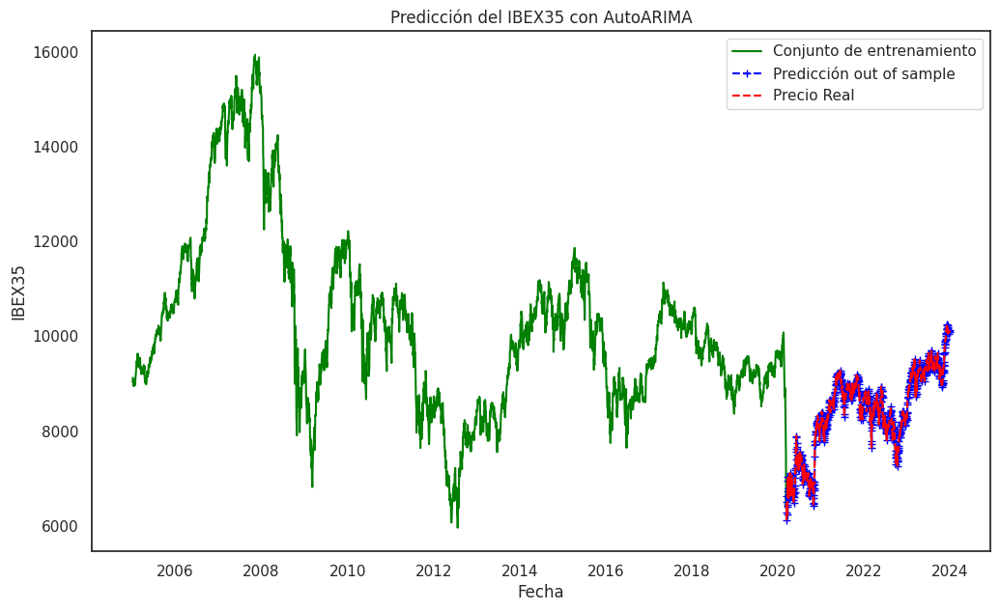

In [ ]:
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

# Dividir los datos en características (X) y variable objetivo (y)
X_arima = data_final.drop('IBEX35', axis=1).values
y_arima = data_final['IBEX35'].values

# Dividir los datos en conjuntos de entrenamiento y prueba (70% de entrenamiento, 30% de prueba)
train_size_arima = int(len(X_arima) * 0.8)
X_train_arima, X_test_arima, y_train_arima, y_test_arima = X_arima[:train_size_arima], X_arima[train_size_arima:], y_arima[:train_size_arima], y_arima[train_size_arima:]

# Ajuste del modelo AutoARIMA
modelo_autoarima = auto_arima(y_train_arima,  # Conjunto de datos de entrenamiento para ajustar el modelo ARIMA
                    start_p=1, start_q=1,  # Valores iniciales para los parámetros p y q
                    test='adf',  # Método de prueba de estacionariedad utilizando el test de Dickey-Fuller Aumentado (ADF)
                    max_p=10, max_q=10,  # Valores máximos posibles para los parámetros p y q
                    d=1,  # Orden de diferenciación para hacer la serie temporal estacionaria
                    seasonal=False,  # Indicación de que no se considera un componente estacional en el modelo ARIMA
                    trace=True,  # Muestra información detallada del proceso de búsqueda del modelo ARIMA
                    error_action='ignore',  # Ignora los errores que puedan ocurrir durante la búsqueda del modelo ARIMA
                    suppress_warnings=True,  # Suprime las advertencias durante el proceso de búsqueda
                    scoring='mse',  # Utiliza el error cuadrático medio (MSE) como medida de puntuación
                    stepwise=True)  # Utiliza un enfoque de búsqueda stepwise para encontrar el mejor modelo ARIMA

# Mejor modelo ARIMA encontrado por AutoARIMA
best_arima_order = modelo_autoarima.order
print(modelo_autoarima.summary())

# Ajuste del modelo ARIMA
history_arima = [x for x in y_train_arima]  # Se crea una lista inicialmente con las observaciones del conjunto de entrenamiento
model_predictions_arima = []  # Lista para almacenar las predicciones del modelo ARIMA
N_test_observations_arima = len(y_test_arima)  # Cantidad de observaciones en el conjunto de prueba

for time_point in range(N_test_observations_arima):  # Bucle para cada punto en el tiempo en el conjunto de prueba
    model_arima = ARIMA(history_arima, order=best_arima_order) # Se inicializa un modelo ARIMA con el historial de observaciones. Ajuste del modelo.
    model_fit_arima = model_arima.fit()  # Se ajusta el modelo ARIMA a los datos históricos
    output_arima = model_fit_arima.forecast()  # Se realiza una predicción para el siguiente punto en el tiempo
    yhat_arima = output_arima[0]  # Se extrae el valor de la predicción
    model_predictions_arima.append(yhat_arima)  # Se añade la predicción a la lista de predicciones del modelo
    true_test_value_arima = y_test_arima[time_point]  # Se obtiene el valor real del siguiente punto en el tiempo
    history_arima.append(true_test_value_arima)  # Se añade el valor real al historial para futuras predicciones

# Graficar resultados
plt.figure(figsize=(12, 7))
train_set_range_arima = data_final.index[:train_size_arima]
test_set_range_arima = data_final.index[train_size_arima:]
plt.plot(train_set_range_arima , y_train_arima, color='green',label='Conjunto de entrenamiento')
plt.plot(test_set_range_arima, model_predictions_arima, color='blue', marker='+', linestyle='dashed',label='Predicción out of sample')
plt.plot(test_set_range_arima, y_test_arima, color='red', linestyle='dashed', label='Precio Real')
plt.title('Predicción del IBEX35 con AutoARIMA')
plt.xlabel('Fecha')
plt.ylabel('IBEX35')
plt.legend()
plt.show()

A continuación graficamos los residuos del modelo AutoArima.

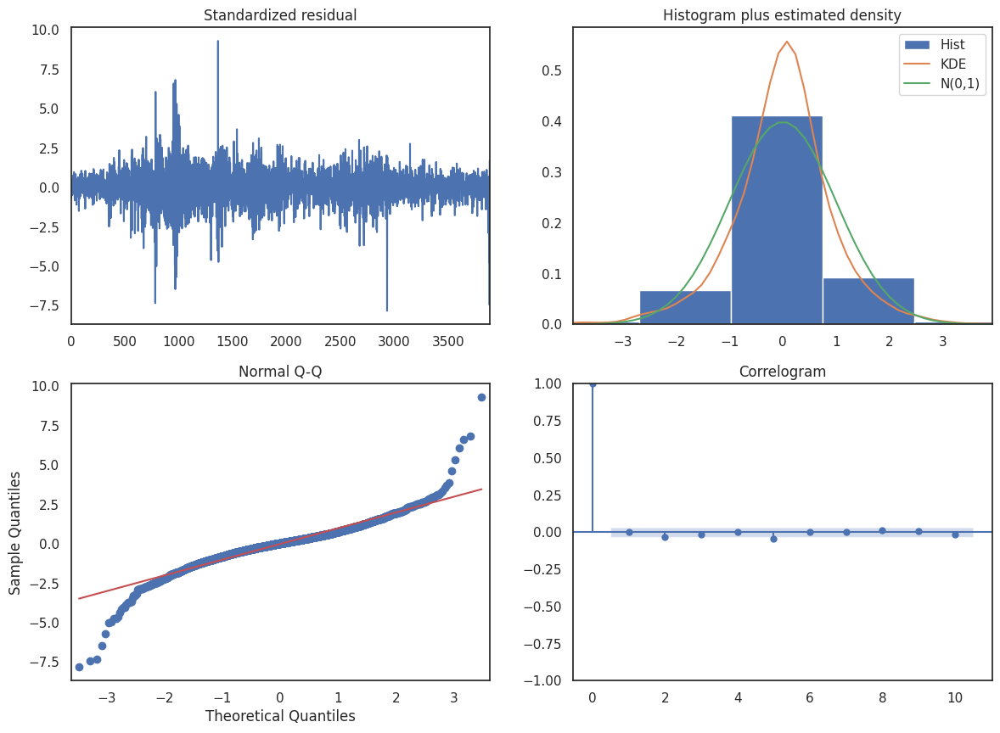

In [ ]:
#Graficamos los residuos
modelo_autoarima.plot_diagnostics(figsize=(14,10))
plt.show()

A continuación revisamos de forma visual los valores reales contra los valores predichos del índice del IBEX35.

In [ ]:
# Crear un DataFrame para comparar los valores reales y predichos
#comparison_df = pd.DataFrame({'Real': y_test_arima, 'Predicho': model_predictions_arima})
comparison_df = pd.DataFrame({'Real_IBEX35': y_test_arima, 'Predicho_IBEX35': model_predictions_arima}, index=test_set_range_arima)
print(comparison_df)

             Real_IBEX35  Predicho_IBEX35
Date                                     
2020-03-16   6107.200195      6629.600098
2020-03-17   6498.500000      6107.200195
2020-03-18   6274.799805      6498.500000
2020-03-19   6395.799805      6274.799805
2020-03-20   6443.299805      6395.799805
...                  ...              ...
2023-12-21  10104.299805     10101.000000
2023-12-22  10111.900391     10104.299805
2023-12-27  10121.799805     10111.900391
2023-12-28  10086.200195     10121.799805
2023-12-29  10102.099609     10086.200195

[973 rows x 2 columns]


A continuación se muestran los resultados de la función de evaluación.

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo AutoArima test"
metricas_evaluacion(data_final, y_test_arima, model_predictions_arima, nombre_modelo)

#Resultados de las métricas de evaluación para el modelo Modelo AutoArima test con MAPFRE:
#Indices utilizados en el cojunto de datos final: Index(['BBVA', 'MAPFRE', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
#MSE: 10248.887948956788
#MAE: 74.50287498795606
#RMSE: 101.23679147897165
#MAPE: 0.9154365344151323
#R2: 0.9858961760821109

Resultados de las métricas de evaluación para el modelo Modelo AutoArima test:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 10248.887948956788
MAE: 74.50287498795606
RMSE: 101.23679147897165
MAPE: 0.9154365344151323
R2: 0.9858961760821109


Estos resultados son las métricas de evaluación del modelo AutoArima aplicado a un conjunto de datos que incluye las acciones de los bancos BBVA, Sabadell, Santander y la variable objetivo del índice IBEX35. Los resultados indican que el modelo AutoArima tiene un rendimiento bastante bueno en la predicción de los valores del IBEX35, con un MSE, MAE y RMSE relativamente bajos dada la naturaleza de los datos financieros y la volatilidad asociada con el mercado de valores, también un valor MAPE bajo y un alto valor de R2, lo que sugiere que el modelo explica una gran proporción de la variabilidad en los datos.

Por otro lado, en la comparación de modelos aplicando el índice MAPFRE al conjunto de datos final y sin aplicarlo, se observa que ambos modelos presentan prácticamente las mismas métricas de evaluación. Esto sugiere que la adición del índice financiero MAPFRE no ha tenido un impacto significativo en el rendimiento predictivo del modelo. Por lo tanto, se ha determinado que la inclusión de "MAPFRE" no aporta un valor adicional al modelo. En consecuencia, se ha decidido eliminar este índice del conjunto de datos final. Esta acción se justifica en el hecho que simplifica el modelo al reducir el conjunto de datos.

A continuación se continua explorando otras técnicas de modelado alternativos para mejorar su desempeño.

## **Modelo SARIMA.**

El modelo SARIMA (Seasonal Autoregressive Integrated Moving Average) es una extensión del modelo ARIMA que incorpora la estacionalidad en los datos de series temporales, lo que mejora la precisión de las predicciones al capturar patrones estacionales.

Al aplicar SARIMA a la predicción del precio de las acciones, se aprovechan sus capacidades para modelar tanto los componentes de tendencia como los estacionales de la serie temporal. SARIMA permite incorporar la estacionalidad en diferentes períodos de tiempo, lo que es adecuado para pronosticar precios de acciones con patrones estacionales distintivos, como fluctuaciones diarias, semanales o anuales.

Este estudio explora cómo utilizar SARIMA para modelar la serie temporal de los precios de las acciones, ajustando el modelo a los datos históricos y evaluando su capacidad para generar predicciones precisas. SARIMA ofrece una estructura flexible que permite ajustar varios parámetros para adaptarse a diferentes patrones de datos, lo que lo convierte en una herramienta valiosa para analizar y pronosticar los movimientos del mercado financiero.

Además, existe una variante conocida como SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Factors), que permite la inclusión de variables exógenas en el modelo. Esto le confiere la capacidad de considerar la influencia de factores externos en la serie temporal, lo que amplía su utilidad en el análisis y pronóstico de datos financieros.

### **SARIMA con búsqueda de parámetros**

A continuación, se realizará el ajuste de un modelo utilizando el método de búsqueda automática de hiperparámetros AutoArima para determinar los mejores parámetros estacionales. Posteriormente, se ajustará el modelo mediante la clase SARIMAX con los parámetros óptimos encontrados, y se procederá a analizar su desempeño mediante la evaluación de métricas y la prueba de Ljung-Box para evaluar la autocorrelación de los residuos.

SARIMAX maneja automáticamente la distinción entre las variables endógenas y exógenas durante el ajuste del modelo. Las variables exógenas se proporcionan por separado como una matriz de características, que consisten en los valores de los índices utilizados como características para ayudar en la predicción. El modelo se ajusta para predecir la variable endógena, que en este caso es la serie temporal del IBEX35, en función de estas características exógenas.

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=9.47 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=58338.294, Time=0.18 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=50897.007, Time=7.56 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=55047.015, Time=10.06 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=58336.487, Time=0.12 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=51909.800, Time=1.18 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=50515.459, Time=21.55 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=32.68 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=11.12 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=58339.387, Time=4.10 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=50514.969, Time=23.10 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=50895.202, Time=9.30 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=36.71 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=15.47 sec
 ARIMA(3,0,0)(2,1,0)[12] int

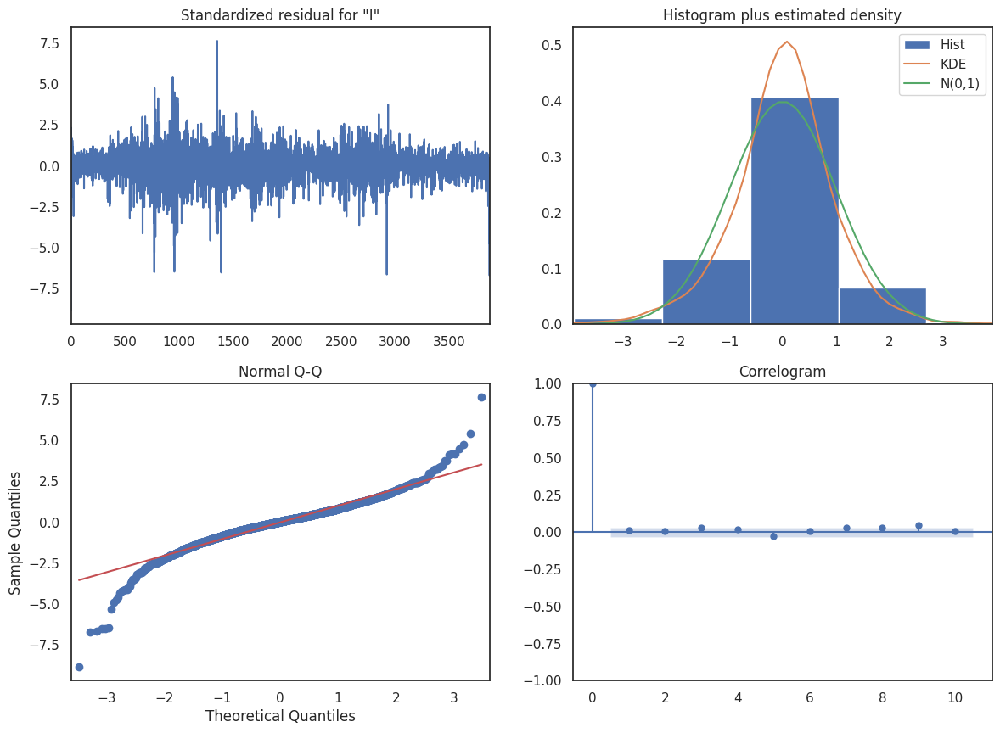

In [ ]:
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Seleccionar la serie temporal del IBEX35 como 'endog'
endog_data = data_final['IBEX35']

# Obtener el índice para dividir los datos
split_index = int(len(endog_data) * 0.8)

# Dividir los datos en conjuntos de entrenamiento y prueba
train_endog = endog_data.iloc[:split_index]
test_endog = endog_data.iloc[split_index:]

# Ajuste de ARIMA estacional utilizando stepwise auto-ARIMA
seasonal_model = auto_arima(train_endog, start_p=1, start_q=1, test='adf', max_p=5, max_q=5, m=12, start_P=0,
                            seasonal=True, d=None, D=1, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)

# Mejor modelo ARIMA encontrado por AutoARIMA
best_sarima_order = seasonal_model.order
best_seasonal_sarima_order = seasonal_model.seasonal_order

# Ajustar el modelo SARIMAX con los mejores parámetros encontrados
model = SARIMAX(train_endog, order=best_sarima_order, seasonal_order=best_seasonal_sarima_order)
results = model.fit()

# Imprimir el resumen del modelo
print(results.summary())

# Hacer predicciones
forecast = results.predict(start=split_index, end=len(endog_data)-1, dynamic=False, typ='levels')

# Comprobar el ruido blanco de los residuos
residuals = results.resid
lb_test_results = acorr_ljungbox(residuals, lags=[10], return_df=True)
print("Ljung-Box Test Results:")
print(lb_test_results)

# Imprimir los diagnósticos del modelo
results.plot_diagnostics(figsize=(14, 10))
plt.show()


A continuación se muestran los resultados de la función de evaluación.

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo Sarima"
metricas_evaluacion(data_final, test_endog, forecast, nombre_modelo)

Resultados de las métricas de evaluación para el modelo Modelo Sarima:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 3448058.8234852813
MAE: 1664.2364966908633
RMSE: 1856.8949414237957
MAPE: 18.960222657650103
R2: -3.744984504383254


A continuación, se realiza el análisis de las métricas de evaluación para el modelo:

- MSE (Error Cuadrático Medio): El valor es extremadamente alto, lo que indica que las predicciones del modelo están muy lejos de los valores reales. El modelo está cometiendo errores muy grandes al predecir el IBEX35.

- MAE (Error Absoluto Medio): El MAE también es alto, lo que indica que el modelo tiene dificultades para predecir con precisión los valores reales. El valor del MAE representa la magnitud promedio de los errores en las predicciones del modelo.

- RMSE (Raíz del Error Cuadrático Medio): Este valor es la raíz cuadrada del MSE y también es muy alto en este caso. Indica la magnitud promedio del error de las predicciones en la misma unidad que la variable de interés, en este caso, el IBEX35.

- MAPE (Error Porcentual Absoluto Medio): El MAPE es del 18.96%, lo que significa que, en promedio, las predicciones del modelo difieren en un 18.96% de los valores reales.

- R2 (Coeficiente de Determinación): El valor negativo de R2 sugiere que el modelo no se ajusta para nada a los datos.

Estos resultados indican que el modelo no es adecuado para predecir los valores del IBEX35.

### **SARIMA con rendimientos simples**.

                                      SARIMAX Results                                      
Dep. Variable:                              IBEX35   No. Observations:                 3887
Model:             SARIMAX(2, 0, 2)x(2, 1, [], 12)   Log Likelihood               10407.032
Date:                             Sat, 06 Apr 2024   AIC                         -20800.063
Time:                                     09:08:11   BIC                         -20756.227
Sample:                                          0   HQIC                        -20784.499
                                            - 3887                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9726      0.011    -88.389      0.000      -0.994      -0.951
ar.L2         -0.0141      

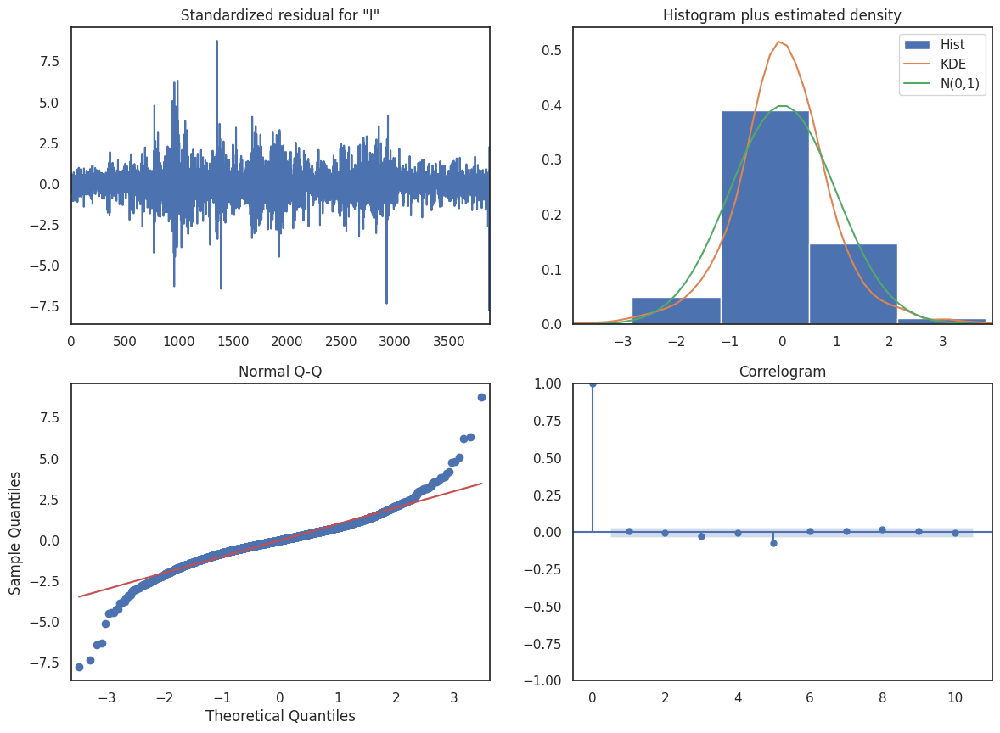

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Obtener los rendimientos simples del IBEX35
endog_data = data_final['IBEX35'].pct_change().dropna()

# Realizar la diferenciación de primer orden
endog_diff = endog_data.diff().dropna()

# Obtener el índice para dividir los datos
split_index = int(len(endog_diff) * 0.8)

# Dividir los datos en conjuntos de entrenamiento y prueba
train_endog = endog_diff.iloc[:split_index]
test_endog = endog_diff.iloc[split_index:]

# Ajuste de SARIMA estacional utilizando stepwise auto-SARIMA
model = SARIMAX(train_endog, order=(2, 0, 2), seasonal_order=(2, 1, 0, 12))

# Ajustar el modelo
results = model.fit()

# Imprimir el resumen del modelo
print(results.summary())

# Hacer predicciones
forecast = results.predict(start=split_index, end=len(endog_diff)-1, dynamic=False, typ='levels')

# Comprobar el ruido blanco de los residuos
residuals = results.resid
lb_test_results = acorr_ljungbox(residuals, lags=[10], return_df=True)
print("Ljung-Box Test Results:")
print(lb_test_results)

# Imprimir los diagnósticos del modelo
results.plot_diagnostics(figsize=(14, 10))
plt.show()

A continuación se muestran los resultados de la función de evaluación.


In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo Sarima con Rendimientos simples"
metricas_evaluacion(data_final, test_endog, forecast, nombre_modelo)

Resultados de las métricas de evaluación para el modelo Modelo Sarima con Rendimientos simples:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 0.0021558399102778393
MAE: 0.03817265962691578
RMSE: 0.04643102314485262
MAPE: 1091.427086869754
R2: -5.279183089575512


A continuación, se realiza un análisis de las métricas de evaluación para el modelo SARIMA. Se observa que el MAPE es muy alto y que el R2 presenta valores negativos, lo que sugiere que el modelo no se ajusta bien a los datos y puede no ser apropiado para hacer predicciones precisas con el conjunto de datos. Los valores elevados de MAPE indican que el modelo tiene dificultades para predecir con precisión los valores futuros.

En comparación con los dos modelos SARIMA, y aunque el modelo SARIMA con rendimientos simples logra mejorar en términos de MSE, MAE y RMSE,  presenta un MAPE significativamente más alto, lo que sugiere que puede no ser efectivo para predecir los valores futuros en términos de porcentaje. Ambos modelos muestran un R2 negativo, lo que sugiere que necesitan una revisión y ajustes adicionales para mejorar su rendimiento predictivo.

A continuación se continua explorando otras técnicas de modelado alternativos para mejorar su desempeño.

## **Modelo Prophet**

Prophet es una herramienta de código abierto desarrollada por el equipo de Facebook, diseñada específicamente para pronosticar series temporales con una amplia gama de aplicaciones, incluida la predicción de activos financieros. Utiliza un modelo aditivo que incorpora componentes estacionales anuales, semanales y diarios, así como efectos de días festivos y tendencias no lineales, lo que lo hace ideal para capturar la complejidad de los datos financieros.

Al aplicar Prophet a la predicción de acciones, se aprovechan sus capacidades para modelar patrones estacionales, tendencias cambiantes y efectos de días festivos en los precios de las acciones. Además, Prophet es robusto frente a datos faltantes y cambios en la tendencia, lo que lo convierte en una opción atractiva para pronosticar series temporales financieras que pueden estar sujetas a volatilidad y eventos imprevistos.

Este estudio explora cómo utilizar Prophet para modelar la serie temporal de los precios de las acciones, ajustando el modelo a los datos históricos y evaluando su capacidad para generar predicciones precisas. Prophet ofrece una interfaz fácil de usar y una capacidad de ajuste flexible.

DEBUG:cmdstanpy:input tempfile: /tmp/tmpyvb95mcc/wuhst70p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpyvb95mcc/q0enuam0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45791', 'data', 'file=/tmp/tmpyvb95mcc/wuhst70p.json', 'init=/tmp/tmpyvb95mcc/q0enuam0.json', 'output', 'file=/tmp/tmpyvb95mcc/prophet_model3eh5hq85/prophet_model-20240406090812.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:08:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:08:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


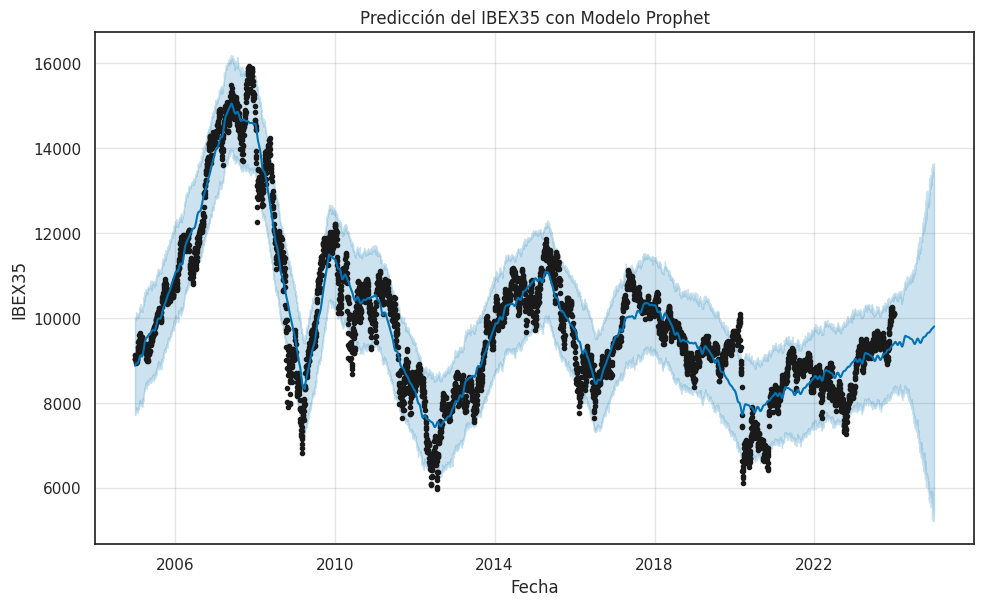

In [ ]:
# Inicializar el modelo Prophet
model = Prophet(
    seasonality_mode='additive',   # Modo aditivo para la estacionalidad
    yearly_seasonality=True,       # Estacionalidad anual
    weekly_seasonality=False,      # Sin estacionalidad semanal
    daily_seasonality=False,       # Sin estacionalidad diaria
    interval_width=0.95            # Intervalo de confianza del 95%
)

# Renombrar las columnas para ajustarse al formato de Prophet
df = data_final.reset_index().rename(columns={'Date': 'ds', 'IBEX35': 'y'})

# Ajustar el modelo a los datos
model.fit(df)

# Predecir para un rango de fechas futuro
future = model.make_future_dataframe(periods=365)  # Predecir un año adicional
forecast = model.predict(future)

# Visualizar la predicción
fig = model.plot(forecast)
plt.title('Predicción del IBEX35 con Modelo Prophet')
plt.xlabel('Fecha')
plt.ylabel('IBEX35')
plt.show()

# Métricas de evaluación
actual_values = df['y']
predicted_values = forecast['yhat'][:-365]  # Solo tomamos las predicciones para el período de datos original

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo Prophet para IBEX35"
metricas_evaluacion(data_final, actual_values, predicted_values, nombre_modelo)

Resultados de las métricas de evaluación para el modelo Modelo Prophet para IBEX35:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 323968.48711101495
MAE: 442.38372381685355
RMSE: 569.1822969058463
MAPE: 4.715291162335255
R2: 0.9058035695837888


El modelo Prophet tiene un rendimiento bastante bueno en términos de precisión de la predicción. El valor del MSE es aceptable y valor bajo del RMSE indica que las predicciones están cerca de los valores reales en promedio. El MAE también es relativamente bajo, lo que sugiere que las desviaciones entre las predicciones y los valores reales son pequeñas en promedio. Además, el MAPE es bajo lo que indica que las predicciones tienen un error porcentual bajo en promedio en comparación con los valores reales. Finalmente, el valor alto de R2 sugiere que el modelo explica una gran proporción de la varianza en los datos reales, señaladndo un buen ajuste del modelo.

A continuación se continua explorando otras técnicas de modelado alternativos para mejorar su desempeño.

##**Modelo Random Forest**



Random Forest es un algoritmo de aprendizaje automático ampliamente utilizado que se basa en la construcción de múltiples árboles de decisión durante el entrenamiento y la combinación de sus predicciones para mejorar la precisión y la generalización del modelo. Este enfoque lo hace adecuado para la predicción de series temporales financieras, donde se busca capturar relaciones complejas y no lineales entre las variables de entrada y la variable objetivo.

Al aplicar Random Forest a la predicción de acciones, se pueden utilizar los precios históricos de las acciones para entrenar el modelo. La capacidad de Random Forest para manejar grandes conjuntos de datos y su resistencia al sobreajuste lo convierten en una herramienta poderosa para la predicción precisa de los precios futuros de las acciones.

Este estudio explora cómo Random Forest puede ser implementado y ajustado para modelar la serie temporal de los precios de las acciones, evaluando su rendimiento en términos de precisión de predicción y capacidad para capturar patrones en los datos históricos.

Se han explorado varios modelos de Random Forest hasta lograr un ajuste óptimo. En el siguiente código, se emplea GridSearchCV para buscar los mejores hiperparámetros para el modelo mediante validación cruzada. Posteriormente, se entrena el modelo con los hiperparámetros óptimos encontrados y se evalúa su rendimiento. Finalmente, se visualiza la predicción del modelo junto con los valores reales.

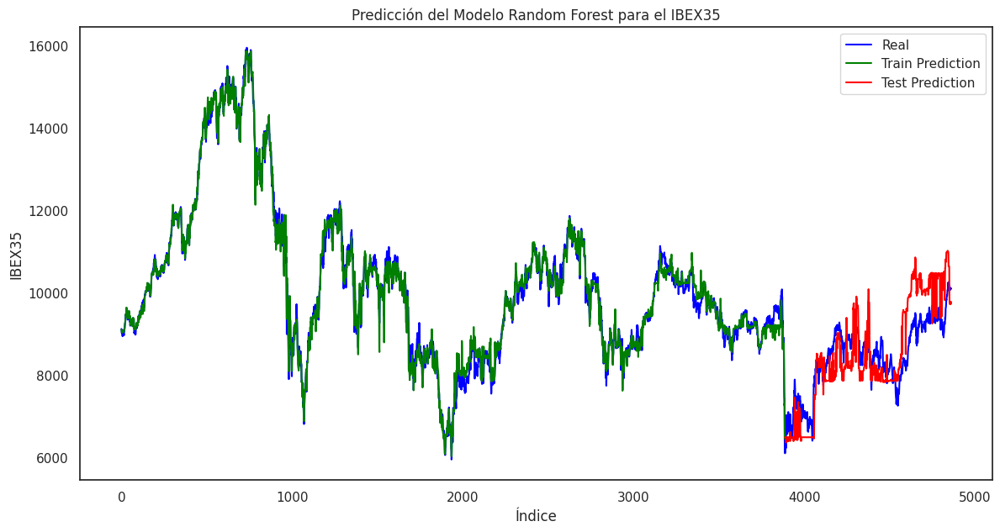

In [ ]:
# Separar las características (X) y la variable objetivo (y)
X = data_final.drop('IBEX35', axis=1)
y = data_final['IBEX35']

# Crear conjuntos de datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Definir los parámetros para la búsqueda de hiperparámetros con validación cruzada
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15]
}

# Crear el modelo Random Forest
rf_model = RandomForestRegressor(random_state=42)

# Realizar la búsqueda de hiperparámetros con validación cruzada
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=TimeSeriesSplit(n_splits=5),
                           scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo
best_rf_model = grid_search.best_estimator_

# Realizar predicciones
y_train_pred = best_rf_model.predict(X_train)
y_test_pred = best_rf_model.predict(X_test)

# Graficar la predicción del modelo con los valores reales
plt.figure(figsize=(14, 7))
plt.plot(np.arange(len(data_final)), data_final['IBEX35'], label='Real', color='blue')
plt.plot(np.arange(len(y_train_pred)), y_train_pred, label='Train Prediction', color='green')
plt.plot(np.arange(len(y_train_pred), len(data_final)), y_test_pred, label='Test Prediction', color='red')
plt.title('Predicción del Modelo Random Forest para el IBEX35')
plt.xlabel('Índice')
plt.ylabel('IBEX35')
plt.legend()
plt.show()

En la evaluación visual del rendimiento del modelo RandomForest en comparación con los datos reales disponibles. Inicialmente, se observa una ligera dispersión en las predicciones. Sin embargo, a medida que avanza en la predicción se van ajustando mejor y el modelo realiza predicciones que se alinean estrechamente con los valores reales, mostrando un buen ajuste. No osbtante, al final se vuelve a dispersar las predicciones en mayor medida. En general, el comportamiento del modelo es satisfactorio, capturando de manera efectiva la tendencia de los datos reales.

A continuación se muestran los resultados de la función de evaluación.

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo Random Forest para IBEX35"
metricas_evaluacion(data_final, y_train, y_train_pred, nombre_modelo + " Train")
print()
metricas_evaluacion(data_final, y_test, y_test_pred, nombre_modelo + " Test")

Resultados de las métricas de evaluación para el modelo Modelo Random Forest para IBEX35 Train:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 29028.69689827648
MAE: 110.66096202220402
RMSE: 170.37809982000763
MAPE: 1.1428489000044384
R2: 0.9916179311789599

Resultados de las métricas de evaluación para el modelo Modelo Random Forest para IBEX35 Test:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 482752.99281990185
MAE: 596.5720114042231
RMSE: 694.8042838237988
MAPE: 6.9605590265781325
R2: 0.3356680997513578


A continuación se realiza el análisis de los resultados para el modelo Random Forest.

En el conjunto de entrenamiento:

- El MSE es aceptable y las predicciones del modelo están cerca de los valores reales en promedio. El MAE es bajo indicando que las predicciones tienden a desviarse en promedio poco del valor real. El RMSE es bueno proporcionando una medida de la magnitud de los errores de predicción adecuada. En promedio, las predicciones del modelo están desviadas de los valores reales por alrededor de 170.39 puntos base. El MAPE es relativamente bajo, indicando que el modelo tiene una precisión aceptable en términos de porcentaje. Y el R2 es muy alto, lo que sugiere que el modelo explica el total de la variabilidad de los datos de entrenamiento.

En el conjunto de prueba:

- El MSE es significativamente más alto, lo que indica que las predicciones del modelo tienen grandes errores en comparación con los valores reales. El MAE también es más alto, lo que sugiere que las predicciones tienden a desviarse más en promedio en el conjunto de prueba en comparación con el conjunto de entrenamiento. El RMSE sugiere que los errores de predicción son más grandes en el conjunto de prueba en comparación con el conjunto de entrenamiento. El MAPE es más alto en comparación con el conjunto de entrenamiento, lo que indica que el modelo tiene una precisión de predicción más baja en términos de porcentaje en el conjunto de prueba. Y el R2 es relativamente bajo, lo que sugiere que el modelo explica solamente el 33% de la variabilidad.

Observamos como  los resultados para el conjunto de entrenamiento son significativamente mejores que para el conjunto de prueba Estos resultados sugieren que el modelo Random Forest está sobreajustando los datos de entrenamiento, lo que resulta en un rendimiento deficiente en el conjunto de prueba. Se necesitaría continuar afinando las técnicas de regularización y ajustando los hiperparámetros del modelo para mejorar su generalización y evitar el sobreajuste.

A continuación se continua explorando otras técnicas de modelado alternativos para mejorar su desempeño.


## **Modelo XGBoost**

XGBoost es una implementación escalable y eficiente de algoritmos de gradient boosting, diseñada para modelar relaciones complejas y realizar predicciones precisas en una variedad de problemas de aprendizaje automático, incluida la predicción de series temporales financieras. Al aplicar XGBoost a la predicción del precio de las acciones, se aprovecha su capacidad para aprender relaciones no lineales entre las características de entrada y las etiquetas de salida, lo que permite capturar patrones sutiles en los datos históricos y realizar pronósticos precisos sobre los precios futuros de las acciones.

Este trabajo explora cómo XGBoost puede ser utilizado para modelar la serie temporal de los precios de las acciones. XGBoost se destaca por su eficacia en la gestión de conjuntos de datos grandes y complejos, así como por su capacidad para evitar el sobreajuste, lo que lo convierte en una herramienta valiosa para la predicción de acciones en los mercados financieros.

XGBoost se destaca como otro algoritmo de aprendizaje automático ampliamente reconocido, a menudo superando el rendimiento de métodos como Random Forest. Su ventaja radica en la capacidad para manejar eficientemente datos de alta dimensión y grandes conjuntos de datos, mitigando el sobreajuste gracias a su capacidad de regularización integrada. Además, ofrece una optimización de hiperparámetros eficiente, facilitando el ajuste óptimo del modelo mediante una variedad de hiperparámetros y herramientas.

### **XGBoost Básico**

Se ha empleado un modelo de regresión XGBoost para anticipar los precios futuros de las acciones. Con el propósito de mejorar la eficacia del modelo, se ha realizado una búsqueda exhaustiva de hiperparámetros mediante validación cruzada utilizando GridSearchCV. En esta implementación, se ha preferido utilizar el estimador XGBRegressor de la biblioteca XGBoost, manteniendo la misma estrategia para la búsqueda de hiperparámetros.

Los datos han sido normalizados para garantizar una distribución estándar. En el contexto del modelo XGBoost, que se basa en árboles de decisión y no requiere la estacionalidad de los datos como lo harían los modelos ARIMA, se ha concluido que la diferenciación de los valores no es necesaria e incluso podría tener un efecto adverso en el rendimiento del modelo.

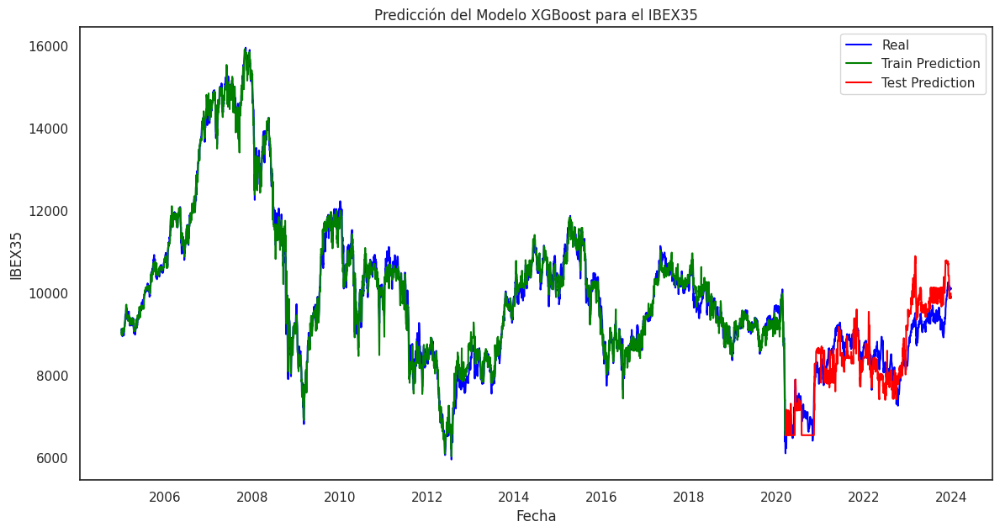

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Separar las características (X) y la variable objetivo (y)
X = data_final.drop('IBEX35', axis=1)
y = data_final['IBEX35']

# Crear conjuntos de datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Definir los parámetros para la búsqueda de hiperparámetros con validación cruzada
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15]
}

# Crear el modelo XGBoost
xgb_model = XGBRegressor(random_state=42)

# Realizar la búsqueda de hiperparámetros con validación cruzada
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=TimeSeriesSplit(n_splits=5),
                           scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo
best_xgb_model = grid_search.best_estimator_

# Realizar predicciones
y_train_pred = best_xgb_model.predict(X_train)
y_test_pred = best_xgb_model.predict(X_test)

# Graficar la predicción del modelo con los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y.index, y, label='Real', color='blue')
plt.plot(y_train.index, y_train_pred, label='Train Prediction', color='green')
plt.plot(y_test.index, y_test_pred, label='Test Prediction', color='red')
plt.title('Predicción del Modelo XGBoost para el IBEX35')
plt.xlabel('Fecha')
plt.ylabel('IBEX35')
plt.legend()
plt.show()

En la evaluación visual del rendimiento del modelo en comparación con los datos reales disponibles. Inicialmente, se observa un buen ajuste en las predicciones. Sin embargo, a medida que avanza en la predicción se van ajustando peor y el modelo realiza predicciones que no se alinean estrechamente con los valores reales, mostrando un mal ajuste. En general, el comportamiento del modelo es satisfactorio, capturando de manera efectiva la tendencia de los datos reales.

A continuación se muestran los resultados de la función de evaluación.

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo XGBoost para IBEX35"
metricas_evaluacion(data_final, y_train, y_train_pred, nombre_modelo + " Train")
print()
metricas_evaluacion(data_final, y_test, y_test_pred, nombre_modelo + " Test")

Resultados de las métricas de evaluación para el modelo Modelo XGBoost para IBEX35 Train:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 32518.348763098566
MAE: 128.2729532375257
RMSE: 180.3284469048036
MAPE: 1.3047230245055939
R2: 0.9906102902850228

Resultados de las métricas de evaluación para el modelo Modelo XGBoost para IBEX35 Test:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 247841.34109255834
MAE: 414.8606631993512
RMSE: 497.8366610571768
MAPE: 4.851455777901803
R2: 0.6589375694463776


A continuacón se realiza el analísis de las métricas de evaluación.

- En el conjunto de entrenamiento: El modelo XGBoost muestra un rendimiento bastante bueno con un bajo error y un alto coeficiente de determinación (R2), lo que sugiere que el modelo explica la variabilidad en los datos de manera muy efectiva.

- En el conjunto de prueba: El modelo sigue teniendo un rendimiento aceptable, pero se observa un aumento significativo en el error en comparación con el conjunto de entrenamiento, lo que indica que el modelo esta sobreajustando los datos de entrenamiento y no generalizando tan bien en datos nuevos.

A contntinuación se exploran técnicas de ajuste de hiperparámetros y la utilización de validación cruzada para mejorar el rendimiento y reducir el sobreajuste.

### **XGBoost Optimizado**


Se llevó a cabo una exhaustiva búsqueda de hiperparámetros para el modelo XGBoost, que incluyó parámetros adicionales como la tasa de aprendizaje (learning_rate) y los términos de regularización. El objetivo de esta búsqueda fue afinar el modelo y mejorar su capacidad para generalizar a nuevos datos.

Para este propósito, se implementó una validación cruzada junto con una búsqueda sistemática de los mejores hiperparámetros utilizando GridSearchCV de la biblioteca scikit-learn. Esta estrategia permitió explorar de manera eficiente un amplio espacio de hiperparámetros y seleccionar los más óptimos para el conjunto de datos específico.

Este enfoque metodológico riguroso y sistemático garantizó una evaluación exhaustiva del modelo XGBoost y su optimización para el conjunto de datos analizado.

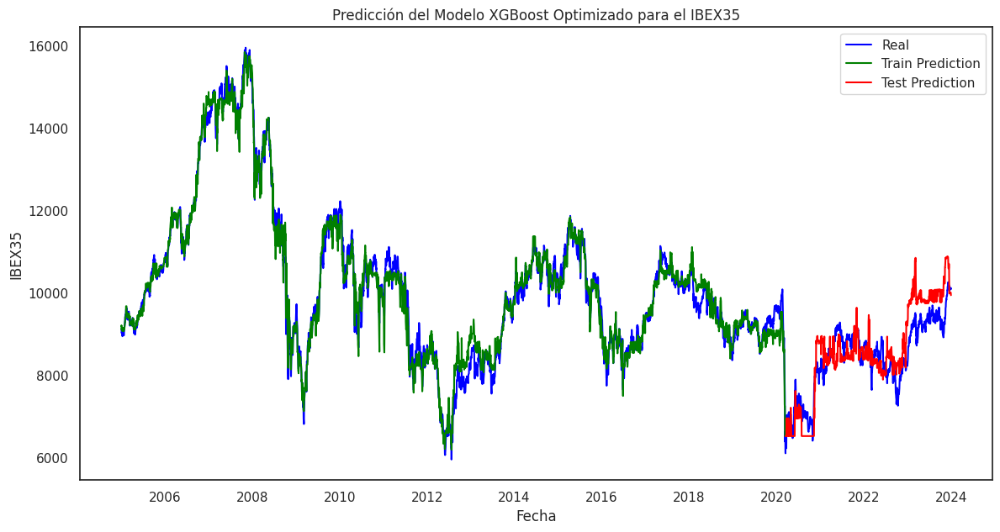

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# Separar las características (X) y la variable objetivo (y)
X = data_final.drop('IBEX35', axis=1)
y = data_final['IBEX35']

# Dividir los datos en conjunto de entrenamiento y prueba (80-20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Definir los parámetros para la búsqueda de hiperparámetros con validación cruzada
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.05, 0.1],
    'reg_alpha': [0, 0.001, 0.01],
    'reg_lambda': [0, 0.001, 0.01]
}

# Crear el modelo XGBoost
xgb_model = XGBRegressor(random_state=42)

# Realizar la búsqueda de hiperparámetros con validación cruzada
tscv = TimeSeriesSplit(n_splits=5)
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo
best_xgb_model = grid_search.best_estimator_

# Realizar predicciones
y_train_pred = best_xgb_model.predict(X_train)
y_test_pred = best_xgb_model.predict(X_test)

# Graficar la predicción del modelo con los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y.index, y, label='Real', color='blue')
plt.plot(y_train.index, y_train_pred, label='Train Prediction', color='green')
plt.plot(y_test.index, y_test_pred, label='Test Prediction', color='red')
plt.title('Predicción del Modelo XGBoost Optimizado para el IBEX35')
plt.xlabel('Fecha')
plt.ylabel('IBEX35')
plt.legend()
plt.show()

En la evaluación visual del rendimiento del modelo en comparación con el modelo anterior XGBoost básico no se observa una mejora significante de los resultados.

A continuación se muestran los resultados de la función de evaluación.

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo XGBoost Optimizado para IBEX35"
metricas_evaluacion(data_final, y_train, y_train_pred, nombre_modelo + " Train")
print()
metricas_evaluacion(data_final, y_test, y_test_pred, nombre_modelo + " Test")

Resultados de las métricas de evaluación para el modelo Modelo XGBoost Optimizado para IBEX35 Train:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 57475.4960318209
MAE: 174.31738231015302
RMSE: 239.74047641527056
MAPE: 1.7851165192557943
R2: 0.9834038859908057

Resultados de las métricas de evaluación para el modelo Modelo XGBoost Optimizado para IBEX35 Test:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 283417.7319135874
MAE: 447.4071989618127
RMSE: 532.3699201810592
MAPE: 5.258915513585113
R2: 0.6099797552647059


En comparación con el modelo XGBoost básico, este modelo optimizado muestra una mejora significativa en el rendimiento en el conjunto de entrenamiento, con valores de error más bajos y un R2 más alto, lo que indica un mejor ajuste a los datos de entrenamiento.

Sin embargo, en el conjunto de prueba, aunque el modelo sigue teniendo un rendimiento decente, el MSE y el RMSE son significativamente más altos en comparación con el modelo básico, lo que sugiere que el modelo optimizado esta sobreajustando los datos de entrenamiento y no generalizando  correctamente.

A continuación se muestran los resultados de la función de evaluación.

## **Modelo SVM**

Las Máquinas de Vectores de Soporte (SVM) son un tipo de algoritmo de aprendizaje supervisado que se utiliza comúnmente en problemas de clasificación y regresión. En el contexto de la predicción de acciones, las SVM ofrecen una metodología sólida para analizar datos financieros históricos y realizar predicciones precisas sobre el comportamiento futuro del mercado.

Para aplicar SVM a la predicción, se sigue un proceso que implica la recopilación y preprocesamiento de datos históricos, la selección de características relevantes, la construcción de un modelo SVM y la evaluación de su rendimiento. Además para evaluar su rendimiento es interesante graficar en la curva de aprendizaje. La curva de aprendizaje muestra cómo cambia la precisión del modelo a medida que se agregan más ejemplos de entrenamiento. Ayudando para detectar si el modelo se beneficia de más datos de entrenamiento o si está sufriendo de sobreajuste o subajuste.

En este trabajo, exploraremos cómo las SVM pueden ser utilizadas como herramientas efectivas en la predicción de acciones, proporcionando una alternativa robusta y eficiente para el análisis financiero y la toma de decisiones en los mercados bursátiles.

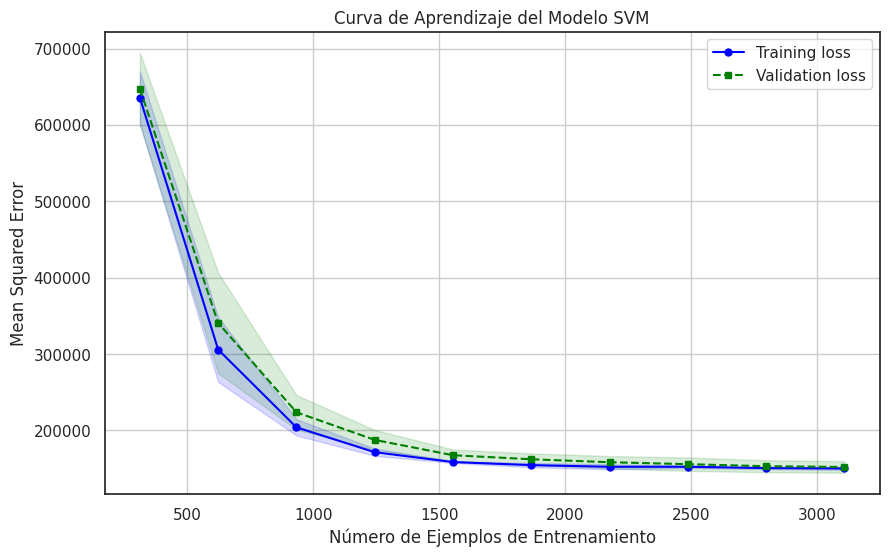

Resultados de las métricas de evaluación para el modelo Modelo SVM para IBEX35:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 148378.1975062066
MAE: 277.2101109519135
RMSE: 385.19890641875736
MAPE: 2.918086842394053
R2: 0.9591699608568168


In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Separar las características (X) y la variable objetivo (y)
X = data_final.drop('IBEX35', axis=1)
y = data_final['IBEX35']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Estandarizar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Entrenar el modelo SVM
svm = SVR(kernel='rbf', C=100, gamma='auto', epsilon=0.1)
svm.fit(X_train_scaled, y_train)

# Evaluar el modelo en los datos de prueba
y_pred = svm.predict(X_test_scaled)

# Calcular y graficar el error cuadrático medio
#plt.plot(y_test, label='True')
#plt.plot(y_pred, label='Predicted')
#plt.title('Predicción del modelo vs Valores reales')
#plt.xlabel('Índice')
#plt.ylabel('Precio')
#plt.legend()
#plt.show()

# Definir diferentes tamaños de conjunto de entrenamiento
train_sizes, train_scores, test_scores = learning_curve(svm, X_train_scaled, y_train, cv=5,
                                                        scoring='neg_mean_squared_error',
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

# Calcular las medias y desviaciones estándar de los puntajes
train_mean = -np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = -np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training loss')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation loss')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Curva de Aprendizaje del Modelo SVM')
plt.xlabel('Número de Ejemplos de Entrenamiento')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid()
plt.show()

# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo SVM para IBEX35"
metricas_evaluacion(data_final, y_test, y_pred, nombre_modelo)

El modelo SVM entrenado exhibe un rendimiento decente, como lo indican diversas métricas de evaluación. Los términos de MSE, MAE y RMSE, sugieren que las predicciones del modelo están relativamente cerca de los valores reales en el conjunto de datos de prueba. El MAPE es relativamente bajo, lo que significa que las predicciones del modelo tienen un bajo error porcentual medio absoluto en comparación con los valores reales. Y el valor de R2 es bastante alto, lo que indica que una gran proporción de la variabilidad en los datos de respuesta está explicada por el modelo ajustando bien a los datos de entrenamiento.

En resumen, estos resultados respaldan la eficacia del modelo SVM en la predicción, mostrando un ajuste robusto a los datos y una prometedora capacidad para la predicción para el IBEX35.

## **Modelo LSTM**


Las Redes Neuronales de Memoria a Largo Plazo (LSTM) son una arquitectura de redes neuronales recurrentes (RNN) diseñada para modelar secuencias de datos y capturar dependencias a largo plazo. La capacidad de las LSTM para manejar secuencias de datos con dependencias temporales a largo plazo las hace especialmente útiles en diversas aplicaciones de aprendizaje automático, como el procesamiento de secuencias y la predicción de series temporales. Este avance ha superado las limitaciones de las RNNs tradicionales, convirtiendo a las LSTM en una herramienta esencial en el campo del aprendizaje profundo.

Al aplicar LSTM a la predicción de acciones, se sigue un enfoque que implica la preparación de datos históricos, la construcción de la arquitectura LSTM, el entrenamiento del modelo y la evaluación de su rendimiento.

Este trabajo explora cómo las LSTM pueden capturar patrones complejos en los datos financieros históricos y aprender representaciones significativas que permitan realizar predicciones precisas sobre los precios futuros de las acciones.

### **LSTM Básico**

Este modelo representa la implementación inicial y básica de un LSTM para la predicción de series temporales. En el mismo no se han realizado ajustes en la arquitectura o los hiperparámetros.

Training Loss: 0.0001
Test Loss: 0.0147
486/486 [==============================] - 1s 2ms/step


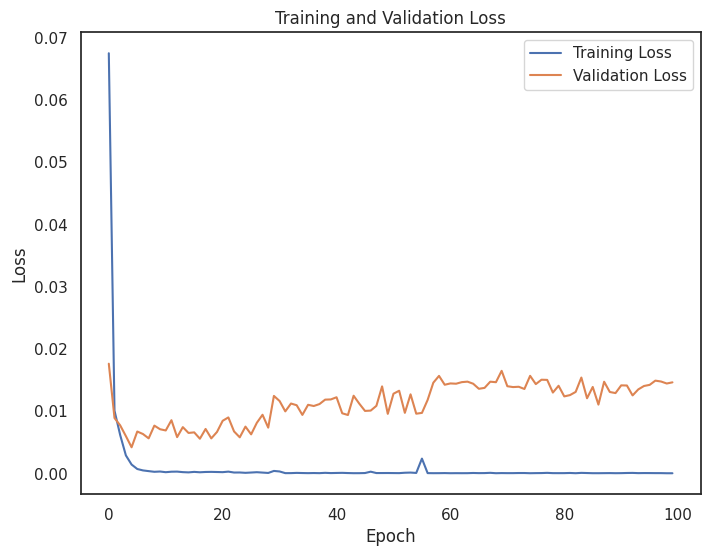

In [ ]:
# Normalizar los datos
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data_final.values.reshape(-1, 1))

# Dividir los datos en conjuntos de entrenamiento y prueba (80% de entrenamiento, 20% de prueba)
X_train, X_test, y_train, y_test = train_test_split(data_final.drop('IBEX35', axis=1), data_final['IBEX35'],
                                                    test_size=0.2, shuffle=False)
train_size = len(X_train)

# Preparar los datos para el modelo LSTM
def create_dataset(data, time_steps):
    X, y = [], []
    for i in range(len(data) - time_steps - 1):
        X.append(data[i:(i + time_steps), 0])
        y.append(data[i + time_steps, 0])
    return np.array(X), np.array(y)

time_steps = 12  # Número de pasos temporales
X_train, y_train = create_dataset(scaled_data[:train_size], time_steps)
X_test, y_test = create_dataset(scaled_data[train_size:], time_steps)

# Reformatear los datos para que sean compatibles con LSTM [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Construir el modelo LSTM
model = Sequential([
    LSTM(units=50, input_shape=(X_train.shape[1], 1)),
    Dense(units=1)
])

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Entrenar el modelo
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=0)
#verbose=0 eliminar la salida de información sobre las épocas durante el entrenamiento, verbose=2 muestra

# Evaluar el modelo
train_loss = model.evaluate(X_train, y_train, verbose=0)
test_loss = model.evaluate(X_test, y_test, verbose=0)
print(f'Training Loss: {train_loss:.4f}')
print(f'Test Loss: {test_loss:.4f}')

# Hacer predicciones
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Desnormalizar las predicciones
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)

# Graficar las pérdidas durante el entrenamiento
losses_lstm = history.history['loss']
val_losses_lstm = history.history['val_loss']
plt.figure(figsize=(8, 6))
plt.plot(range(len(losses_lstm)), losses_lstm, label='Training Loss')
plt.plot(range(len(val_losses_lstm)), val_losses_lstm, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo LSTM para IBEX35 "
metricas_evaluacion(data_final, y_train, train_predictions, nombre_modelo + "Train")
print()
metricas_evaluacion(data_final, y_test, test_predictions, nombre_modelo + "Test")

Resultados de las métricas de evaluación para el modelo Modelo LSTM para IBEX35 Train:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 38680249.70984369
MAE: 3077.510631612557
RMSE: 6219.344797472133
MAPE: 1219680249.6258092
R2: -332459726.4919333

Resultados de las métricas de evaluación para el modelo Modelo LSTM para IBEX35 Test:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 26798380.380107004
MAE: 2366.76556616103
RMSE: 5176.715211416116
MAPE: inf
R2: -414686503.06464124


El modelo parece tener un mejor rendimiento en el conjunto de prueba en comparación con el conjunto de entrenamiento en términos de todas las métricas, indicando que generaliza bien a datos no vistos. Sin embargo, el MAPE en el conjunto de prueba es infinito y los valores negativos R2 en ambos conjuntos de datos indican problemas con el ajuste del modelo. Estos resultados sugieren que el modelo LSTM necesita mejoras significativas para mejorar su capacidad predictiva y su capacidad de generalización.


### **LSTM Optimizado**

Este modelo refleja una versión mejorada y optimizada del LSTM, donde se han realizado ajustes en la arquitectura de la red, selección de hiperparámetros y otras técnicas de optimización para mejorar su rendimiento predictivo y capacidad de generalización.

A grandes rasgos indicar que se ha ajustado la arquitectura de la red agregando una capa LSTM adicional con return_sequences=True. Permiento que capture patrones en secuencias más largas, lo que mejora su capacidad para predecir.
Además, se ha implementado la técnica de Early Stopping, que detiene el entrenamiento cuando la pérdida en el conjunto de validación deja de disminuir. Evitando así el sobreajuste del modelo y mejorando la generalización de los datos no vistos.



Training Loss: 0.0032
Test Loss: 0.0068
31/31 [==============================] - 0s 2ms/step


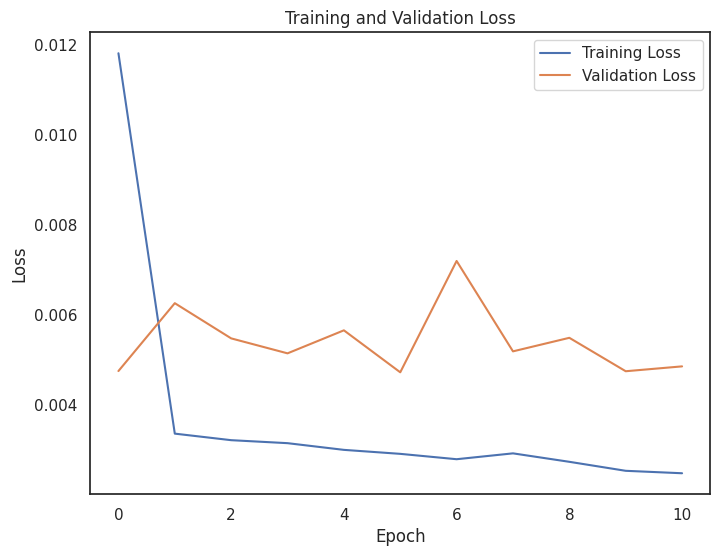

In [ ]:
# Normalizar los datos
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data_final.values)

# Preparar los datos para el modelo LSTM
def create_dataset(data, time_steps):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:(i + time_steps), :-1])  #Tomar todas las columnas excepto la última como características
        y.append(data[i + time_steps, -1])  # Tomar la última columna como variable objetivo
    return np.array(X), np.array(y)

time_steps = 12  # Número de pasos temporales
X, y = create_dataset(scaled_data, time_steps)

# Dividir los datos en conjuntos de entrenamiento y prueba (80% de entrenamiento, 20% de prueba)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Construir el modelo LSTM
model = Sequential([
    LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(units=50),
    Dense(units=1)
])

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Definir Early Stopping para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenar el modelo
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stopping],
                    verbose=0)

# Evaluar el modelo
train_loss = model.evaluate(X_train, y_train, verbose=0)
test_loss = model.evaluate(X_test, y_test, verbose=0)
print(f'Training Loss: {train_loss:.4f}')
print(f'Test Loss: {test_loss:.4f}')

# Hacer predicciones
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Graficar los resultados
#plt.figure(figsize=(10, 6))
#plt.plot(data_final.index[:len(train_predictions)], train_predictions, label='Train Predictions')
#plt.plot(data_final.index[len(train_predictions)+time_steps+1:len(train_predictions)+time_steps+len(test_predictions)+1], test_predictions, label='Test Predictions')
#plt.plot(data_final.index, data_final['IBEX35'], label='Actual Data')
#plt.title('Predicción del modelo LSTM vs Valores reales')
#plt.xlabel('Fecha')
#plt.ylabel('IBEX35')
#plt.legend()
#plt.show()

# Graficar las pérdidas durante el entrenamiento
losses_lstm = history.history['loss']
val_losses_lstm = history.history['val_loss']
plt.figure(figsize=(8, 6))
plt.plot(range(len(losses_lstm)), losses_lstm, label='Training Loss')
plt.plot(range(len(val_losses_lstm)), val_losses_lstm, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo LSTM optimizado para IBEX35 "
metricas_evaluacion(data_final, y_train, train_predictions, nombre_modelo + "Train")
print()
metricas_evaluacion(data_final, y_test, test_predictions, nombre_modelo + "Test")

Resultados de las métricas de evaluación para el modelo Modelo LSTM optimizado para IBEX35 Train:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 0.003212363464222405
MAE: 0.04380267527091976
RMSE: 0.0566777157639791
MAPE: inf
R2: 0.90785579006792

Resultados de las métricas de evaluación para el modelo Modelo LSTM optimizado para IBEX35 Test:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 0.006778113782387125
MAE: 0.06976665231268318
RMSE: 0.08232930087391199
MAPE: 62.35768035289189
R2: 0.053543225516667126


El modelo LSTM optimizado tiene un MSE significativamente más bajo tanto en los datos de entrenamiento como de prueba en comparación con el modelo básico. Esto indica que las predicciones del modelo optimizado están más cerca de los valores reales. El MAE del modelo LSTM optimizado es mucho más bajo en ambos conjuntos de datos en comparación con el modelo básico, lo que indica una mejora en la precisión de las predicciones. El RMSE del modelo LSTM optimizado es considerablemente menor en comparación con el modelo básico, lo que sugiere una mejor capacidad predictiva. El MAPE del LSTM optimizado tiene un MAPE continua con problemas. El R2 del modelo LSTM optimizado sigue siendo bastante bajo, lo que sugiere que el modelo optimizado puede no explicar bien la variabilidad en los datos de prueba.

En general, el modelo LSTM optimizado muestra una mejora significativa en todas las métricas de evaluación en comparación con el modelo básico. Esto indica que el modelo optimizado tiene un mejor rendimiento en la predicción del índice IBEX35, con errores más bajos y una mejor capacidad para capturar patrones en los datos. Sin embargo, es importante destacar que hay margen de mejora especialmente en los valores de R2.

Se continúa explorando otras estrategias de modelado alternativas para intentar mejorar la capacidad predictiva.

## **Modelo CNN**

Las Redes Neuronales Convolucionales (CNN) son herramientas poderosas en el campo del aprendizaje profundo que pueden capturar patrones complejos en datos multidimensionales. En el contexto de la predicción del precio de las acciones, las CNN ofrecen la capacidad de analizar datos financieros históricos y predecir tendencias futuras con precisión.

Para aplicar CNN a la predicción, se sigue un proceso que implica la recopilación y preprocesamiento de datos históricos, la construcción de una arquitectura de red neuronal convolucional, el entrenamiento del modelo y la evaluación de su rendimiento.

En este trabajo, exploraremos cómo las CNN pueden ser utilizadas para mejorar la precisión y la confiabilidad en la predicción de acciones, ofreciendo nuevas perspectivas en el análisis financiero y la predicción de series temporales.

### **CNN Básico**

31/31 [==============================] - 0s 1ms/step
Resultados de las métricas de evaluación para el modelo Modelo CNN para IBEX35:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 21458.281824814345
MAE: 108.23751238596955
RMSE: 146.48645611391638
MAPE: 1.1193367333721547
R2: 0.9941568904035258
Training Loss: 0.00017188287165481597
Testing Loss: 0.00021503891912288964


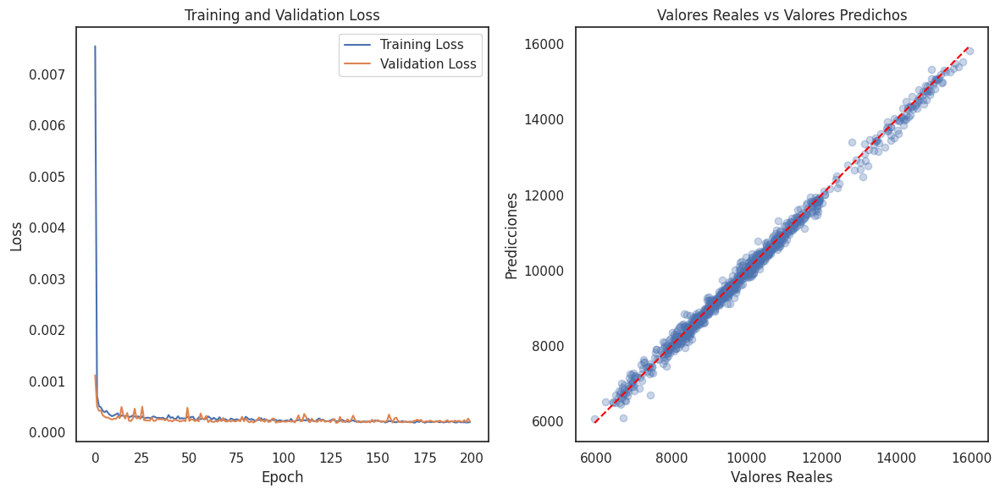

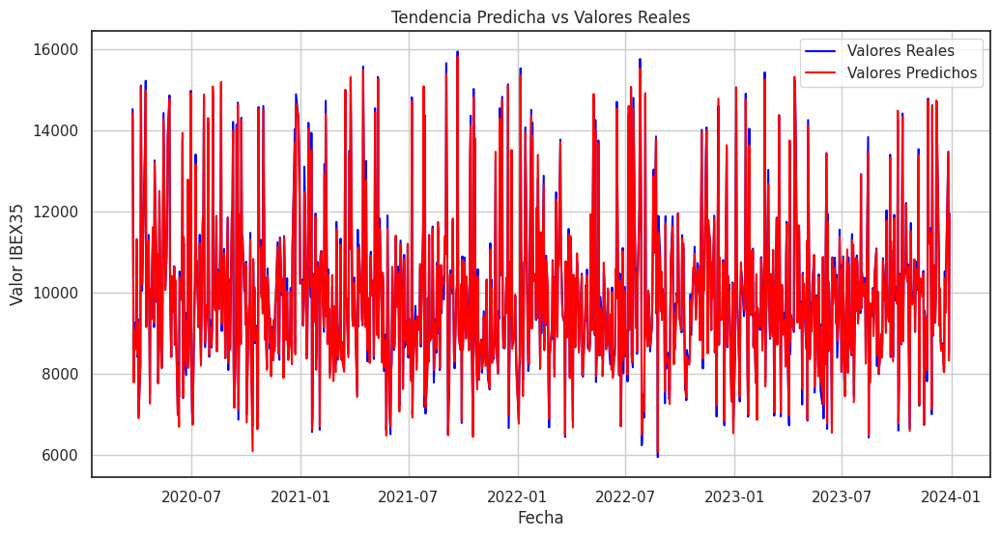

Fecha		Valores Reales	Valores Predichos
2023-12-29	10102.10		14416.09
2023-12-28	10086.20		10478.98
2023-12-27	10121.80		7795.71
2023-12-22	10111.90		9087.57
2023-12-21	10104.30		8615.81
2023-12-20	10101.00		11324.19
2023-12-19	10106.70		8483.07
2023-12-18	10054.90		9283.24
2023-12-15	10095.60		6911.23
2023-12-14	10171.70		8224.40


In [ ]:
# Separar las características (X) y la variable objetivo (y)
X = data_final.drop(['IBEX35'], axis=1) # BBVA SANTANDER SABADELL
y = data_final['IBEX35']

# Normalizar los datos
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data_final)

# Dividir los datos en entrenamiento y prueba
X = []
y = []
window_size = 30  # Tamaño de la ventana de tiempo
for i in range(len(scaled_data) - window_size):
    X.append(scaled_data[i:i+window_size])
    y.append(scaled_data[i+window_size][3])  # Predicción del precio de cierre del IBEX35

X = np.array(X)
y = np.array(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Construir el modelo CNN con Early Stopping y Dropout
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=32, kernel_size=5, activation='relu', input_shape=(window_size, 4)),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    #tf.keras.layers.Dropout(0.2),  # Añadir dropout para regularización
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    #tf.keras.layers.Dropout(0.2),  # Añadir dropout para regularización
    tf.keras.layers.Dense(1)
])

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenar el modelo con Early Stopping
history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test),
                    #callbacks=[early_stopping],
                    verbose=0)

# Evaluar el modelo
train_loss = model.evaluate(X_train, y_train, verbose=0)
test_loss = model.evaluate(X_test, y_test, verbose=0)

# Predecir sobre los datos de prueba
y_pred = model.predict(X_test)

# Invertir la escala de los datos para obtener los valores reales
y_pred = scaler.inverse_transform(np.concatenate((np.zeros((len(y_pred), 3)), y_pred), axis=1))[:, 3]
y_test = scaler.inverse_transform(np.concatenate((np.zeros((len(y_test), 3)), y_test.reshape(-1, 1)), axis=1))[:, 3]

# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo CNN para IBEX35"
metricas_evaluacion(data_final, y_test, y_pred, nombre_modelo)
print("Training Loss:", train_loss)
print("Testing Loss:", test_loss)

# Graficar el rendimiento del modelo
plt.figure(figsize=(12, 6))

# Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Scatter plot de predicciones vs valores reales
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot(np.linspace(min(y_test), max(y_test), 100), np.linspace(min(y_test), max(y_test), 100), color='red', linestyle='--')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Valores Reales vs Valores Predichos')

plt.tight_layout()
plt.show()

# Graficar la tendencia predicha
plt.figure(figsize=(12, 6))
# Graficar los valores reales
plt.plot(data_final.index[-len(y_pred):], y_test, label='Valores Reales', color='blue')
# Graficar los valores predichos
plt.plot(data_final.index[-len(y_pred):], y_pred, label='Valores Predichos', color='red')
plt.xlabel('Fecha')
plt.ylabel('Valor IBEX35')
plt.title('Tendencia Predicha vs Valores Reales')
plt.legend()
plt.grid(True)
plt.show()

# Seleccionar ultimos 10 días en orden descendente
ultimas_fechas = data.index[-10:][::-1]

# Filtrar las fechas de prueba para asegurarse de que estén dentro del rango de fechas disponibles en los datos
fechas_test_filtradas = [fecha for fecha in ultimas_fechas if fecha in data.index]

# Obtener los valores reales del IBEX35 correspondientes a las fechas de prueba filtradas
valores_reales_ibex35 = data.loc[fechas_test_filtradas, 'IBEX35'].values

# Imprimir las fechas, valores reales y valores predichos en texto
print("Fecha\t\tValores Reales\tValores Predichos")
for fecha, real, predicho in zip(fechas_test_filtradas, valores_reales_ibex35, y_pred):
    # Formatear la fecha
    fecha = fecha.strftime("%Y-%m-%d")
    print(f"{fecha}\t{real:.2f}\t\t{predicho:.2f}")

A continuación se muestran los resultados de la función de evaluación.

- MSE (Error Cuadrático Medio): El MSE tiene un valor bajo que indica que las predicciones están cerca de los valores reales.

- MAE (Error Absoluto Medio): El MAE tiene un valor bajo que indica una precisión general en las predicciones.

- RMSE (Raíz del Error Cuadrático Medio): El RMSE tiene un valor bajo que sugiere una precisión consistente en las predicciones.

- MAPE (Error Porcentual Absoluto Medio): El MAPE indica el error promedio como un porcentaje de los valores reales y tiene un valor muy bajo indicando una buena precisión en las predicciones.

- R2 (Coeficiente de Determinación): El R2 tine un valor excelente indicando que aproximadamente la totalidad de la variabilidad de los datos es explica por el modelo, sugiere un buen ajuste del modelo a los datos.

El modelo CNN tiene un desempeño excelente en la predicción del IBEX35, con errores bajos y un ajuste muy bueno a los datos reales.

### **CNN con Rendimientos**

31/31 [==============================] - 0s 1ms/step
Resultados de las métricas de evaluación para el modelo Modelo CNN para IBEX35:
Indices utilizados en el cojunto de datos final: Index(['BBVA', 'SABADELL', 'SANTANDER', 'IBEX35'], dtype='object', name='Ticker')
MSE: 20381.882650107647
MAE: 102.15854299056933
RMSE: 142.76513107235832
MAPE: 1.0617359310196548
R2: 0.9944499948747372
Training Loss: 0.00015990504471119493
Testing Loss: 0.0002042520500253886


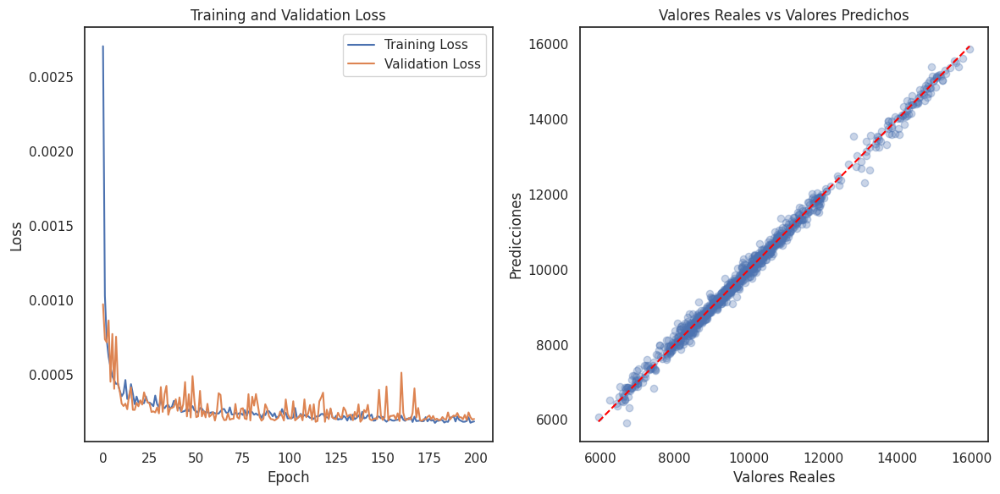

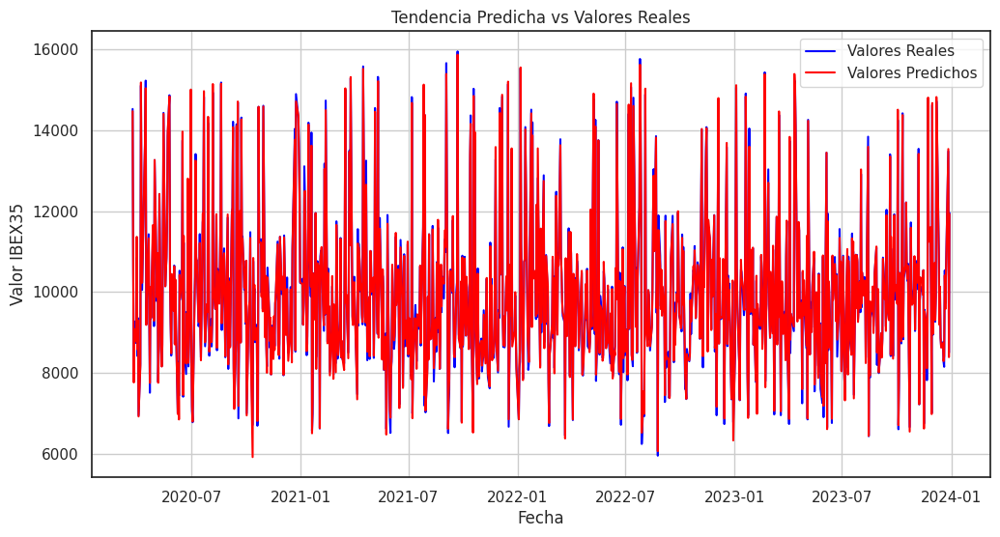

Fecha		Valores Reales	Valores Predichos
2023-12-29	10102.10		14466.80
2023-12-28	10086.20		10426.74
2023-12-27	10121.80		7765.39
2023-12-22	10111.90		9085.68
2023-12-21	10104.30		8774.91
2023-12-20	10101.00		11364.62
2023-12-19	10106.70		8583.56
2023-12-18	10054.90		9296.26
2023-12-15	10095.60		6925.05
2023-12-14	10171.70		8178.38


In [ ]:
# Separar las características (X) y la variable objetivo (y)
X = data_final.drop(['IBEX35'], axis=1) # BBVA SANTANDER SABADELL
y = data_final['IBEX35']

# Aplica la función pct_change() para obtener los rendimientos simples en X e y
#X = X.pct_change()
#y = y.pct_change()

# Aplica rendimientos logarítmicos en X e y
X = np.log(X)
y = np.log(y)

# Elimina los valores NaN
X.dropna(inplace=True)
y.dropna(inplace=True)

# Normalizar los datos
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data_final)

# Dividir los datos en entrenamiento y prueba
X = []
y = []
window_size = 30  # Tamaño de la ventana de tiempo
for i in range(len(scaled_data) - window_size):
    X.append(scaled_data[i:i+window_size])
    y.append(scaled_data[i+window_size][3])  # Predicción del precio de cierre del IBEX35

X = np.array(X)
y = np.array(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Construir el modelo CNN con Early Stopping y Dropout
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=32, kernel_size=5, activation='relu', input_shape=(window_size, 4)),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    #tf.keras.layers.Dropout(0.2),  # Añadir dropout para regularización
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    #tf.keras.layers.Dropout(0.2),  # Añadir dropout para regularización
    tf.keras.layers.Dense(1)
])

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenar el modelo con Early Stopping
history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test),
                    #callbacks=[early_stopping],
                    verbose=0)

# Evaluar el modelo
train_loss = model.evaluate(X_train, y_train, verbose=0)
test_loss = model.evaluate(X_test, y_test, verbose=0)

# Predecir sobre los datos de prueba
y_pred = model.predict(X_test)

# Invertir la escala de los datos para obtener los valores reales
y_pred = scaler.inverse_transform(np.concatenate((np.zeros((len(y_pred), 3)), y_pred), axis=1))[:, 3]
y_test = scaler.inverse_transform(np.concatenate((np.zeros((len(y_test), 3)), y_test.reshape(-1, 1)), axis=1))[:, 3]

# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo CNN para IBEX35"
metricas_evaluacion(data_final, y_test, y_pred, nombre_modelo)
print("Training Loss:", train_loss)
print("Testing Loss:", test_loss)

# Graficar el rendimiento del modelo
plt.figure(figsize=(12, 6))

# Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Scatter plot de predicciones vs valores reales
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot(np.linspace(min(y_test), max(y_test), 100), np.linspace(min(y_test), max(y_test), 100), color='red', linestyle='--')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Valores Reales vs Valores Predichos')

plt.tight_layout()
plt.show()

# Graficar la tendencia predicha
plt.figure(figsize=(12, 6))
# Graficar los valores reales
plt.plot(data_final.index[-len(y_pred):], y_test, label='Valores Reales', color='blue')
# Graficar los valores predichos
plt.plot(data_final.index[-len(y_pred):], y_pred, label='Valores Predichos', color='red')
plt.xlabel('Fecha')
plt.ylabel('Valor IBEX35')
plt.title('Tendencia Predicha vs Valores Reales')
plt.legend()
plt.grid(True)
plt.show()

# Seleccionar ultimos 10 días en orden descendente
ultimas_fechas = data.index[-10:][::-1]

# Filtrar las fechas de prueba para asegurarse de que estén dentro del rango de fechas disponibles en los datos
fechas_test_filtradas = [fecha for fecha in ultimas_fechas if fecha in data.index]

# Obtener los valores reales del IBEX35 correspondientes a las fechas de prueba filtradas
valores_reales_ibex35 = data.loc[fechas_test_filtradas, 'IBEX35'].values

# Imprimir las fechas, valores reales y valores predichos en texto
print("Fecha\t\tValores Reales\tValores Predichos")
for fecha, real, predicho in zip(fechas_test_filtradas, valores_reales_ibex35, y_pred):
    # Formatear la fecha
    fecha = fecha.strftime("%Y-%m-%d")
    print(f"{fecha}\t{real:.2f}\t\t{predicho:.2f}")


---
# **Conclusiones**
---


Después de analizar y evaluar los diferentes modelos estadísticos, modelos de Machine Learning y modelos de Inteligencia Artificial entrenados, se pueden extraer las siguientes conclusiones:

- El modelo AutoARIMA muestra un rendimiento sólido en términos de métricas de evaluación tanto en el conjunto de entrenamiento como en el de prueba.Ddemuestra una buena capacidad de generalización.

- El modelo SARIMA básico y su optimización con rendimientos simples presentan resultados deficientes en términos de métricas de evaluación. Sugierendo que el modelo no es adecuado para el conjunto de datos.

- El modelo Prophet muestra un rendimiento aceptable en términos de métricas de evaluación en el conjunto de datos de prueba. Sin embargo, el modelo puede tener errores significativos en las predicciones.

- El modelo Random Forest presenta un rendimiento sólido en el conjunto de entrenamiento, pero se ha identificado un sobreajuste.

- El modelo XGBoost estándar y optimizado muestran un rendimiento decente. El modelo XGBoost optimizado demuestra una mejor capacidad de generalización que el modelo estándar.

- El modelo SVM muestra un rendimiento aceptable en el conjunto de prueba, con un R2 muy alto. .

- El modelo LSTM muestra un rendimiento deficiente y el modelo tiene dificultades para generalizar a datos no vistos. El modelo LSTM optimizado muestra una mejora en comparación con el modelo LSTM estándar pero todavía tiene un rendimiento deficiente

- El modelo CNN presenta un rendimiento sólido en el conjunto de prueba, con un R2 de 0.99 y un MAPE bajo de 1.16. Esto indica que el modelo CNN es capaz de hacer predicciones precisas en datos no vistos.

En resumen, los modelos AutoARIMA, Prophet, Random Forest, SVM y CNN son los más prometedores, ya que muestran un buen rendimiento tanto en el conjunto de entrenamiento como en el de prueba. Especialmente los modelos AutoARIMA y CNN se destacan por su capacidad para realizar predicciones precisas y mantener un buen rendimiento tanto en los datos de entrenamiento como en los de prueba. Estos modelos podrían considerarse como los mejores para predecir el IBEX35 en base a los activos financieros.

---
# **Aplicación del Sistema de Predicción**
---

A continuación, se detalla la implementación del sistema de predicción seleccionado. El sistema de predicción se implementa mediante un modelo de Red Neuronal Convolucional (CNN) utilizando TensorFlow y Keras. Este modelo se basa en datos históricos de las acciones de BBVA, SABADELL y SANTANDER desde enero de 2005 hasta la fecha actual, fecha en la que se ejecute.

Primero, se preparan los datos calculando el retorno porcentual del IBEX35, depsués se normalizan los datos utilizando MinMaxScaler. Los datos se dividen en conjuntos de entrenamiento y prueba utilizando en la proporción de 80% para entrenamiento y 20% para test. Para la construcción del modelo, se utiliza una ventana de tiempo reducida y se ajustan los hiperparámetros de la arquitectura del modelo. Se implementan capas de convolución, capas de pooling y capas densas, permitiendo al modelo aprender patrones relevantes. El modelo se compila con el optimizador 'adam' y la función de pérdida 'mean_squared_error'.
Durante el entrenamiento, se utiliza Early Stopping para evitar el sobreajuste. Se evalúa su rendimiento en los conjuntos de entrenamiento y prueba y se realizan predicciones sobre los datos de prueba y se obtienen los datos reales.

Finalmente, se visualiza el rendimiento del modelo mostrando las curvas de pérdida durante el entrenamiento y validación, así como un diagrama de dispersión de los valores reales versus los valores predichos y se muestran los últimos valores predichos comparandolos con sus valores reales.

31/31 [==============================] - 0s 1ms/step
Resultados de las métricas de evaluación para el modelo Modelo CNN para IBEX35:
MSE: 26824.660384677776
MAE: 121.46724483815676
RMSE: 163.78235675639112
MAPE: 1.2522683691583523
R2: 0.9924489190676944
Training Loss: 0.00027714442694559693
Testing Loss: 0.0002688167442101985


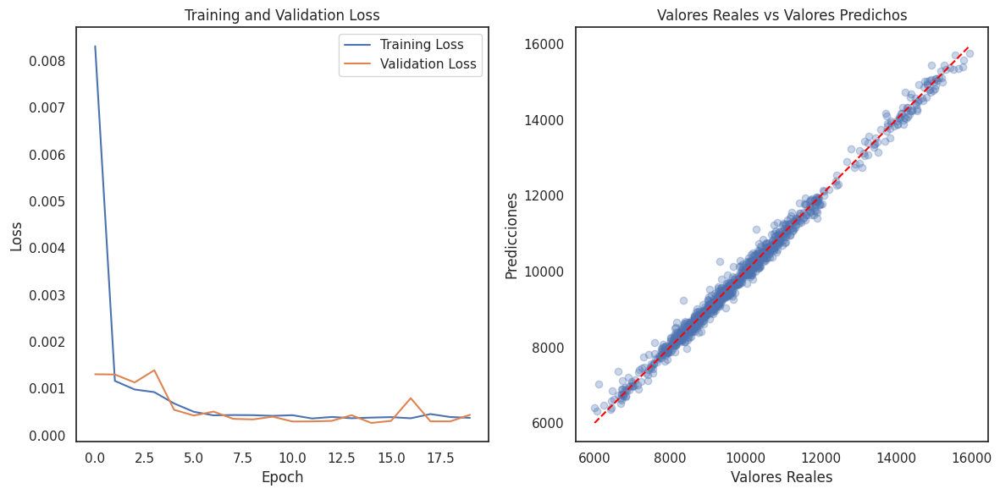

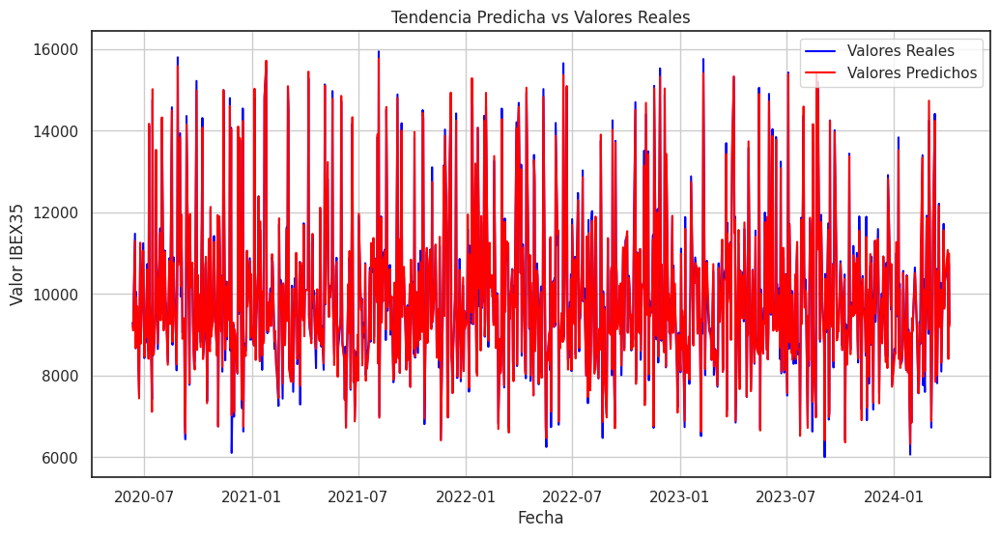

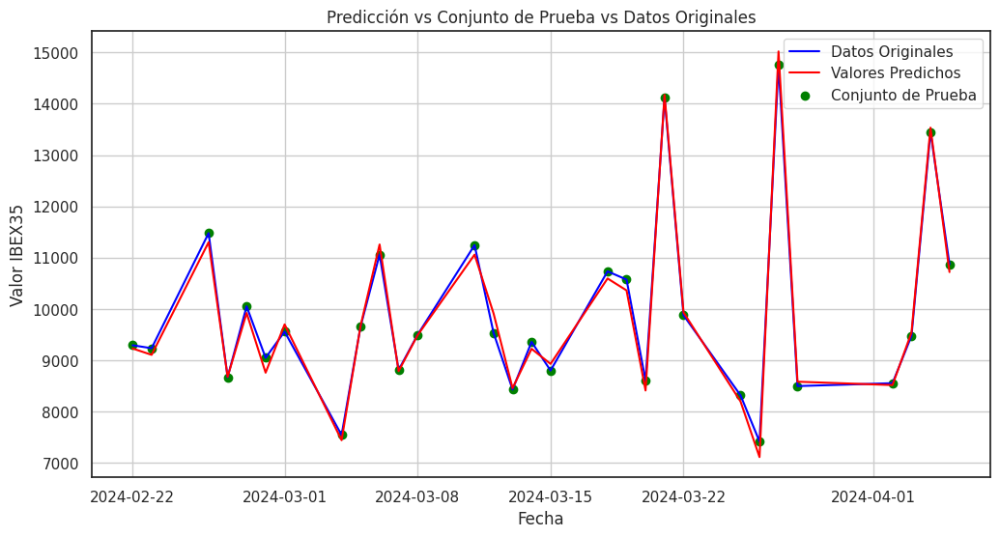

Valores Reales vs Valores Predichos
-----------------------------------
Valor Real: 10275.90 	 | Valor Predicho: 10105.24
Valor Real: 8101.00 	 | Valor Predicho: 8317.01
Valor Real: 10486.79 	 | Valor Predicho: 10596.16
Valor Real: 11720.09 	 | Valor Predicho: 11559.52
Valor Real: 9684.20 	 | Valor Predicho: 9640.76
Valor Real: 10285.90 	 | Valor Predicho: 10312.44
Valor Real: 10810.49 	 | Valor Predicho: 11079.50
Valor Real: 8832.19 	 | Valor Predicho: 8410.39
Valor Real: 10750.89 	 | Valor Predicho: 10995.78
Valor Real: 9282.10 	 | Valor Predicho: 9213.24


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
from datetime import datetime
import pandas as pd
import yfinance as yf
from sklearn import metrics
import matplotlib.pyplot as plt

# Función para mostrar las métricas de evaluación
def metricas_evaluacion(y_true, y_pred, nombre_modelo):
    # Función para calcular el error porcentual absoluto medio
    def error_porcentual_absoluto_medio(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    # Calcula las métricas de evaluación
    mse = metrics.mean_squared_error(y_true, y_pred)  # Error cuadrático medio
    mae = metrics.mean_absolute_error(y_true, y_pred)  # Error absoluto medio
    rmse = np.sqrt(mse)  # Raíz del error cuadrático medio
    mape = error_porcentual_absoluto_medio(y_true, y_pred)  # Error porcentual absoluto medio
    r2 = metrics.r2_score(y_true, y_pred)  # Coeficiente de determinación R2

    # Imprime los resultados
    print(f'Resultados de las métricas de evaluación para el modelo {nombre_modelo}:')
    print(f'MSE: {mse}')  # Error cuadrático medio
    print(f'MAE: {mae}')  # Error absoluto medio
    print(f'RMSE: {rmse}')  # Raíz del error cuadrático medio
    print(f'MAPE: {mape}')  # Error porcentual absoluto medio
    print(f'R2: {r2}')  # Coeficiente de determinación R2


# Cargar datos de Yahoo Finance
tickers = ['BBVA.MC', 'SAB.MC', 'SAN.MC', '^IBEX']
start_date = '2005-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')
data = yf.download(tickers, start=start_date, end=end_date, progress=False)['Adj Close']

# Missing valuees: primera técnica.Completar valores perdidos con método ffill
data.fillna(method='ffill', inplace=True)
# Aplicar interpolación sobre los datos rellenados
data.interpolate(method='linear', inplace=True)

# Missing valuees: segunda técnica.Completar valores perdidos con método ffill
data.fillna(method='ffill', inplace=True)
# data.fillna(data.median(), inplace=True)
# Aplicar interpolación sobre los datos rellenados
data.interpolate(method='linear', inplace=True)

# Renombrar las columnas
data.rename(columns={"BBVA.MC": "BBVA", "SAB.MC": "SABADELL", "SAN.MC": "SANTANDER", "^IBEX": "IBEX35"},
            inplace=True)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf

# Separar las características (X) y la variable objetivo (y)
X = data.drop(['IBEX35'], axis=1)
y = data['IBEX35']

# Aplica la función pct_change() para obtener los rendimientos simples en X e y
#X = X.pct_change()
#y = y.pct_change()

# Aplica rendimientos logarítmicos en X e y
#X = np.log(X)
#y = np.log(y)

# Elimina los valores NaN
#X.dropna(inplace=True)
#y.dropna(inplace=True)

# Normalizar los datos
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# Dividir los datos en entrenamiento y prueba
X = []
y = []
window_size = 30  # Tamaño de la ventana de tiempo
for i in range(len(scaled_data) - window_size):
    X.append(scaled_data[i:i+window_size])
    y.append(scaled_data[i+window_size][3])  # Predicción del precio de cierre del IBEX35

X = np.array(X)
y = np.array(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Construir el modelo CNN con Early Stopping y Dropout
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=32, kernel_size=5, activation='relu', input_shape=(window_size, 4)),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Dropout(0.001),  # Añadir dropout para regularización
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.001),  # Añadir dropout para regularización
    tf.keras.layers.Dense(1)
])

# Compilar el modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenar el modelo con Early Stopping
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test),
                    callbacks=[early_stopping],
                    verbose=0)

# Evaluar el modelo
train_loss = model.evaluate(X_train, y_train, verbose=0)
test_loss = model.evaluate(X_test, y_test, verbose=0)

# Predecir sobre los datos de prueba
y_pred = model.predict(X_test)

# Invertir la escala de los datos para obtener los valores reales
y_pred = scaler.inverse_transform(np.concatenate((np.zeros((len(y_pred), 3)), y_pred), axis=1))[:, 3]
y_test = scaler.inverse_transform(np.concatenate((np.zeros((len(y_test), 3)), y_test.reshape(-1, 1)), axis=1))[:, 3]

# Llamada a la función metricas_evaluacion para el modelo
nombre_modelo = "Modelo CNN para IBEX35"
metricas_evaluacion(y_test, y_pred, nombre_modelo)
print("Training Loss:", train_loss)
print("Testing Loss:", test_loss)

# Graficar el rendimiento del modelo
plt.figure(figsize=(12, 6))

# Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Scatter plot de predicciones vs valores reales
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot(np.linspace(min(y_test), max(y_test), 100), np.linspace(min(y_test), max(y_test), 100), color='red',
         linestyle='--')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Valores Reales vs Valores Predichos')

plt.tight_layout()
plt.show()

# Graficar la tendencia predicha
plt.figure(figsize=(12, 6))
# Graficar los valores reales
plt.plot(data.index[-len(y_pred):], y_test, label='Valores Reales', color='blue')
# Graficar los valores predichos
plt.plot(data.index[-len(y_pred):], y_pred, label='Valores Predichos', color='red')
plt.xlabel('Fecha')
plt.ylabel('Valor IBEX35')
plt.title('Tendencia Predicha vs Valores Reales')
plt.legend()
plt.grid(True)
plt.show()

# Graficar la predicción con sus datos, conjunto de prueba y valores predichos
plt.figure(figsize=(12, 6))
num_dias_mostrar = 30
# Graficar los datos originales
plt.plot(data.index[-num_dias_mostrar:], y_test[:num_dias_mostrar], label='Datos Originales', color='blue')
# Graficar los valores predichos
plt.plot(data.index[-num_dias_mostrar:], y_pred[:num_dias_mostrar], label='Valores Predichos', color='red')
# Marcar el conjunto de prueba
plt.scatter(data.index[-num_dias_mostrar:], y_test[:num_dias_mostrar], label='Conjunto de Prueba', color='green')
plt.xlabel('Fecha')
plt.ylabel('Valor IBEX35')
plt.title('Predicción vs Conjunto de Prueba vs Datos Originales')
plt.legend()
plt.grid(True)
plt.show()

# Imprimir los últimos valores reales vs valores predichos
# Seleccionar ultimos 10 días en orden descendente
ultimas_fechas = data.index[-10:][::-1]
# Filtrar las fechas de prueba para asegurarse de que estén dentro del rango de fechas disponibles en los datos
fechas_test_filtradas = [fecha for fecha in ultimas_fechas if fecha in data.index]
# Obtener los valores reales del IBEX35 correspondientes a las fechas de prueba filtradas
valores_reales_ibex35 = data.loc[fechas_test_filtradas, 'IBEX35'].values
print("Valores Reales vs Valores Predichos")
print("-----------------------------------")
for real, predicho in zip(y_test[-10:], y_pred[-10:]):
    print(f"Valor Real: {real:.2f} \t | Valor Predicho: {predicho:.2f}")

Estas métricas indican que el modelo tiene un excelente rendimiento en la predicción del IBEX35. Un MSE relativamente bajo, MAE y RMSE también bajos, y un R2 cercano a 1, el modelo se ajusta bien a los datos de entrenamiento y es capaz de hacer predicciones precisas. Además, tanto el Training Loss como el Testing Loss son muy bajos indicando que el modelo ha aprendido bien durante el entrenamiento y generaliza correctamente en los datos de prueba. El modelo se beneficia de entrenamientos más largos y todavía se puede visuaizar un pequeño sobreajuste, no obstante, en general, estos resultados sugieren que el modelo CNN optimizado es la mejor opción ya que logra un rendimiento mejor y es efectivo para predecir el valor del IBEX35 utilizando los datos históricos de BBVA, SABADELL y SANTANDER.